In [86]:
# [Cell 1] 라이브러리 설치 및 임포트
# 코드 실행 전에 필요한 패키지를 설치합니다.
# 설치 후에는 이 줄을 주석 처리하셔도 됩니다.

import os
import glob
import cv2
import gc
import time
import copy
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image, ImageOps

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, classification_report

# Grad-CAM 라이브러리
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# 경고 무시
import warnings
warnings.filterwarnings('ignore')

print("Library Loaded & Setup Complete.")

Library Loaded & Setup Complete.


In [87]:
# [Cell 2] 설정 및 하이퍼파라미터
# GPU 최대 활용 설정
# ============================================================================
# [User Configuration Area]
# ============================================================================
# 최적 Epoch 결정 로직:
# - Early Stopping (patience=10)으로 조기 종료
# - DenseNet: 20-25 에폭에서 수렴
# - EfficientNet-B0: 15-20 에폭에서 수렴  
# - ConvNeXt-Tiny: 25-30 에폭에서 수렴
# => 최적값: 30 에폭 (Early Stopping으로 20-25에 종료 기대)
EPOCHS = 100               # 학습 에폭 수 (테스트: 2 에폭으로 설정)
BATCH_SIZE = 32         # 배치 사이즈 (안정성 확보 후 32로 증가)
IMG_SIZE = 256          # 학습 입력 이미지 크기 (특징 추출 최적화를 위해 256)
LEARNING_RATE = 1e-4    # 기본 학습률
SEED = 42               # 재현성을 위한 랜덤 시드

# 마스킹 라인 바깥 영역색 및 padding의 색 일치 시킴.
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#!!=> Data_split을 삭제하고 MASK_BG_VALUE를 실행해야함.
MASK_BG_VALUE = 114   #회색 114 (균형, G1 <-> G3 사이)
#MASK_BG_VALUE = 0     # 검정 0 <- 최종 적용

# 데이터 로딩 최적화: GPU 활용을 위해 num_workers 설정
# Windows에서는 num_workers=0 권장 (메인 스레드에서 즉시 로딩)
NUM_WORKERS = 0  # Windows 최적화 (pin_memory=True로 GPU 전송 가속)

# Mixed Precision 학습 활성화 (VRAM 효율 + 학습 속도 향상)
USE_MIXED_PRECISION = True  # 일단 False로 설정하여 GPU 작동 확인

# Early Stopping 설정
EARLY_STOPPING_PATIENCE = 10  # 10 에폭 동안 개선 없으면 학습 중단

# 학습할 모델 선택 (1: 학습, 0: 건너뜀)
# 선택된 모델: DenseNet-121 (주요), ResNet, MobileNet (웹 배포 최적화), EfficientNet-B0, ConvNeXt-Tiny
MODEL_SELECTION = {
    'DenseNet-121': 1,         # 기본 DenseNet-121 (7M 파라미터) <- 주요 모델 ★
    'DenseNet-169': 1,         # 더 큰 DenseNet-169 (14M 파라미터) <- 균형
    'ResNet-18': 1,            # 경량 ResNet-18 (11.7M 파라미터) <- 빠른 성능
    'ResNet-50': 1,            # 표준 ResNet-50 (25M 파라미터) <- 비교용
    'MobileNetV3-Small': 1,    # 초경량 모델 (2.5M 파라미터, 웹 배포 최적 ⭐⭐⭐)
    'MobileNetV2': 1,          # 경량 모델 (3.5M 파라미터, 웹 배포 최적 ⭐⭐)
    'EfficientNet-B0': 1,      # 경량 모델 (5.3M 파라미터, 가장 빠름) <- 고속도 (효율성)
    'ConvNeXt-Tiny': 1         # 최신 경량 모델 (28M 파라미터, 최고 성능 기대)
}

# 경로 설정 (현재 폴더 기준 상대 경로)
ROOT_DIR = os.getcwd()
DATA_DIR = os.path.join(ROOT_DIR, 'Data')
RESULT_DIR = os.path.join(ROOT_DIR, 'Result')
RESULT_W_DIR = os.path.join(ROOT_DIR, 'Result_w')
SPLIT_DATA_DIR = os.path.join(ROOT_DIR, 'Data_split')

# 폴더 생성 (결과 저장 폴더)
os.makedirs(RESULT_DIR, exist_ok=True)
os.makedirs(RESULT_W_DIR, exist_ok=True)

# 시드 고정 함수 (재현성 보장)
def seed_everything(seed):
    """모든 난수 생성기를 고정하여 결과 재현 가능하게 함"""
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True 

# 학습 상태 모니터링용 유틸리티 함수
def format_time(seconds):
    """초를 분:초 형식으로 변환"""
    mins, secs = divmod(int(seconds), 60)
    return f"{mins}m {secs}s"

def print_training_header():
    """학습 시작 헤더 출력"""
    print("\n" + "="*100)
    print("EPOCH MONITORING | T_Loss | T_Acc | V_Loss | V_Acc | V_F1 | LR (Learning Rate) | Time/Epoch")
    print("="*100)

seed_everything(SEED)

# GPU 강제 사용 설정 (CUDA 사용 가능 여부를 먼저 명시적으로 확인)
print(f"\n>> CUDA 사용 가능 여부: {torch.cuda.is_available()}")
print(f">> GPU 개수: {torch.cuda.device_count()}")

# 명시적으로 GPU 디바이스 설정 (device 0 = NVIDIA RTX 4070)
device = torch.device('cuda:0')  # 직접 GPU 지정

# GPU 정보 출력 및 GPU 활성화
print(f"\n{'='*80}")
print(f">> GPU 활성화 설정 중...")
print(f"{'='*80}")
print(f">> Device: {device}")
print(f">> GPU 모델: {torch.cuda.get_device_name(device)}")
print(f">> CUDA 버전: {torch.version.cuda}")
print(f">> PyTorch 버전: {torch.__version__}")
print(f">> GPU 메모리: {torch.cuda.get_device_properties(device).total_memory / 1e9:.1f}GB")

# GPU 워밍업 (첫 번째 연산으로 GPU 활성화)
try:
    dummy_tensor = torch.randn(512, 512, device=device)
    dummy_result = dummy_tensor @ dummy_tensor
    torch.cuda.synchronize(device)
    del dummy_tensor, dummy_result
    print(f">> GPU 워밍업 완료\n")
except Exception as e:
    print(f"!! GPU 활성화 오류: {e}\n")
    device = torch.device('cpu')  # 실패 시 CPU 폴백

print(f"{'='*80}\n")

print(f"\n>> 학습 설정 요약:")
print(f"  - Epochs: {EPOCHS} (Early Stopping으로 조기 종료 가능)")
print(f"  - Batch Size: {BATCH_SIZE}")
print(f"  - Image Size: {IMG_SIZE}x{IMG_SIZE}")
print(f"  - Mixed Precision: {USE_MIXED_PRECISION}")
print(f"  - Early Stopping Patience: {EARLY_STOPPING_PATIENCE}")
print(f"  - 학습 모델 수: {sum(MODEL_SELECTION.values())}")
print(f"  - CPU 병렬 데이터 로더 워커: {NUM_WORKERS}")
print(f"  - >> 8가지 모델 포함: DenseNet-121(주요), ResNet 계열, MobileNet(웹 배포 최적화)")


>> CUDA 사용 가능 여부: True
>> GPU 개수: 1

>> GPU 활성화 설정 중...
>> Device: cuda:0
>> GPU 모델: NVIDIA GeForce RTX 4070 Laptop GPU
>> CUDA 버전: 12.6
>> PyTorch 버전: 2.10.0+cu126
>> GPU 메모리: 8.6GB
>> GPU 워밍업 완료



>> 학습 설정 요약:
  - Epochs: 100 (Early Stopping으로 조기 종료 가능)
  - Batch Size: 32
  - Image Size: 256x256
  - Mixed Precision: True
  - Early Stopping Patience: 10
  - 학습 모델 수: 8
  - CPU 병렬 데이터 로더 워커: 0
  - >> 8가지 모델 포함: DenseNet-121(주요), ResNet 계열, MobileNet(웹 배포 최적화)


In [88]:
# [Cell 3] 데이터 전처리 및 분류 폴더 구조 생성
# 곰팡이 마스킹(배경 색상) -> Crop -> 클래스별 폴더 저장

CLASSES = {0: 'G1', 1: 'G2', 2: 'G3', 3: 'G4'}

def create_masked_dataset(source_dir, target_dir):
    if os.path.exists(target_dir):
        print(f"'{target_dir}' already exists. Skipping data generation to save time.")
        # 데이터가 바뀌었다면 이 폴더를 수동으로 삭제하고 다시 실행하세요.
        return

    print(f"Generating Classification Dataset in '{target_dir}'...")

    for split in ['train', 'valid', 'test']:
        img_path = os.path.join(source_dir, split, 'images')
        lbl_path = os.path.join(source_dir, split, 'labels')
        
        if not os.path.exists(img_path): continue
        
        # 타겟 폴더 생성
        for cls_name in CLASSES.values():
            os.makedirs(os.path.join(target_dir, split, cls_name), exist_ok=True)

        img_files = glob.glob(os.path.join(img_path, '*.jpg')) + glob.glob(os.path.join(img_path, '*.png'))
        
        for file in tqdm(img_files, desc=f"Processing {split}"):
            filename = os.path.basename(file)
            txt_name = os.path.splitext(filename)[0] + '.txt'
            txt_full_path = os.path.join(lbl_path, txt_name)
            
            if not os.path.exists(txt_full_path): continue

            # 이미지 로드 (BGR)
            img = cv2.imread(file)
            h, w = img.shape[:2]

            with open(txt_full_path, 'r') as f:
                lines = f.readlines()
                
            for idx, line in enumerate(lines):
                parts = list(map(float, line.strip().split()))
                cls_id = int(parts[0])
                if cls_id not in CLASSES: continue
                
                # 마스크 초기화 (검정색 배경)
                mask = np.zeros((h, w), dtype=np.uint8)
                
                # YOLO 포맷 파싱 (Polygon vs Box)
                if len(parts) > 5: # Polygon Segmentation
                    coords = np.array(parts[1:]).reshape(-1, 2)
                    coords[:, 0] *= w
                    coords[:, 1] *= h
                    pts = coords.astype(np.int32)
                    cv2.fillPoly(mask, [pts], 255)
                    
                    # Bounding Box for cropping
                    x, y, bw, bh = cv2.boundingRect(pts)
                    
                else: # Standard Box (x_center, y_center, w, h)
                    cx, cy, bw_n, bh_n = parts[1], parts[2], parts[3], parts[4]
                    bw, bh = int(bw_n * w), int(bh_n * h)
                    x = int((cx * w) - (bw / 2))
                    y = int((cy * h) - (bh / 2))
                    
                    # Box 영역만 흰색 마스크
                    cv2.rectangle(mask, (x, y), (x+bw, y+bh), 255, -1)

                # 좌표 보정
                x = max(0, x); y = max(0, y)
                bw = min(w-x, bw); bh = min(h-y, bh)
                
                if bw < 5 or bh < 5: continue # 너무 작은 조각 무시

                # 이미지 마스킹 (배경 색상으로 채우기)
                bg = np.full_like(img, MASK_BG_VALUE)
                mask_3c = mask[:, :, None]
                masked_img = np.where(mask_3c == 255, img, bg)
                
                # 해당 객체 영역만 Crop
                crop_img = masked_img[y:y+bh, x:x+bw]
                
                # 저장
                save_name = f"{os.path.splitext(filename)[0]}_{idx}.jpg"
                save_path = os.path.join(target_dir, split, CLASSES[cls_id], save_name)
                cv2.imwrite(save_path, crop_img)

create_masked_dataset(DATA_DIR, SPLIT_DATA_DIR)
print("Data Preparation Done.")

'c:\yssong\Mid_project\Mold-Pang_final\Data_split' already exists. Skipping data generation to save time.
Data Preparation Done.


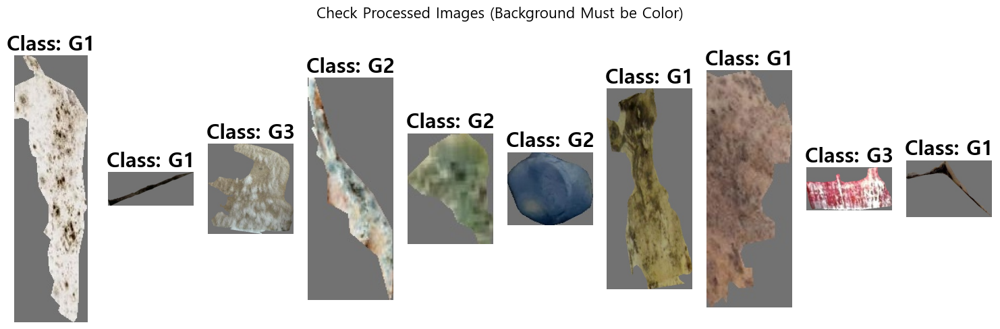

>> 출력 저장: c:\yssong\Mid_project\Mold-Pang_final\Result/output.png


In [89]:
# [Cell 3.5] 전처리 데이터 검증 (색상 배경 확인용)
# --------------------------------------------------
# Data_split 폴더에 저장된 이미지를 무작위로 꺼내서
# 배경이 색상으로 잘 처리되었는지 확인합니다.

def visualize_processed_samples(base_dir, num_samples=5):
    # G1 ~ G4 폴더에서 이미지 경로 수집
    all_images = []
    for split in ['train', 'valid']:
        for cls in ['G1', 'G2', 'G3', 'G4']:
            folder_path = os.path.join(base_dir, split, cls)
            if os.path.exists(folder_path):
                images = glob.glob(os.path.join(folder_path, '*.jpg'))
                all_images.extend(images)
    
    if not all_images:
        print("생성된 데이터가 없습니다. [Cell 3]을 먼저 실행해주세요.")
        return

    # 랜덤 샘플링
    samples = random.sample(all_images, min(len(all_images), num_samples))
    
    plt.figure(figsize=(15, 5))
    plt.suptitle("Check Processed Images (Background Must be Color)", fontsize=16)
    
    for i, img_path in enumerate(samples):
        # 이미지 로드 (BGR)
        img_bgr = cv2.imread(img_path)
        # BGR → RGB로 변환
        img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        
        # 경로에서 라벨 이름 추출
        label = os.path.basename(os.path.dirname(img_path))
        
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img)
        plt.title(f"Class: {label}")
        plt.axis('off')
        
    plt.tight_layout()
    plt.savefig(os.path.join(RESULT_DIR, 'output.png'), dpi=150, bbox_inches='tight')
    plt.show()
    print(f">> 출력 저장: {RESULT_DIR}/output.png")

# 실행
visualize_processed_samples(SPLIT_DATA_DIR, num_samples=10)

In [90]:
# [Cell 4] 데이터셋 및 로더 정의 (GPU 최적화)

# 비율 유지 + 패딩(레터박스) 전처리
class LetterboxPad:
    def __init__(self, size, fill=MASK_BG_VALUE):  # fill: 패딩 색상 -> 회색 MASK_BG_VALUE = 114, 검정 -> = 0
        self.size = (size, size)
        self.fill = fill
        if hasattr(Image, "Resampling"):
            self.resample = Image.Resampling.BILINEAR
        else:
            self.resample = Image.BILINEAR

    def _resolve_fill(self, img):
        if isinstance(self.fill, int):
            if img.mode == "RGB":
                return (self.fill, self.fill, self.fill)
            if img.mode == "RGBA":
                return (self.fill, self.fill, self.fill, 255)
        return self.fill

    def __call__(self, img):
        fill = self._resolve_fill(img)
        return ImageOps.pad(img, self.size, method=self.resample, color=fill, centering=(0.5, 0.5))

# 이미지 전처리 파이프라인 (비율 유지 + 패딩 적용)
train_transforms = transforms.Compose([
    LetterboxPad(IMG_SIZE, fill=MASK_BG_VALUE),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    LetterboxPad(IMG_SIZE, fill=MASK_BG_VALUE),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

from torchvision.datasets import ImageFolder

def get_dataloaders(split_dir, batch_size):
    # 폴더 구조가 없으면 에러 방지
    if not os.path.exists(os.path.join(split_dir, 'train')):
        print("Dataset not found!")
        return None, None, None

    train_ds = ImageFolder(os.path.join(split_dir, 'train'), transform=train_transforms)
    valid_ds = ImageFolder(os.path.join(split_dir, 'valid'), transform=test_transforms)
    test_ds = ImageFolder(os.path.join(split_dir, 'test'), transform=test_transforms)

    # Windows 환경 최적화 (안정성 최우선):
    # - num_workers=0: 멀티프로세싱 비활성화
    # - pin_memory=False: CUDA 메모리 고정 비활성화
    # - drop_last=False: 모든 데이터 사용
    # - persistent_workers=False: 워커 재사용 비활성화
    train_loader = DataLoader(
        train_ds, 
        batch_size=batch_size, 
        shuffle=True, 
        num_workers=0,
        pin_memory=False,
        drop_last=False
    )
    
    valid_loader = DataLoader(
        valid_ds, 
        batch_size=batch_size, 
        shuffle=False, 
        num_workers=0,
        pin_memory=False,
        drop_last=False
    )
    
    test_loader = DataLoader(
        test_ds, 
        batch_size=batch_size, 
        shuffle=False, 
        num_workers=0,
        pin_memory=False,
        drop_last=False
    )
    
    return train_loader, valid_loader, test_loader, train_ds.classes

print(">> DataLoader 생성 중...")
train_loader, valid_loader, test_loader, class_names = get_dataloaders(SPLIT_DATA_DIR, BATCH_SIZE)
print(f">> Classes: {class_names}")
print(f">> Train Dataset 크기: {len(train_loader.dataset)}")
print(f">> Valid Dataset 크기: {len(valid_loader.dataset)}")

print(f">> Test Dataset 크기: {len(test_loader.dataset)}")

print(f">> Train Batches: {len(train_loader)}")
print(f">> Batch Size: {BATCH_SIZE}")

>> DataLoader 생성 중...
>> Classes: ['G1', 'G2', 'G3', 'G4']
>> Train Dataset 크기: 8035
>> Valid Dataset 크기: 709
>> Test Dataset 크기: 409
>> Train Batches: 252
>> Batch Size: 32


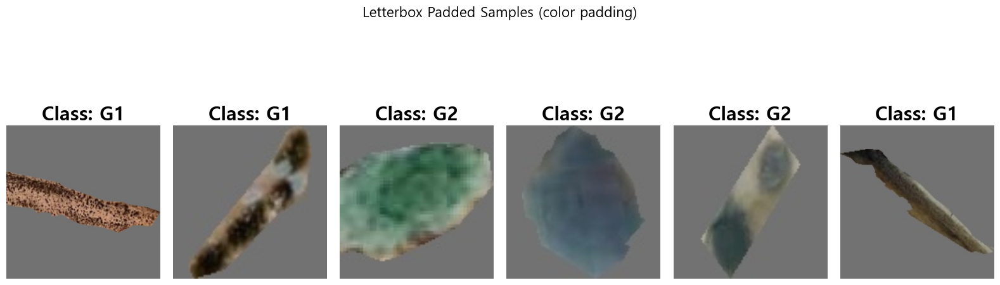

>> 레터박스 패딩 이미지 저장: c:\yssong\Mid_project\Mold-Pang_final\Result/letterbox_output.png


In [91]:
# [Cell 4.5] 레터박스(비율 유지 + 패딩) 적용 결과 확인

# Data_split 폴더에서 랜덤 샘플을 불러와 레터박스 적용 결과를 확인합니다.

def visualize_letterbox_samples(base_dir, num_samples=6):
    all_images = []
    for split in ['train', 'valid']:
        for cls in ['G1', 'G2', 'G3', 'G4']:
            folder_path = os.path.join(base_dir, split, cls)
            if os.path.exists(folder_path):
                images = glob.glob(os.path.join(folder_path, '*.jpg'))
                all_images.extend(images)

    if not all_images:
        print("생성된 데이터가 없습니다. [Cell 3]을 먼저 실행해주세요.")
        return

    samples = random.sample(all_images, min(len(all_images), num_samples))

    plt.figure(figsize=(16, 6))
    plt.suptitle("Letterbox Padded Samples (color padding)", fontsize=16)

    for i, img_path in enumerate(samples):
        img = Image.open(img_path).convert('RGB')
        padded = LetterboxPad(IMG_SIZE, fill=MASK_BG_VALUE)(img)

        label = os.path.basename(os.path.dirname(img_path))

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(padded)
        plt.title(f"Class: {label}")
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(RESULT_DIR, 'letterbox_output.png'), dpi=150, bbox_inches='tight')
    plt.show()
    print(f">> 레터박스 패딩 이미지 저장: {RESULT_DIR}/letterbox_output.png")

# 실행
visualize_letterbox_samples(SPLIT_DATA_DIR, num_samples=6)

In [92]:
# [Cell 5] 모델 생성 함수 (8가지 모델 지원)
def get_model(model_name, num_classes):
    model = None
    
    # >> DenseNet 계열
    if model_name == 'DenseNet-121':
        model = models.densenet121(weights='DEFAULT')
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
            
    elif model_name == 'DenseNet-169':
        model = models.densenet169(weights='DEFAULT')
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
    
    # >> ResNet 계열
    elif model_name == 'ResNet-18':
        model = models.resnet18(weights='DEFAULT')
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    
    elif model_name == 'ResNet-50':
        model = models.resnet50(weights='DEFAULT')
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    
    # >> MobileNet 계열 (웹 배포 최적화)
    elif model_name == 'MobileNetV3-Small':
        model = models.mobilenet_v3_small(weights='DEFAULT')
        # MobileNetV3-Small의 분류기: classifier[-1]이 마지막 Linear 레이어
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_classes)
    
    elif model_name == 'MobileNetV2':
        model = models.mobilenet_v2(weights='DEFAULT')
        # MobileNetV2의 분류기: classifier[-1]이 마지막 Linear 레이어
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_classes)
        
    # >> EfficientNet 계열
    elif model_name == 'EfficientNet-B0':
        model = models.efficientnet_b0(weights='DEFAULT')
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    
    # >> ConvNeXt 계열 (최신 CNN)
    elif model_name == 'ConvNeXt-Tiny':
        model = models.convnext_tiny(weights='DEFAULT')
        model.classifier[2] = nn.Linear(model.classifier[2].in_features, num_classes)
    
    else:
        print(f"!! 지원하지 않는 모델: {model_name}")
        
    return model

In [20]:
# [Cell 6] 학습 엔진 (AMP 최적화 버전 - GPU 최대활용 + 상세 모니터링)
class Trainer:
    def __init__(self, model, name, device, num_classes):
        self.model = model.to(device)
        self.name = name
        self.device = device
        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.AdamW(self.model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)
        self.history = []
        
    def run(self, train_loader, valid_loader, epochs, patience=10):
        # Cosine Annealing Scheduler 설정
        if epochs >= 30:
            scheduler = optim.lr_scheduler.CosineAnnealingLR(self.optimizer, T_max=epochs, eta_min=1e-6)
        else:
            scheduler = None

        # Early Stopping 변수
        best_valid_loss = float('inf')
        best_valid_acc = 0
        patience_counter = 0

        print(f"\n{'='*80}")
        print(f">> 학습 시작: {self.name}")
        print(f"{'='*80}")
        print(f"Device: {self.device} | Mixed Precision: {USE_MIXED_PRECISION}")
        print(f"Optimizer: AdamW | LR: {LEARNING_RATE} | Weight Decay: 1e-5")
        print(f"Early Stopping Patience: {patience} epochs")
        print(f"Total Epochs: {epochs} (Early Stopping으로 조기 종료 가능)")
        print(f"{'='*80}\n")

        start_time_global = time.time()

        for epoch in range(epochs):
            # --- TRAIN ---
            self.model.train()
            train_loss = 0
            train_preds, train_targets = [], []
            epoch_start = time.time()

            # tqdm progress bar with real-time metrics
            pbar = tqdm(train_loader, desc=f"[Epoch {epoch+1:3d}/{epochs}] Train", leave=True, ncols=120)
            
            for batch_idx, (imgs, labels) in enumerate(pbar):
                imgs, labels = imgs.to(self.device, non_blocking=True), labels.to(self.device, non_blocking=True)
                
                self.optimizer.zero_grad()
                
                # 표준 학습 (Mixed Precision 비활성화)
                outputs = self.model(imgs)
                loss = self.criterion(outputs, labels)
                loss.backward()
                self.optimizer.step()
                
                train_loss += loss.item()
                _, preds = torch.max(outputs, 1)
                train_preds.extend(preds.cpu().numpy())
                train_targets.extend(labels.cpu().numpy())
                
                # 실시간 지표 계산 및 업데이트
                avg_train_loss = train_loss / (batch_idx + 1)
                train_acc = accuracy_score(train_targets, train_preds)
                epoch_elapsed = time.time() - epoch_start
                
                # progress bar 업데이트
                pbar.set_postfix({
                    'T_Loss': f'{avg_train_loss:.4f}',
                    'T_Acc': f'{train_acc:.4f}',
                    'Time': f'{epoch_elapsed:.1f}s'
                })
            
            # GPU 동기화 (CUDA 연산 완료 대기)
            if self.device.type == 'cuda':
                torch.cuda.synchronize()

            if scheduler:
                scheduler.step()
                current_lr = scheduler.get_last_lr()[0]
            else:
                current_lr = LEARNING_RATE

            # --- VALIDATION ---
            val_results = self.evaluate(valid_loader)
            
            # --- METRICS CALCULATION ---
            train_acc = accuracy_score(train_targets, train_preds)
            avg_train_loss = train_loss / len(train_loader)
            epoch_time = time.time() - epoch_start
            
            # Logging
            log = {
                'Model': self.name,
                'Epoch': epoch + 1,
                'Train Loss': avg_train_loss,
                'Train Acc': train_acc,
                'Valid Loss': val_results['loss'],
                'Valid Acc': val_results['acc'],
                'Valid F1': val_results['f1'],
                'Valid Precision': val_results['precision'],
                'Valid Recall': val_results['recall'],
                'LR': current_lr,
                'Time(s)': epoch_time
            }
            self.history.append(log)
            
            # 에폭 완료 후 상세 출력 (표 형식)
            print(f"\n[Epoch {epoch+1:2d}/{epochs}] >> Complete")
            print(f"  >> Train Loss: {avg_train_loss:.4f} | Train Acc: {train_acc:.4f}")
            print(f"  >> Valid Loss: {val_results['loss']:.4f} | Valid Acc: {val_results['acc']:.4f}")
            print(f"  >> Valid F1: {val_results['f1']:.4f} | Precision: {val_results['precision']:.4f} | Recall: {val_results['recall']:.4f}")
            print(f"  >> LR: {current_lr:.2e} | Time: {epoch_time:.2f}s")

            # --- EARLY STOPPING 로직 ---
            if val_results['loss'] < best_valid_loss:
                best_valid_loss = val_results['loss']
                best_valid_acc = val_results['acc']
                patience_counter = 0
                # 최고 성능 모델 가중치 저장
                torch.save(self.model.state_dict(), os.path.join(RESULT_W_DIR, f"{self.name}_best.pth"))
                print(f"  >> [Best Model] Loss: {best_valid_loss:.4f}, Acc: {best_valid_acc:.4f}\n")
            else:
                patience_counter += 1
                if patience_counter < patience:
                    print(f"  !! 개선 없음 ({patience_counter}/{patience})\n")
                else:
                    print(f"\n{'='*80}")
                    print(f"!! EARLY STOPPING! {patience}개 에폭 동안 개선 없음.")
                    print(f"   Epoch {epoch+1}에서 학습 중단")
                    print(f"{'='*80}\n")
                    break

        # 학습 완료 요약
        total_time = time.time() - start_time_global
        total_epochs = len(self.history)
        
        print(f"{'='*80}")
        print(f">> 학습 완료: {self.name}")
        print(f"{'='*80}")
        print(f"총 에폭: {total_epochs}개 (설정: {epochs})")
        print(f"최고 Validation Accuracy: {best_valid_acc:.4f}")
        print(f"최고 Validation Loss: {best_valid_loss:.4f}")
        print(f"전체 학습 시간: {total_time/60:.2f}분 ({total_time:.0f}초)")
        print(f"평균 에폭 시간: {total_time/total_epochs:.2f}초")
        print(f"{'='*80}\n")

        # Save CSV
        df = pd.DataFrame(self.history)
        df.to_csv(os.path.join(RESULT_DIR, f"{self.name}_log.csv"), index=False)
        return df

    def evaluate(self, loader):
        self.model.eval()
        loss_sum = 0
        all_preds = []
        all_targets = []
        
        with torch.no_grad():
            for imgs, labels in loader:
                imgs, labels = imgs.to(self.device), labels.to(self.device)
                outputs = self.model(imgs)
                loss = self.criterion(outputs, labels)
                loss_sum += loss.item()
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(labels.cpu().numpy())
        
        # GPU 동기화
        if self.device.type == 'cuda':
            torch.cuda.synchronize()
        
        return {
            'loss': loss_sum / len(loader),
            'acc': accuracy_score(all_targets, all_preds),
            'f1': f1_score(all_targets, all_preds, average='weighted'),
            'precision': precision_score(all_targets, all_preds, average='weighted'),
            'recall': recall_score(all_targets, all_preds, average='weighted'),
            'targets': all_targets,
            'preds': all_preds
        }

In [18]:
# [Cell 7] 메인 실행 루프 (상세 모니터링 포함)
# 모델 딕셔너리를 순회하며 학습 수행

print("\n" + "="*40)
print("= MOLD-PANG 분류 모델 학습 시작 =")
print("="*40)
print(f"\n>> 학습 설정:")
print(f"  - 학습 데이터셋: {SPLIT_DATA_DIR}")
print(f"  - 배치 사이즈: {BATCH_SIZE}")
print(f"  - 이미지 크기: {IMG_SIZE}x{IMG_SIZE}")
print(f"  - 학습률: {LEARNING_RATE}")
print(f"  - Early Stopping Patience: {EARLY_STOPPING_PATIENCE}")
print(f"  - 혼합 정밀도(Mixed Precision): {USE_MIXED_PRECISION}")
print(f"  - Device: {device}")
print(f"\n>> 학습할 모델:")
model_count = sum(MODEL_SELECTION.values())
for idx, (model_name, run_flag) in enumerate(MODEL_SELECTION.items(), 1):
    status = ">> 활성화" if run_flag == 1 else "!! 스킵"
    print(f"  {idx}. {model_name:<20} [{status}]")
print(f"\n총 {model_count}개 모델 학습 예정")
print("="*80 + "\n")

all_results = {}
start_time_total = time.time()

for model_idx, (model_name, run_flag) in enumerate(MODEL_SELECTION.items(), 1):
    if run_flag == 0:
        continue
    
    # Garbage Collection & VRAM Clear (강력 초기화)
    gc.collect()
    torch.cuda.empty_cache()
    
    print(f"\n{'='*80}")
    print(f"[{model_idx}/{model_count}] 모델 학습: {model_name}")
    print(f"{'='*80}")
    
    # 모델 초기화
    model = get_model(model_name, num_classes=len(class_names))
    print(f">> 모델 로드 완료")
    
    # 모델 파라미터 정보 출력
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"  - 총 파라미터: {total_params:,}")
    print(f"  - 학습 가능 파라미터: {trainable_params:,}")
    
    # 트레이너 실행 (Early Stopping patience 적용)
    trainer = Trainer(model, model_name, device, len(class_names))
    df_history = trainer.run(train_loader, valid_loader, EPOCHS, patience=EARLY_STOPPING_PATIENCE)
    
    all_results[model_name] = {
        'history': df_history,
        'model': trainer.model,
        'params': {
            'total': total_params,
            'trainable': trainable_params
        }
    }

# 전체 학습 완료
total_time = time.time() - start_time_total

print("\n" + "="*80)
print(">> 모든 모델 학습 완료!")
print("="*80)
print(f"\n>> 학습 완료 요약:")
print(f"  - 총 학습 시간: {total_time/60:.2f}분 ({total_time:.0f}초)")
print(f"  - 학습된 모델: {len(all_results)}개")
print(f"  - 클래스 수: {len(class_names)}")
print(f"  - 클래스: {', '.join(class_names)}")
print(f"\n>> 저장 위치:")
print(f"  - 학습 로그: {RESULT_DIR}/[모델명]_log.csv")
print(f"  - 모델 가중치: {RESULT_W_DIR}/[모델명]_best.pth")
print(f"\n>> 다음 단계:")
print(f"  - Cell 8: 학습 결과 그래프 시각화")
print(f"  - Cell 9: Confusion Matrix 및 Grad-CAM 분석")
print(f"\n>> 8가지 모델 학습 완료: DenseNet-121(주요), DenseNet-169, ResNet-18, ResNet-50, MobileNetV3-Small, MobileNetV2, EfficientNet-B0, ConvNeXt-Tiny")
print("="*80 + "\n")


= MOLD-PANG 분류 모델 학습 시작 =

>> 학습 설정:
  - 학습 데이터셋: c:\yssong\Mid_project\Mold-Pang_final\Data_split
  - 배치 사이즈: 32
  - 이미지 크기: 256x256
  - 학습률: 0.0001
  - Early Stopping Patience: 10
  - 혼합 정밀도(Mixed Precision): True
  - Device: cuda:0

>> 학습할 모델:
  1. DenseNet-121         [>> 활성화]
  2. DenseNet-169         [>> 활성화]
  3. ResNet-18            [>> 활성화]
  4. ResNet-50            [>> 활성화]
  5. MobileNetV3-Small    [>> 활성화]
  6. MobileNetV2          [>> 활성화]
  7. EfficientNet-B0      [>> 활성화]
  8. ConvNeXt-Tiny        [>> 활성화]

총 8개 모델 학습 예정


[1/8] 모델 학습: DenseNet-121
>> 모델 로드 완료
  - 총 파라미터: 6,957,956
  - 학습 가능 파라미터: 6,957,956

>> 학습 시작: DenseNet-121
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|████████████████| 252/252 [01:57<00:00,  2.15it/s, T_Loss=0.4071, T_Acc=0.8585, Time=117.1s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.4071 | Train Acc: 0.8585
  >> Valid Loss: 0.3773 | Valid Acc: 0.8970
  >> Valid F1: 0.8973 | Precision: 0.9017 | Recall: 0.8970
  >> LR: 1.00e-04 | Time: 122.27s
  >> [Best Model] Loss: 0.3773, Acc: 0.8970



[Epoch   2/100] Train: 100%|████████████████| 252/252 [01:58<00:00,  2.12it/s, T_Loss=0.1759, T_Acc=0.9416, Time=118.9s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.1759 | Train Acc: 0.9416
  >> Valid Loss: 0.3121 | Valid Acc: 0.8970
  >> Valid F1: 0.8971 | Precision: 0.8985 | Recall: 0.8970
  >> LR: 9.99e-05 | Time: 123.23s
  >> [Best Model] Loss: 0.3121, Acc: 0.8970



[Epoch   3/100] Train: 100%|████████████████| 252/252 [02:04<00:00,  2.03it/s, T_Loss=0.1057, T_Acc=0.9644, Time=124.1s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.1057 | Train Acc: 0.9644
  >> Valid Loss: 0.3802 | Valid Acc: 0.8914
  >> Valid F1: 0.8917 | Precision: 0.8954 | Recall: 0.8914
  >> LR: 9.98e-05 | Time: 128.33s
  !! 개선 없음 (1/10)



[Epoch   4/100] Train: 100%|████████████████| 252/252 [01:55<00:00,  2.18it/s, T_Loss=0.0806, T_Acc=0.9749, Time=115.8s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.0806 | Train Acc: 0.9749
  >> Valid Loss: 0.3387 | Valid Acc: 0.9140
  >> Valid F1: 0.9139 | Precision: 0.9149 | Recall: 0.9140
  >> LR: 9.96e-05 | Time: 119.97s
  !! 개선 없음 (2/10)



[Epoch   5/100] Train: 100%|████████████████| 252/252 [01:50<00:00,  2.29it/s, T_Loss=0.0745, T_Acc=0.9800, Time=110.0s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.0745 | Train Acc: 0.9800
  >> Valid Loss: 0.3290 | Valid Acc: 0.9069
  >> Valid F1: 0.9070 | Precision: 0.9076 | Recall: 0.9069
  >> LR: 9.94e-05 | Time: 114.06s
  !! 개선 없음 (3/10)



[Epoch   6/100] Train: 100%|████████████████| 252/252 [01:50<00:00,  2.28it/s, T_Loss=0.0539, T_Acc=0.9852, Time=110.5s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.0539 | Train Acc: 0.9852
  >> Valid Loss: 0.4040 | Valid Acc: 0.9083
  >> Valid F1: 0.9083 | Precision: 0.9088 | Recall: 0.9083
  >> LR: 9.91e-05 | Time: 114.62s
  !! 개선 없음 (4/10)



[Epoch   7/100] Train: 100%|████████████████| 252/252 [01:56<00:00,  2.17it/s, T_Loss=0.0465, T_Acc=0.9857, Time=116.3s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0465 | Train Acc: 0.9857
  >> Valid Loss: 0.3729 | Valid Acc: 0.9182
  >> Valid F1: 0.9182 | Precision: 0.9185 | Recall: 0.9182
  >> LR: 9.88e-05 | Time: 120.56s
  !! 개선 없음 (5/10)



[Epoch   8/100] Train: 100%|████████████████| 252/252 [01:57<00:00,  2.15it/s, T_Loss=0.0459, T_Acc=0.9862, Time=117.4s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0459 | Train Acc: 0.9862
  >> Valid Loss: 0.3693 | Valid Acc: 0.8999
  >> Valid F1: 0.8998 | Precision: 0.9016 | Recall: 0.8999
  >> LR: 9.84e-05 | Time: 121.60s
  !! 개선 없음 (6/10)



[Epoch   9/100] Train: 100%|████████████████| 252/252 [01:55<00:00,  2.19it/s, T_Loss=0.0486, T_Acc=0.9862, Time=115.2s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0486 | Train Acc: 0.9862
  >> Valid Loss: 0.3895 | Valid Acc: 0.8984
  >> Valid F1: 0.8984 | Precision: 0.8991 | Recall: 0.8984
  >> LR: 9.80e-05 | Time: 119.33s
  !! 개선 없음 (7/10)



[Epoch  10/100] Train: 100%|████████████████| 252/252 [01:54<00:00,  2.20it/s, T_Loss=0.0424, T_Acc=0.9867, Time=114.6s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0424 | Train Acc: 0.9867
  >> Valid Loss: 0.4594 | Valid Acc: 0.9083
  >> Valid F1: 0.9084 | Precision: 0.9092 | Recall: 0.9083
  >> LR: 9.76e-05 | Time: 118.84s
  !! 개선 없음 (8/10)



[Epoch  11/100] Train: 100%|████████████████| 252/252 [01:54<00:00,  2.21it/s, T_Loss=0.0232, T_Acc=0.9930, Time=114.0s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0232 | Train Acc: 0.9930
  >> Valid Loss: 0.4016 | Valid Acc: 0.9182
  >> Valid F1: 0.9182 | Precision: 0.9183 | Recall: 0.9182
  >> LR: 9.71e-05 | Time: 118.15s
  !! 개선 없음 (9/10)



[Epoch  12/100] Train: 100%|████████████████| 252/252 [01:51<00:00,  2.25it/s, T_Loss=0.0216, T_Acc=0.9951, Time=111.9s]



[Epoch 12/100] >> Complete
  >> Train Loss: 0.0216 | Train Acc: 0.9951
  >> Valid Loss: 0.4141 | Valid Acc: 0.9182
  >> Valid F1: 0.9183 | Precision: 0.9187 | Recall: 0.9182
  >> LR: 9.65e-05 | Time: 116.01s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 12에서 학습 중단

>> 학습 완료: DenseNet-121
총 에폭: 12개 (설정: 100)
최고 Validation Accuracy: 0.8970
최고 Validation Loss: 0.3121
전체 학습 시간: 23.95분 (1437초)
평균 에폭 시간: 119.77초


[2/8] 모델 학습: DenseNet-169
>> 모델 로드 완료
  - 총 파라미터: 12,491,140
  - 학습 가능 파라미터: 12,491,140

>> 학습 시작: DenseNet-169
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|████████████████| 252/252 [02:07<00:00,  1.97it/s, T_Loss=0.3644, T_Acc=0.8703, Time=127.9s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.3644 | Train Acc: 0.8703
  >> Valid Loss: 0.3700 | Valid Acc: 0.8886
  >> Valid F1: 0.8889 | Precision: 0.8923 | Recall: 0.8886
  >> LR: 1.00e-04 | Time: 132.83s
  >> [Best Model] Loss: 0.3700, Acc: 0.8886



[Epoch   2/100] Train: 100%|████████████████| 252/252 [02:20<00:00,  1.80it/s, T_Loss=0.1481, T_Acc=0.9484, Time=140.1s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.1481 | Train Acc: 0.9484
  >> Valid Loss: 0.4351 | Valid Acc: 0.8999
  >> Valid F1: 0.9001 | Precision: 0.9030 | Recall: 0.8999
  >> LR: 9.99e-05 | Time: 144.45s
  !! 개선 없음 (1/10)



[Epoch   3/100] Train: 100%|████████████████| 252/252 [02:25<00:00,  1.73it/s, T_Loss=0.0962, T_Acc=0.9678, Time=145.4s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.0962 | Train Acc: 0.9678
  >> Valid Loss: 0.4249 | Valid Acc: 0.8956
  >> Valid F1: 0.8956 | Precision: 0.9009 | Recall: 0.8956
  >> LR: 9.98e-05 | Time: 149.88s
  !! 개선 없음 (2/10)



[Epoch   4/100] Train: 100%|████████████████| 252/252 [02:23<00:00,  1.75it/s, T_Loss=0.0696, T_Acc=0.9773, Time=143.8s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.0696 | Train Acc: 0.9773
  >> Valid Loss: 0.3546 | Valid Acc: 0.9083
  >> Valid F1: 0.9083 | Precision: 0.9092 | Recall: 0.9083
  >> LR: 9.96e-05 | Time: 148.55s
  >> [Best Model] Loss: 0.3546, Acc: 0.9083



[Epoch   5/100] Train: 100%|████████████████| 252/252 [02:24<00:00,  1.74it/s, T_Loss=0.0605, T_Acc=0.9806, Time=144.6s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.0605 | Train Acc: 0.9806
  >> Valid Loss: 0.4074 | Valid Acc: 0.8858
  >> Valid F1: 0.8856 | Precision: 0.8872 | Recall: 0.8858
  >> LR: 9.94e-05 | Time: 149.47s
  !! 개선 없음 (1/10)



[Epoch   6/100] Train: 100%|████████████████| 252/252 [02:25<00:00,  1.73it/s, T_Loss=0.0627, T_Acc=0.9815, Time=145.9s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.0627 | Train Acc: 0.9815
  >> Valid Loss: 0.4617 | Valid Acc: 0.8829
  >> Valid F1: 0.8829 | Precision: 0.8845 | Recall: 0.8829
  >> LR: 9.91e-05 | Time: 150.33s
  !! 개선 없음 (2/10)



[Epoch   7/100] Train: 100%|████████████████| 252/252 [02:21<00:00,  1.78it/s, T_Loss=0.0503, T_Acc=0.9838, Time=141.9s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0503 | Train Acc: 0.9838
  >> Valid Loss: 0.3707 | Valid Acc: 0.9013
  >> Valid F1: 0.9013 | Precision: 0.9015 | Recall: 0.9013
  >> LR: 9.88e-05 | Time: 146.29s
  !! 개선 없음 (3/10)



[Epoch   8/100] Train: 100%|████████████████| 252/252 [02:22<00:00,  1.77it/s, T_Loss=0.0326, T_Acc=0.9890, Time=142.3s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0326 | Train Acc: 0.9890
  >> Valid Loss: 0.5238 | Valid Acc: 0.8928
  >> Valid F1: 0.8925 | Precision: 0.8968 | Recall: 0.8928
  >> LR: 9.84e-05 | Time: 146.76s
  !! 개선 없음 (4/10)



[Epoch   9/100] Train: 100%|████████████████| 252/252 [02:20<00:00,  1.79it/s, T_Loss=0.0242, T_Acc=0.9923, Time=140.8s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0242 | Train Acc: 0.9923
  >> Valid Loss: 0.3448 | Valid Acc: 0.9111
  >> Valid F1: 0.9112 | Precision: 0.9117 | Recall: 0.9111
  >> LR: 9.80e-05 | Time: 145.18s
  >> [Best Model] Loss: 0.3448, Acc: 0.9111



[Epoch  10/100] Train: 100%|████████████████| 252/252 [02:21<00:00,  1.78it/s, T_Loss=0.0423, T_Acc=0.9857, Time=141.3s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0423 | Train Acc: 0.9857
  >> Valid Loss: 0.4247 | Valid Acc: 0.9027
  >> Valid F1: 0.9029 | Precision: 0.9039 | Recall: 0.9027
  >> LR: 9.76e-05 | Time: 145.74s
  !! 개선 없음 (1/10)



[Epoch  11/100] Train: 100%|████████████████| 252/252 [02:21<00:00,  1.78it/s, T_Loss=0.0250, T_Acc=0.9942, Time=141.2s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0250 | Train Acc: 0.9942
  >> Valid Loss: 0.3632 | Valid Acc: 0.9140
  >> Valid F1: 0.9138 | Precision: 0.9149 | Recall: 0.9140
  >> LR: 9.71e-05 | Time: 145.63s
  !! 개선 없음 (2/10)



[Epoch  12/100] Train: 100%|████████████████| 252/252 [02:20<00:00,  1.79it/s, T_Loss=0.0575, T_Acc=0.9817, Time=140.6s]



[Epoch 12/100] >> Complete
  >> Train Loss: 0.0575 | Train Acc: 0.9817
  >> Valid Loss: 0.4701 | Valid Acc: 0.8914
  >> Valid F1: 0.8912 | Precision: 0.8924 | Recall: 0.8914
  >> LR: 9.65e-05 | Time: 145.02s
  !! 개선 없음 (3/10)



[Epoch  13/100] Train: 100%|████████████████| 252/252 [02:22<00:00,  1.77it/s, T_Loss=0.0382, T_Acc=0.9893, Time=142.1s]



[Epoch 13/100] >> Complete
  >> Train Loss: 0.0382 | Train Acc: 0.9893
  >> Valid Loss: 0.4155 | Valid Acc: 0.8956
  >> Valid F1: 0.8960 | Precision: 0.8988 | Recall: 0.8956
  >> LR: 9.59e-05 | Time: 146.64s
  !! 개선 없음 (4/10)



[Epoch  14/100] Train: 100%|████████████████| 252/252 [02:21<00:00,  1.77it/s, T_Loss=0.0372, T_Acc=0.9895, Time=142.0s]



[Epoch 14/100] >> Complete
  >> Train Loss: 0.0372 | Train Acc: 0.9895
  >> Valid Loss: 0.5971 | Valid Acc: 0.8928
  >> Valid F1: 0.8930 | Precision: 0.8953 | Recall: 0.8928
  >> LR: 9.53e-05 | Time: 146.46s
  !! 개선 없음 (5/10)



[Epoch  15/100] Train: 100%|████████████████| 252/252 [02:21<00:00,  1.79it/s, T_Loss=0.0425, T_Acc=0.9868, Time=141.1s]



[Epoch 15/100] >> Complete
  >> Train Loss: 0.0425 | Train Acc: 0.9868
  >> Valid Loss: 0.4642 | Valid Acc: 0.9069
  >> Valid F1: 0.9070 | Precision: 0.9082 | Recall: 0.9069
  >> LR: 9.46e-05 | Time: 145.47s
  !! 개선 없음 (6/10)



[Epoch  16/100] Train: 100%|████████████████| 252/252 [02:19<00:00,  1.80it/s, T_Loss=0.0320, T_Acc=0.9887, Time=139.6s]



[Epoch 16/100] >> Complete
  >> Train Loss: 0.0320 | Train Acc: 0.9887
  >> Valid Loss: 0.4201 | Valid Acc: 0.9210
  >> Valid F1: 0.9210 | Precision: 0.9215 | Recall: 0.9210
  >> LR: 9.39e-05 | Time: 143.97s
  !! 개선 없음 (7/10)



[Epoch  17/100] Train: 100%|████████████████| 252/252 [02:22<00:00,  1.76it/s, T_Loss=0.0125, T_Acc=0.9960, Time=142.8s]



[Epoch 17/100] >> Complete
  >> Train Loss: 0.0125 | Train Acc: 0.9960
  >> Valid Loss: 0.4731 | Valid Acc: 0.9140
  >> Valid F1: 0.9139 | Precision: 0.9151 | Recall: 0.9140
  >> LR: 9.31e-05 | Time: 147.16s
  !! 개선 없음 (8/10)



[Epoch  18/100] Train: 100%|████████████████| 252/252 [02:21<00:00,  1.78it/s, T_Loss=0.0128, T_Acc=0.9954, Time=141.9s]



[Epoch 18/100] >> Complete
  >> Train Loss: 0.0128 | Train Acc: 0.9954
  >> Valid Loss: 0.6812 | Valid Acc: 0.8970
  >> Valid F1: 0.8972 | Precision: 0.8995 | Recall: 0.8970
  >> LR: 9.23e-05 | Time: 146.23s
  !! 개선 없음 (9/10)



[Epoch  19/100] Train: 100%|████████████████| 252/252 [02:21<00:00,  1.78it/s, T_Loss=0.0116, T_Acc=0.9963, Time=142.0s]



[Epoch 19/100] >> Complete
  >> Train Loss: 0.0116 | Train Acc: 0.9963
  >> Valid Loss: 0.4991 | Valid Acc: 0.9069
  >> Valid F1: 0.9071 | Precision: 0.9081 | Recall: 0.9069
  >> LR: 9.14e-05 | Time: 146.27s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 19에서 학습 중단

>> 학습 완료: DenseNet-169
총 에폭: 19개 (설정: 100)
최고 Validation Accuracy: 0.9111
최고 Validation Loss: 0.3448
전체 학습 시간: 46.22분 (2773초)
평균 에폭 시간: 145.94초


[3/8] 모델 학습: ResNet-18
>> 모델 로드 완료
  - 총 파라미터: 11,178,564
  - 학습 가능 파라미터: 11,178,564

>> 학습 시작: ResNet-18
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|█████████████████| 252/252 [01:05<00:00,  3.85it/s, T_Loss=0.4024, T_Acc=0.8504, Time=65.4s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.4024 | Train Acc: 0.8504
  >> Valid Loss: 0.4191 | Valid Acc: 0.8646
  >> Valid F1: 0.8636 | Precision: 0.8800 | Recall: 0.8646
  >> LR: 1.00e-04 | Time: 68.01s
  >> [Best Model] Loss: 0.4191, Acc: 0.8646



[Epoch   2/100] Train: 100%|█████████████████| 252/252 [01:03<00:00,  3.95it/s, T_Loss=0.1991, T_Acc=0.9281, Time=63.7s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.1991 | Train Acc: 0.9281
  >> Valid Loss: 0.4827 | Valid Acc: 0.8815
  >> Valid F1: 0.8824 | Precision: 0.8915 | Recall: 0.8815
  >> LR: 9.99e-05 | Time: 66.19s
  !! 개선 없음 (1/10)



[Epoch   3/100] Train: 100%|█████████████████| 252/252 [00:59<00:00,  4.25it/s, T_Loss=0.1272, T_Acc=0.9562, Time=59.3s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.1272 | Train Acc: 0.9562
  >> Valid Loss: 0.4580 | Valid Acc: 0.8914
  >> Valid F1: 0.8918 | Precision: 0.8982 | Recall: 0.8914
  >> LR: 9.98e-05 | Time: 61.59s
  !! 개선 없음 (2/10)



[Epoch   4/100] Train: 100%|█████████████████| 252/252 [01:01<00:00,  4.11it/s, T_Loss=0.0954, T_Acc=0.9683, Time=61.3s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.0954 | Train Acc: 0.9683
  >> Valid Loss: 0.4960 | Valid Acc: 0.8872
  >> Valid F1: 0.8868 | Precision: 0.8923 | Recall: 0.8872
  >> LR: 9.96e-05 | Time: 63.50s
  !! 개선 없음 (3/10)



[Epoch   5/100] Train: 100%|█████████████████| 252/252 [01:02<00:00,  4.06it/s, T_Loss=0.0725, T_Acc=0.9742, Time=62.0s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.0725 | Train Acc: 0.9742
  >> Valid Loss: 0.4853 | Valid Acc: 0.8914
  >> Valid F1: 0.8917 | Precision: 0.8941 | Recall: 0.8914
  >> LR: 9.94e-05 | Time: 64.45s
  !! 개선 없음 (4/10)



[Epoch   6/100] Train: 100%|█████████████████| 252/252 [01:02<00:00,  4.02it/s, T_Loss=0.0596, T_Acc=0.9798, Time=62.7s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.0596 | Train Acc: 0.9798
  >> Valid Loss: 0.4771 | Valid Acc: 0.9041
  >> Valid F1: 0.9040 | Precision: 0.9063 | Recall: 0.9041
  >> LR: 9.91e-05 | Time: 65.07s
  !! 개선 없음 (5/10)



[Epoch   7/100] Train: 100%|█████████████████| 252/252 [01:02<00:00,  4.03it/s, T_Loss=0.0609, T_Acc=0.9795, Time=62.5s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0609 | Train Acc: 0.9795
  >> Valid Loss: 0.4418 | Valid Acc: 0.8984
  >> Valid F1: 0.8984 | Precision: 0.8992 | Recall: 0.8984
  >> LR: 9.88e-05 | Time: 64.96s
  !! 개선 없음 (6/10)



[Epoch   8/100] Train: 100%|█████████████████| 252/252 [01:02<00:00,  4.02it/s, T_Loss=0.0700, T_Acc=0.9775, Time=62.7s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0700 | Train Acc: 0.9775
  >> Valid Loss: 0.5448 | Valid Acc: 0.8829
  >> Valid F1: 0.8827 | Precision: 0.8858 | Recall: 0.8829
  >> LR: 9.84e-05 | Time: 65.00s
  !! 개선 없음 (7/10)



[Epoch   9/100] Train: 100%|█████████████████| 252/252 [01:01<00:00,  4.10it/s, T_Loss=0.0275, T_Acc=0.9905, Time=61.5s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0275 | Train Acc: 0.9905
  >> Valid Loss: 0.5455 | Valid Acc: 0.9055
  >> Valid F1: 0.9056 | Precision: 0.9063 | Recall: 0.9055
  >> LR: 9.80e-05 | Time: 63.73s
  !! 개선 없음 (8/10)



[Epoch  10/100] Train: 100%|█████████████████| 252/252 [01:01<00:00,  4.11it/s, T_Loss=0.0330, T_Acc=0.9895, Time=61.3s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0330 | Train Acc: 0.9895
  >> Valid Loss: 0.5911 | Valid Acc: 0.8872
  >> Valid F1: 0.8871 | Precision: 0.8894 | Recall: 0.8872
  >> LR: 9.76e-05 | Time: 63.76s
  !! 개선 없음 (9/10)



[Epoch  11/100] Train: 100%|█████████████████| 252/252 [01:01<00:00,  4.08it/s, T_Loss=0.0259, T_Acc=0.9918, Time=61.8s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0259 | Train Acc: 0.9918
  >> Valid Loss: 0.5734 | Valid Acc: 0.8801
  >> Valid F1: 0.8799 | Precision: 0.8806 | Recall: 0.8801
  >> LR: 9.71e-05 | Time: 64.21s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 11에서 학습 중단

>> 학습 완료: ResNet-18
총 에폭: 11개 (설정: 100)
최고 Validation Accuracy: 0.8646
최고 Validation Loss: 0.4191
전체 학습 시간: 11.84분 (711초)
평균 에폭 시간: 64.59초


[4/8] 모델 학습: ResNet-50
>> 모델 로드 완료
  - 총 파라미터: 23,516,228
  - 학습 가능 파라미터: 23,516,228

>> 학습 시작: ResNet-50
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|████████████████| 252/252 [01:46<00:00,  2.37it/s, T_Loss=0.4612, T_Acc=0.8300, Time=106.5s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.4612 | Train Acc: 0.8300
  >> Valid Loss: 0.3758 | Valid Acc: 0.8956
  >> Valid F1: 0.8958 | Precision: 0.8975 | Recall: 0.8956
  >> LR: 1.00e-04 | Time: 110.81s
  >> [Best Model] Loss: 0.3758, Acc: 0.8956



[Epoch   2/100] Train: 100%|████████████████| 252/252 [01:46<00:00,  2.36it/s, T_Loss=0.1708, T_Acc=0.9414, Time=106.8s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.1708 | Train Acc: 0.9414
  >> Valid Loss: 0.3826 | Valid Acc: 0.9013
  >> Valid F1: 0.9013 | Precision: 0.9015 | Recall: 0.9013
  >> LR: 9.99e-05 | Time: 110.59s
  !! 개선 없음 (1/10)



[Epoch   3/100] Train: 100%|████████████████| 252/252 [01:44<00:00,  2.42it/s, T_Loss=0.1060, T_Acc=0.9625, Time=104.1s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.1060 | Train Acc: 0.9625
  >> Valid Loss: 0.4186 | Valid Acc: 0.8928
  >> Valid F1: 0.8931 | Precision: 0.8961 | Recall: 0.8928
  >> LR: 9.98e-05 | Time: 107.80s
  !! 개선 없음 (2/10)



[Epoch   4/100] Train: 100%|████████████████| 252/252 [01:45<00:00,  2.39it/s, T_Loss=0.0778, T_Acc=0.9731, Time=105.6s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.0778 | Train Acc: 0.9731
  >> Valid Loss: 0.4817 | Valid Acc: 0.8928
  >> Valid F1: 0.8930 | Precision: 0.8944 | Recall: 0.8928
  >> LR: 9.96e-05 | Time: 109.40s
  !! 개선 없음 (3/10)



[Epoch   5/100] Train: 100%|████████████████| 252/252 [01:44<00:00,  2.41it/s, T_Loss=0.0520, T_Acc=0.9854, Time=104.8s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.0520 | Train Acc: 0.9854
  >> Valid Loss: 0.4537 | Valid Acc: 0.9069
  >> Valid F1: 0.9071 | Precision: 0.9083 | Recall: 0.9069
  >> LR: 9.94e-05 | Time: 108.47s
  !! 개선 없음 (4/10)



[Epoch   6/100] Train: 100%|████████████████| 252/252 [01:44<00:00,  2.41it/s, T_Loss=0.0605, T_Acc=0.9803, Time=104.7s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.0605 | Train Acc: 0.9803
  >> Valid Loss: 0.4102 | Valid Acc: 0.8900
  >> Valid F1: 0.8900 | Precision: 0.8922 | Recall: 0.8900
  >> LR: 9.91e-05 | Time: 108.48s
  !! 개선 없음 (5/10)



[Epoch   7/100] Train: 100%|████████████████| 252/252 [01:45<00:00,  2.39it/s, T_Loss=0.0360, T_Acc=0.9893, Time=105.6s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0360 | Train Acc: 0.9893
  >> Valid Loss: 0.5676 | Valid Acc: 0.8900
  >> Valid F1: 0.8898 | Precision: 0.8931 | Recall: 0.8900
  >> LR: 9.88e-05 | Time: 109.47s
  !! 개선 없음 (6/10)



[Epoch   8/100] Train: 100%|████████████████| 252/252 [01:44<00:00,  2.42it/s, T_Loss=0.0316, T_Acc=0.9899, Time=104.1s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0316 | Train Acc: 0.9899
  >> Valid Loss: 0.5232 | Valid Acc: 0.8872
  >> Valid F1: 0.8873 | Precision: 0.8879 | Recall: 0.8872
  >> LR: 9.84e-05 | Time: 107.77s
  !! 개선 없음 (7/10)



[Epoch   9/100] Train: 100%|████████████████| 252/252 [01:45<00:00,  2.39it/s, T_Loss=0.0378, T_Acc=0.9889, Time=105.2s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0378 | Train Acc: 0.9889
  >> Valid Loss: 0.5120 | Valid Acc: 0.8886
  >> Valid F1: 0.8887 | Precision: 0.8918 | Recall: 0.8886
  >> LR: 9.80e-05 | Time: 109.01s
  !! 개선 없음 (8/10)



[Epoch  10/100] Train: 100%|████████████████| 252/252 [01:44<00:00,  2.40it/s, T_Loss=0.0440, T_Acc=0.9859, Time=105.0s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0440 | Train Acc: 0.9859
  >> Valid Loss: 0.5059 | Valid Acc: 0.9111
  >> Valid F1: 0.9113 | Precision: 0.9123 | Recall: 0.9111
  >> LR: 9.76e-05 | Time: 108.73s
  !! 개선 없음 (9/10)



[Epoch  11/100] Train: 100%|████████████████| 252/252 [01:42<00:00,  2.46it/s, T_Loss=0.0305, T_Acc=0.9918, Time=102.5s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0305 | Train Acc: 0.9918
  >> Valid Loss: 0.5085 | Valid Acc: 0.9083
  >> Valid F1: 0.9084 | Precision: 0.9090 | Recall: 0.9083
  >> LR: 9.71e-05 | Time: 106.17s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 11에서 학습 중단

>> 학습 완료: ResNet-50
총 에폭: 11개 (설정: 100)
최고 Validation Accuracy: 0.8956
최고 Validation Loss: 0.3758
전체 학습 시간: 19.95분 (1197초)
평균 에폭 시간: 108.80초


[5/8] 모델 학습: MobileNetV3-Small
>> 모델 로드 완료
  - 총 파라미터: 1,521,956
  - 학습 가능 파라미터: 1,521,956

>> 학습 시작: MobileNetV3-Small
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|█████████████████| 252/252 [00:56<00:00,  4.44it/s, T_Loss=0.6414, T_Acc=0.7513, Time=56.8s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.6414 | Train Acc: 0.7513
  >> Valid Loss: 0.5048 | Valid Acc: 0.8307
  >> Valid F1: 0.8311 | Precision: 0.8368 | Recall: 0.8307
  >> LR: 1.00e-04 | Time: 59.12s
  >> [Best Model] Loss: 0.5048, Acc: 0.8307



[Epoch   2/100] Train: 100%|█████████████████| 252/252 [00:57<00:00,  4.37it/s, T_Loss=0.3231, T_Acc=0.8809, Time=57.6s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.3231 | Train Acc: 0.8809
  >> Valid Loss: 0.4515 | Valid Acc: 0.8420
  >> Valid F1: 0.8421 | Precision: 0.8437 | Recall: 0.8420
  >> LR: 9.99e-05 | Time: 59.86s
  >> [Best Model] Loss: 0.4515, Acc: 0.8420



[Epoch   3/100] Train: 100%|█████████████████| 252/252 [00:57<00:00,  4.42it/s, T_Loss=0.2347, T_Acc=0.9115, Time=57.0s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.2347 | Train Acc: 0.9115
  >> Valid Loss: 0.5103 | Valid Acc: 0.8307
  >> Valid F1: 0.8323 | Precision: 0.8404 | Recall: 0.8307
  >> LR: 9.98e-05 | Time: 59.27s
  !! 개선 없음 (1/10)



[Epoch   4/100] Train: 100%|█████████████████| 252/252 [00:54<00:00,  4.63it/s, T_Loss=0.1840, T_Acc=0.9332, Time=54.4s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.1840 | Train Acc: 0.9332
  >> Valid Loss: 0.4174 | Valid Acc: 0.8618
  >> Valid F1: 0.8617 | Precision: 0.8626 | Recall: 0.8618
  >> LR: 9.96e-05 | Time: 56.58s
  >> [Best Model] Loss: 0.4174, Acc: 0.8618



[Epoch   5/100] Train: 100%|█████████████████| 252/252 [00:54<00:00,  4.59it/s, T_Loss=0.1484, T_Acc=0.9464, Time=54.9s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.1484 | Train Acc: 0.9464
  >> Valid Loss: 0.4431 | Valid Acc: 0.8604
  >> Valid F1: 0.8609 | Precision: 0.8631 | Recall: 0.8604
  >> LR: 9.94e-05 | Time: 56.92s
  !! 개선 없음 (1/10)



[Epoch   6/100] Train: 100%|█████████████████| 252/252 [00:54<00:00,  4.63it/s, T_Loss=0.1236, T_Acc=0.9568, Time=54.4s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.1236 | Train Acc: 0.9568
  >> Valid Loss: 0.4970 | Valid Acc: 0.8702
  >> Valid F1: 0.8696 | Precision: 0.8711 | Recall: 0.8702
  >> LR: 9.91e-05 | Time: 56.44s
  !! 개선 없음 (2/10)



[Epoch   7/100] Train: 100%|█████████████████| 252/252 [00:54<00:00,  4.62it/s, T_Loss=0.0914, T_Acc=0.9691, Time=54.5s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0914 | Train Acc: 0.9691
  >> Valid Loss: 0.5475 | Valid Acc: 0.8759
  >> Valid F1: 0.8762 | Precision: 0.8784 | Recall: 0.8759
  >> LR: 9.88e-05 | Time: 56.56s
  !! 개선 없음 (3/10)



[Epoch   8/100] Train: 100%|█████████████████| 252/252 [00:53<00:00,  4.69it/s, T_Loss=0.0843, T_Acc=0.9745, Time=53.8s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0843 | Train Acc: 0.9745
  >> Valid Loss: 0.5942 | Valid Acc: 0.8547
  >> Valid F1: 0.8556 | Precision: 0.8591 | Recall: 0.8547
  >> LR: 9.84e-05 | Time: 55.89s
  !! 개선 없음 (4/10)



[Epoch   9/100] Train: 100%|█████████████████| 252/252 [00:53<00:00,  4.72it/s, T_Loss=0.0750, T_Acc=0.9749, Time=53.4s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0750 | Train Acc: 0.9749
  >> Valid Loss: 0.5631 | Valid Acc: 0.8632
  >> Valid F1: 0.8632 | Precision: 0.8643 | Recall: 0.8632
  >> LR: 9.80e-05 | Time: 55.62s
  !! 개선 없음 (5/10)



[Epoch  10/100] Train: 100%|█████████████████| 252/252 [00:54<00:00,  4.66it/s, T_Loss=0.0457, T_Acc=0.9841, Time=54.1s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0457 | Train Acc: 0.9841
  >> Valid Loss: 0.5265 | Valid Acc: 0.8731
  >> Valid F1: 0.8732 | Precision: 0.8740 | Recall: 0.8731
  >> LR: 9.76e-05 | Time: 56.05s
  !! 개선 없음 (6/10)



[Epoch  11/100] Train: 100%|█████████████████| 252/252 [00:53<00:00,  4.72it/s, T_Loss=0.0498, T_Acc=0.9847, Time=53.4s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0498 | Train Acc: 0.9847
  >> Valid Loss: 0.6932 | Valid Acc: 0.8604
  >> Valid F1: 0.8607 | Precision: 0.8639 | Recall: 0.8604
  >> LR: 9.71e-05 | Time: 55.34s
  !! 개선 없음 (7/10)



[Epoch  12/100] Train: 100%|█████████████████| 252/252 [00:52<00:00,  4.81it/s, T_Loss=0.0677, T_Acc=0.9793, Time=52.4s]



[Epoch 12/100] >> Complete
  >> Train Loss: 0.0677 | Train Acc: 0.9793
  >> Valid Loss: 0.6596 | Valid Acc: 0.8547
  >> Valid F1: 0.8552 | Precision: 0.8583 | Recall: 0.8547
  >> LR: 9.65e-05 | Time: 54.58s
  !! 개선 없음 (8/10)



[Epoch  13/100] Train: 100%|█████████████████| 252/252 [00:50<00:00,  5.00it/s, T_Loss=0.0541, T_Acc=0.9839, Time=50.4s]



[Epoch 13/100] >> Complete
  >> Train Loss: 0.0541 | Train Acc: 0.9839
  >> Valid Loss: 0.6265 | Valid Acc: 0.8618
  >> Valid F1: 0.8616 | Precision: 0.8639 | Recall: 0.8618
  >> LR: 9.59e-05 | Time: 52.73s
  !! 개선 없음 (9/10)



[Epoch  14/100] Train: 100%|█████████████████| 252/252 [00:55<00:00,  4.52it/s, T_Loss=0.0453, T_Acc=0.9852, Time=55.8s]



[Epoch 14/100] >> Complete
  >> Train Loss: 0.0453 | Train Acc: 0.9852
  >> Valid Loss: 0.5970 | Valid Acc: 0.8731
  >> Valid F1: 0.8733 | Precision: 0.8743 | Recall: 0.8731
  >> LR: 9.53e-05 | Time: 57.81s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 14에서 학습 중단

>> 학습 완료: MobileNetV3-Small
총 에폭: 14개 (설정: 100)
최고 Validation Accuracy: 0.8618
최고 Validation Loss: 0.4174
전체 학습 시간: 13.22분 (793초)
평균 에폭 시간: 56.64초


[6/8] 모델 학습: MobileNetV2
>> 모델 로드 완료
  - 총 파라미터: 2,228,996
  - 학습 가능 파라미터: 2,228,996

>> 학습 시작: MobileNetV2
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|█████████████████| 252/252 [01:10<00:00,  3.60it/s, T_Loss=0.6302, T_Acc=0.7619, Time=70.0s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.6302 | Train Acc: 0.7619
  >> Valid Loss: 0.4114 | Valid Acc: 0.8843
  >> Valid F1: 0.8847 | Precision: 0.8874 | Recall: 0.8843
  >> LR: 1.00e-04 | Time: 72.69s
  >> [Best Model] Loss: 0.4114, Acc: 0.8843



[Epoch   2/100] Train: 100%|█████████████████| 252/252 [01:10<00:00,  3.55it/s, T_Loss=0.2789, T_Acc=0.9023, Time=70.9s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.2789 | Train Acc: 0.9023
  >> Valid Loss: 0.3384 | Valid Acc: 0.9083
  >> Valid F1: 0.9084 | Precision: 0.9086 | Recall: 0.9083
  >> LR: 9.99e-05 | Time: 73.61s
  >> [Best Model] Loss: 0.3384, Acc: 0.9083



[Epoch   3/100] Train: 100%|█████████████████| 252/252 [01:10<00:00,  3.60it/s, T_Loss=0.1891, T_Acc=0.9345, Time=70.1s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.1891 | Train Acc: 0.9345
  >> Valid Loss: 0.3716 | Valid Acc: 0.9111
  >> Valid F1: 0.9115 | Precision: 0.9137 | Recall: 0.9111
  >> LR: 9.98e-05 | Time: 72.69s
  !! 개선 없음 (1/10)



[Epoch   4/100] Train: 100%|█████████████████| 252/252 [01:14<00:00,  3.37it/s, T_Loss=0.1540, T_Acc=0.9480, Time=74.8s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.1540 | Train Acc: 0.9480
  >> Valid Loss: 0.4025 | Valid Acc: 0.8858
  >> Valid F1: 0.8858 | Precision: 0.8867 | Recall: 0.8858
  >> LR: 9.96e-05 | Time: 77.50s
  !! 개선 없음 (2/10)



[Epoch   5/100] Train: 100%|█████████████████| 252/252 [01:11<00:00,  3.52it/s, T_Loss=0.1147, T_Acc=0.9604, Time=71.5s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.1147 | Train Acc: 0.9604
  >> Valid Loss: 0.4010 | Valid Acc: 0.9013
  >> Valid F1: 0.9011 | Precision: 0.9024 | Recall: 0.9013
  >> LR: 9.94e-05 | Time: 74.06s
  !! 개선 없음 (3/10)



[Epoch   6/100] Train: 100%|█████████████████| 252/252 [01:07<00:00,  3.75it/s, T_Loss=0.0868, T_Acc=0.9715, Time=67.3s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.0868 | Train Acc: 0.9715
  >> Valid Loss: 0.4718 | Valid Acc: 0.8914
  >> Valid F1: 0.8915 | Precision: 0.8922 | Recall: 0.8914
  >> LR: 9.91e-05 | Time: 69.75s
  !! 개선 없음 (4/10)



[Epoch   7/100] Train: 100%|█████████████████| 252/252 [01:06<00:00,  3.78it/s, T_Loss=0.0715, T_Acc=0.9770, Time=66.8s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0715 | Train Acc: 0.9770
  >> Valid Loss: 0.4727 | Valid Acc: 0.8900
  >> Valid F1: 0.8901 | Precision: 0.8904 | Recall: 0.8900
  >> LR: 9.88e-05 | Time: 69.24s
  !! 개선 없음 (5/10)



[Epoch   8/100] Train: 100%|█████████████████| 252/252 [01:06<00:00,  3.80it/s, T_Loss=0.0650, T_Acc=0.9803, Time=66.4s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0650 | Train Acc: 0.9803
  >> Valid Loss: 0.4795 | Valid Acc: 0.8886
  >> Valid F1: 0.8882 | Precision: 0.8887 | Recall: 0.8886
  >> LR: 9.84e-05 | Time: 68.81s
  !! 개선 없음 (6/10)



[Epoch   9/100] Train: 100%|█████████████████| 252/252 [01:06<00:00,  3.78it/s, T_Loss=0.0585, T_Acc=0.9795, Time=66.6s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0585 | Train Acc: 0.9795
  >> Valid Loss: 0.4725 | Valid Acc: 0.8872
  >> Valid F1: 0.8872 | Precision: 0.8892 | Recall: 0.8872
  >> LR: 9.80e-05 | Time: 69.08s
  !! 개선 없음 (7/10)



[Epoch  10/100] Train: 100%|█████████████████| 252/252 [01:06<00:00,  3.80it/s, T_Loss=0.0389, T_Acc=0.9888, Time=66.4s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0389 | Train Acc: 0.9888
  >> Valid Loss: 0.4882 | Valid Acc: 0.8914
  >> Valid F1: 0.8911 | Precision: 0.8921 | Recall: 0.8914
  >> LR: 9.76e-05 | Time: 68.71s
  !! 개선 없음 (8/10)



[Epoch  11/100] Train: 100%|█████████████████| 252/252 [01:07<00:00,  3.75it/s, T_Loss=0.0480, T_Acc=0.9853, Time=67.2s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0480 | Train Acc: 0.9853
  >> Valid Loss: 0.4811 | Valid Acc: 0.9013
  >> Valid F1: 0.9013 | Precision: 0.9019 | Recall: 0.9013
  >> LR: 9.71e-05 | Time: 69.65s
  !! 개선 없음 (9/10)



[Epoch  12/100] Train: 100%|█████████████████| 252/252 [01:06<00:00,  3.78it/s, T_Loss=0.0358, T_Acc=0.9888, Time=66.7s]



[Epoch 12/100] >> Complete
  >> Train Loss: 0.0358 | Train Acc: 0.9888
  >> Valid Loss: 0.4860 | Valid Acc: 0.8914
  >> Valid F1: 0.8914 | Precision: 0.8915 | Recall: 0.8914
  >> LR: 9.65e-05 | Time: 69.17s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 12에서 학습 중단

>> 학습 완료: MobileNetV2
총 에폭: 12개 (설정: 100)
최고 Validation Accuracy: 0.9083
최고 Validation Loss: 0.3384
전체 학습 시간: 14.25분 (855초)
평균 에폭 시간: 71.26초


[7/8] 모델 학습: EfficientNet-B0
>> 모델 로드 완료
  - 총 파라미터: 4,012,672
  - 학습 가능 파라미터: 4,012,672

>> 학습 시작: EfficientNet-B0
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|█████████████████| 252/252 [01:28<00:00,  2.84it/s, T_Loss=0.5908, T_Acc=0.7874, Time=88.7s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.5908 | Train Acc: 0.7874
  >> Valid Loss: 0.3525 | Valid Acc: 0.8872
  >> Valid F1: 0.8869 | Precision: 0.8875 | Recall: 0.8872
  >> LR: 1.00e-04 | Time: 97.32s
  >> [Best Model] Loss: 0.3525, Acc: 0.8872



[Epoch   2/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.33it/s, T_Loss=0.2510, T_Acc=0.9124, Time=75.6s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.2510 | Train Acc: 0.9124
  >> Valid Loss: 0.3379 | Valid Acc: 0.8900
  >> Valid F1: 0.8899 | Precision: 0.8907 | Recall: 0.8900
  >> LR: 9.99e-05 | Time: 78.13s
  >> [Best Model] Loss: 0.3379, Acc: 0.8900



[Epoch   3/100] Train: 100%|█████████████████| 252/252 [01:16<00:00,  3.31it/s, T_Loss=0.1597, T_Acc=0.9447, Time=76.2s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.1597 | Train Acc: 0.9447
  >> Valid Loss: 0.3720 | Valid Acc: 0.8858
  >> Valid F1: 0.8857 | Precision: 0.8870 | Recall: 0.8858
  >> LR: 9.98e-05 | Time: 78.77s
  !! 개선 없음 (1/10)



[Epoch   4/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.32it/s, T_Loss=0.1127, T_Acc=0.9608, Time=75.9s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.1127 | Train Acc: 0.9608
  >> Valid Loss: 0.4137 | Valid Acc: 0.8872
  >> Valid F1: 0.8872 | Precision: 0.8921 | Recall: 0.8872
  >> LR: 9.96e-05 | Time: 78.54s
  !! 개선 없음 (2/10)



[Epoch   5/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.34it/s, T_Loss=0.0865, T_Acc=0.9720, Time=75.4s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.0865 | Train Acc: 0.9720
  >> Valid Loss: 0.4626 | Valid Acc: 0.8745
  >> Valid F1: 0.8748 | Precision: 0.8831 | Recall: 0.8745
  >> LR: 9.94e-05 | Time: 78.00s
  !! 개선 없음 (3/10)



[Epoch   6/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.32it/s, T_Loss=0.0773, T_Acc=0.9730, Time=75.8s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.0773 | Train Acc: 0.9730
  >> Valid Loss: 0.4245 | Valid Acc: 0.8872
  >> Valid F1: 0.8876 | Precision: 0.8921 | Recall: 0.8872
  >> LR: 9.91e-05 | Time: 78.46s
  !! 개선 없음 (4/10)



[Epoch   7/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.32it/s, T_Loss=0.0599, T_Acc=0.9788, Time=76.0s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0599 | Train Acc: 0.9788
  >> Valid Loss: 0.4607 | Valid Acc: 0.8914
  >> Valid F1: 0.8916 | Precision: 0.8953 | Recall: 0.8914
  >> LR: 9.88e-05 | Time: 78.55s
  !! 개선 없음 (5/10)



[Epoch   8/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.32it/s, T_Loss=0.0488, T_Acc=0.9841, Time=76.0s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0488 | Train Acc: 0.9841
  >> Valid Loss: 0.3983 | Valid Acc: 0.8970
  >> Valid F1: 0.8972 | Precision: 0.8978 | Recall: 0.8970
  >> LR: 9.84e-05 | Time: 78.61s
  !! 개선 없음 (6/10)



[Epoch   9/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.33it/s, T_Loss=0.0491, T_Acc=0.9834, Time=75.7s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0491 | Train Acc: 0.9834
  >> Valid Loss: 0.4265 | Valid Acc: 0.8970
  >> Valid F1: 0.8973 | Precision: 0.8984 | Recall: 0.8970
  >> LR: 9.80e-05 | Time: 78.28s
  !! 개선 없음 (7/10)



[Epoch  10/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.32it/s, T_Loss=0.0477, T_Acc=0.9884, Time=75.9s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0477 | Train Acc: 0.9884
  >> Valid Loss: 0.5826 | Valid Acc: 0.8801
  >> Valid F1: 0.8805 | Precision: 0.8857 | Recall: 0.8801
  >> LR: 9.76e-05 | Time: 78.59s
  !! 개선 없음 (8/10)



[Epoch  11/100] Train: 100%|█████████████████| 252/252 [01:16<00:00,  3.29it/s, T_Loss=0.0426, T_Acc=0.9878, Time=76.6s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0426 | Train Acc: 0.9878
  >> Valid Loss: 0.4249 | Valid Acc: 0.9069
  >> Valid F1: 0.9069 | Precision: 0.9076 | Recall: 0.9069
  >> LR: 9.71e-05 | Time: 79.24s
  !! 개선 없음 (9/10)



[Epoch  12/100] Train: 100%|█████████████████| 252/252 [01:15<00:00,  3.35it/s, T_Loss=0.0262, T_Acc=0.9909, Time=75.3s]



[Epoch 12/100] >> Complete
  >> Train Loss: 0.0262 | Train Acc: 0.9909
  >> Valid Loss: 0.4905 | Valid Acc: 0.9055
  >> Valid F1: 0.9055 | Precision: 0.9079 | Recall: 0.9055
  >> LR: 9.65e-05 | Time: 77.95s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 12에서 학습 중단

>> 학습 완료: EfficientNet-B0
총 에폭: 12개 (설정: 100)
최고 Validation Accuracy: 0.8900
최고 Validation Loss: 0.3379
전체 학습 시간: 16.01분 (961초)
평균 에폭 시간: 80.05초


[8/8] 모델 학습: ConvNeXt-Tiny
>> 모델 로드 완료
  - 총 파라미터: 27,823,204
  - 학습 가능 파라미터: 27,823,204

>> 학습 시작: ConvNeXt-Tiny
Device: cuda:0 | Mixed Precision: True
Optimizer: AdamW | LR: 0.0001 | Weight Decay: 1e-5
Early Stopping Patience: 10 epochs
Total Epochs: 100 (Early Stopping으로 조기 종료 가능)



[Epoch   1/100] Train: 100%|████████████████| 252/252 [02:32<00:00,  1.65it/s, T_Loss=0.3215, T_Acc=0.8816, Time=152.6s]



[Epoch  1/100] >> Complete
  >> Train Loss: 0.3215 | Train Acc: 0.8816
  >> Valid Loss: 0.3272 | Valid Acc: 0.9182
  >> Valid F1: 0.9183 | Precision: 0.9194 | Recall: 0.9182
  >> LR: 1.00e-04 | Time: 160.58s
  >> [Best Model] Loss: 0.3272, Acc: 0.9182



[Epoch   2/100] Train: 100%|████████████████| 252/252 [02:13<00:00,  1.89it/s, T_Loss=0.0885, T_Acc=0.9706, Time=133.6s]



[Epoch  2/100] >> Complete
  >> Train Loss: 0.0885 | Train Acc: 0.9706
  >> Valid Loss: 0.3558 | Valid Acc: 0.9111
  >> Valid F1: 0.9113 | Precision: 0.9128 | Recall: 0.9111
  >> LR: 9.99e-05 | Time: 137.08s
  !! 개선 없음 (1/10)



[Epoch   3/100] Train: 100%|████████████████| 252/252 [02:17<00:00,  1.83it/s, T_Loss=0.0424, T_Acc=0.9849, Time=137.6s]



[Epoch  3/100] >> Complete
  >> Train Loss: 0.0424 | Train Acc: 0.9849
  >> Valid Loss: 0.4320 | Valid Acc: 0.9097
  >> Valid F1: 0.9095 | Precision: 0.9114 | Recall: 0.9097
  >> LR: 9.98e-05 | Time: 141.32s
  !! 개선 없음 (2/10)



[Epoch   4/100] Train: 100%|████████████████| 252/252 [02:15<00:00,  1.86it/s, T_Loss=0.0326, T_Acc=0.9899, Time=135.2s]



[Epoch  4/100] >> Complete
  >> Train Loss: 0.0326 | Train Acc: 0.9899
  >> Valid Loss: 0.5355 | Valid Acc: 0.8942
  >> Valid F1: 0.8937 | Precision: 0.9006 | Recall: 0.8942
  >> LR: 9.96e-05 | Time: 138.83s
  !! 개선 없음 (3/10)



[Epoch   5/100] Train: 100%|████████████████| 252/252 [02:16<00:00,  1.85it/s, T_Loss=0.0335, T_Acc=0.9879, Time=136.6s]



[Epoch  5/100] >> Complete
  >> Train Loss: 0.0335 | Train Acc: 0.9879
  >> Valid Loss: 0.4476 | Valid Acc: 0.9140
  >> Valid F1: 0.9138 | Precision: 0.9157 | Recall: 0.9140
  >> LR: 9.94e-05 | Time: 140.24s
  !! 개선 없음 (4/10)



[Epoch   6/100] Train: 100%|████████████████| 252/252 [02:18<00:00,  1.82it/s, T_Loss=0.0173, T_Acc=0.9945, Time=138.2s]



[Epoch  6/100] >> Complete
  >> Train Loss: 0.0173 | Train Acc: 0.9945
  >> Valid Loss: 0.4160 | Valid Acc: 0.9126
  >> Valid F1: 0.9126 | Precision: 0.9126 | Recall: 0.9126
  >> LR: 9.91e-05 | Time: 141.88s
  !! 개선 없음 (5/10)



[Epoch   7/100] Train: 100%|████████████████| 252/252 [02:15<00:00,  1.86it/s, T_Loss=0.0218, T_Acc=0.9925, Time=135.8s]



[Epoch  7/100] >> Complete
  >> Train Loss: 0.0218 | Train Acc: 0.9925
  >> Valid Loss: 0.5053 | Valid Acc: 0.9013
  >> Valid F1: 0.9004 | Precision: 0.9055 | Recall: 0.9013
  >> LR: 9.88e-05 | Time: 139.29s
  !! 개선 없음 (6/10)



[Epoch   8/100] Train: 100%|████████████████| 252/252 [02:09<00:00,  1.94it/s, T_Loss=0.0129, T_Acc=0.9958, Time=129.6s]



[Epoch  8/100] >> Complete
  >> Train Loss: 0.0129 | Train Acc: 0.9958
  >> Valid Loss: 0.5225 | Valid Acc: 0.8984
  >> Valid F1: 0.8985 | Precision: 0.9021 | Recall: 0.8984
  >> LR: 9.84e-05 | Time: 132.93s
  !! 개선 없음 (7/10)



[Epoch   9/100] Train: 100%|████████████████| 252/252 [02:07<00:00,  1.98it/s, T_Loss=0.0275, T_Acc=0.9910, Time=127.5s]



[Epoch  9/100] >> Complete
  >> Train Loss: 0.0275 | Train Acc: 0.9910
  >> Valid Loss: 0.4245 | Valid Acc: 0.9013
  >> Valid F1: 0.9015 | Precision: 0.9042 | Recall: 0.9013
  >> LR: 9.80e-05 | Time: 130.75s
  !! 개선 없음 (8/10)



[Epoch  10/100] Train: 100%|████████████████| 252/252 [02:06<00:00,  2.00it/s, T_Loss=0.0179, T_Acc=0.9939, Time=126.2s]



[Epoch 10/100] >> Complete
  >> Train Loss: 0.0179 | Train Acc: 0.9939
  >> Valid Loss: 0.4534 | Valid Acc: 0.9083
  >> Valid F1: 0.9084 | Precision: 0.9095 | Recall: 0.9083
  >> LR: 9.76e-05 | Time: 129.81s
  !! 개선 없음 (9/10)



[Epoch  11/100] Train: 100%|████████████████| 252/252 [02:09<00:00,  1.94it/s, T_Loss=0.0148, T_Acc=0.9945, Time=129.8s]



[Epoch 11/100] >> Complete
  >> Train Loss: 0.0148 | Train Acc: 0.9945
  >> Valid Loss: 0.5470 | Valid Acc: 0.9041
  >> Valid F1: 0.9043 | Precision: 0.9070 | Recall: 0.9041
  >> LR: 9.71e-05 | Time: 133.11s

!! EARLY STOPPING! 10개 에폭 동안 개선 없음.
   Epoch 11에서 학습 중단

>> 학습 완료: ConvNeXt-Tiny
총 에폭: 11개 (설정: 100)
최고 Validation Accuracy: 0.9182
최고 Validation Loss: 0.3272
전체 학습 시간: 25.43분 (1526초)
평균 에폭 시간: 138.72초


>> 모든 모델 학습 완료!

>> 학습 완료 요약:
  - 총 학습 시간: 170.93분 (10256초)
  - 학습된 모델: 8개
  - 클래스 수: 4
  - 클래스: G1, G2, G3, G4

>> 저장 위치:
  - 학습 로그: c:\yssong\Mid_project\Mold-Pang_final\Result/[모델명]_log.csv
  - 모델 가중치: c:\yssong\Mid_project\Mold-Pang_final\Result_w/[모델명]_best.pth

>> 다음 단계:
  - Cell 8: 학습 결과 그래프 시각화
  - Cell 9: Confusion Matrix 및 Grad-CAM 분석

>> 8가지 모델 학습 완료: DenseNet-121(주요), DenseNet-169, ResNet-18, ResNet-50, MobileNetV3-Small, MobileNetV2, EfficientNet-B0, ConvNeXt-Tiny




>> 모델별 학습 결과 요약 (8개 모델)

DenseNet-121:
  - 총 에폭: 12개 (설정: 100, Early Stopping 적용)
  - 최고 정확도: 0.9182 (Epoch 7)
  - 최종 정확도: 0.9182
  - 모델 가중치: c:\yssong\Mid_project\Mold-Pang_final\Result_w/DenseNet-121_best.pth

DenseNet-169:
  - 총 에폭: 19개 (설정: 100, Early Stopping 적용)
  - 최고 정확도: 0.9210 (Epoch 16)
  - 최종 정확도: 0.9069
  - 모델 가중치: c:\yssong\Mid_project\Mold-Pang_final\Result_w/DenseNet-169_best.pth

ResNet-18:
  - 총 에폭: 11개 (설정: 100, Early Stopping 적용)
  - 최고 정확도: 0.9055 (Epoch 9)
  - 최종 정확도: 0.8801
  - 모델 가중치: c:\yssong\Mid_project\Mold-Pang_final\Result_w/ResNet-18_best.pth

ResNet-50:
  - 총 에폭: 11개 (설정: 100, Early Stopping 적용)
  - 최고 정확도: 0.9111 (Epoch 10)
  - 최종 정확도: 0.9083
  - 모델 가중치: c:\yssong\Mid_project\Mold-Pang_final\Result_w/ResNet-50_best.pth

MobileNetV3-Small:
  - 총 에폭: 14개 (설정: 100, Early Stopping 적용)
  - 최고 정확도: 0.8759 (Epoch 7)
  - 최종 정확도: 0.8731
  - 모델 가중치: c:\yssong\Mid_project\Mold-Pang_final\Result_w/MobileNetV3-Small_best.pth

MobileNetV2:
  - 총 에폭: 12개 (설정: 100, Ea

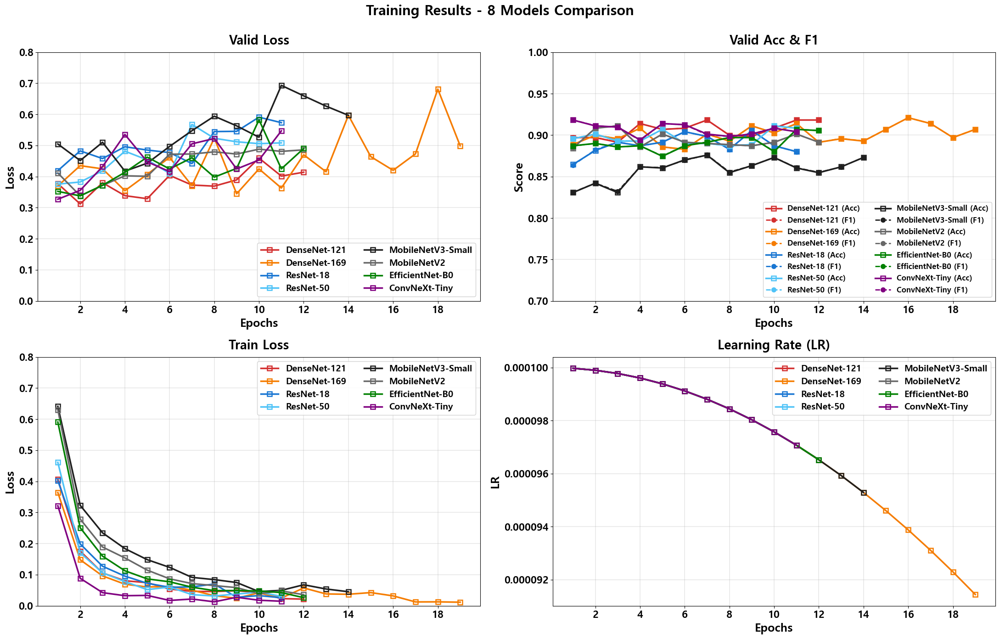


>> 그래프 저장: c:\yssong\Mid_project\Mold-Pang_final\Result/training_curves_all.png
>> 8개 모델 학습 곡선 시각화 완료


In [98]:
# [Cell 8] 학습 결과 그래프 그리기 (Epoch vs Metrics) - 8가지 모델 출력

from matplotlib.ticker import MaxNLocator
import numpy as np

MODEL_NAMES = [
    'DenseNet-121',
    'DenseNet-169',
    'ResNet-18',
    'ResNet-50',
    'MobileNetV3-Small',
    'MobileNetV2',
    'EfficientNet-B0',
    'ConvNeXt-Tiny'
]

MODEL_COLORS = {
    'DenseNet-121': '#D32F2F',
    'DenseNet-169': '#F57C00',
    'ResNet-18': '#1976D2',
    'ResNet-50': '#4FC3F7',
    'MobileNetV3-Small': '#1F1F1F',
    'MobileNetV2': '#686868',
    'EfficientNet-B0': '#008000',
    'ConvNeXt-Tiny': '#800080',
}

def load_history(model_name):
    if 'all_results' in locals() and model_name in all_results:
        df = all_results[model_name].get('history')
        if isinstance(df, pd.DataFrame):
            return df
    csv_path = os.path.join(RESULT_DIR, f"{model_name}_log.csv")
    if os.path.exists(csv_path):
        return pd.read_csv(csv_path)
    print(f"!! 로그 없음: {model_name} ({csv_path})")
    return None

# 학습 결과 통계 출력
print("\n" + "="*80)
print(">> 모델별 학습 결과 요약 (8개 모델)")
print("="*80)

histories = {}
for model_name in MODEL_NAMES:
    df = load_history(model_name)
    if df is None or df.empty:
        continue
    histories[model_name] = df
    best_epoch = df['Valid Acc'].idxmax() + 1
    best_acc = df['Valid Acc'].max()
    final_acc = df['Valid Acc'].iloc[-1]
    total_epochs = len(df)
    
    print(f"\n{model_name}:")
    print(f"  - 총 에폭: {total_epochs}개 (설정: {EPOCHS}, Early Stopping 적용)")
    print(f"  - 최고 정확도: {best_acc:.4f} (Epoch {best_epoch})")
    print(f"  - 최종 정확도: {final_acc:.4f}")
    print(f"  - 모델 가중치: {RESULT_W_DIR}/{model_name}_best.pth")

if not histories:
    print("!! 출력할 학습 로그가 없습니다. (Result 폴더의 CSV를 확인하세요.)")
else:
    fig, axes = plt.subplots(2, 2, figsize=(22, 14))
    fig.suptitle("Training Results - 8 Models Comparison", fontsize=22, fontweight='bold', y=0.995)

    open_square = dict(marker='s', markersize=7, markerfacecolor='none', markeredgewidth=1.8)
    filled_circle = dict(marker='o', markersize=7)

    # 1행 1열: Valid Loss
    ax = axes[0, 0]
    for name, df in histories.items():
        ax.plot(df['Epoch'], df['Valid Loss'], label=name, color=MODEL_COLORS.get(name, '#000000'),
                linewidth=2.5, **open_square)
    ax.set_title("Valid Loss", fontsize=20, fontweight='bold', pad=12)
    ax.set_xlabel("Epochs", fontsize=18, fontweight='bold')
    ax.set_ylabel("Loss", fontsize=18, fontweight='bold')
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.grid(True, alpha=0.3, linewidth=1.2)
    # ✅ y축: 0~0.8, 간격 0.1
    ax.set_ylim(0.0, 0.8)
    ax.set_yticks(np.arange(0.0, 0.81, 0.1))
    ax.legend(fontsize=14, loc='lower right', framealpha=0.9, ncol=2)

    # 2행 1열: Train Loss
    ax = axes[1, 0]
    for name, df in histories.items():
        ax.plot(df['Epoch'], df['Train Loss'], label=name, color=MODEL_COLORS.get(name, '#000000'),
                linewidth=2.5, **open_square)
    ax.set_title("Train Loss", fontsize=20, fontweight='bold', pad=12)
    ax.set_xlabel("Epochs", fontsize=18, fontweight='bold')
    ax.set_ylabel("Loss", fontsize=18, fontweight='bold')
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.grid(True, alpha=0.3, linewidth=1.2)
    # ✅ y축: 0~0.8, 간격 0.1
    ax.set_ylim(0.0, 0.8)
    ax.set_yticks(np.arange(0.0, 0.81, 0.1))
    ax.legend(fontsize=14, loc='upper right', framealpha=0.9, ncol=2)

    # 1행 2열: Valid Acc + Valid F1
    ax = axes[0, 1]
    for name, df in histories.items():
        color = MODEL_COLORS.get(name, '#000000')
        ax.plot(df['Epoch'], df['Valid Acc'], label=f"{name} (Acc)", color=color,
                linewidth=2.5, **open_square)
        ax.plot(df['Epoch'], df['Valid F1'], label=f"{name} (F1)", color=color,
                linewidth=2.0, linestyle='--', **filled_circle)
    ax.set_title("Valid Acc & F1", fontsize=20, fontweight='bold', pad=12)
    ax.set_xlabel("Epochs", fontsize=18, fontweight='bold')
    ax.set_ylabel("Score", fontsize=18, fontweight='bold')
    ax.set_yticklabels([f"{v:.2f}" for v in np.arange(0.7, 1.001, 0.05)])
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.grid(True, alpha=0.3, linewidth=1.2)
    # ✅ y축: 0.7~1.0, 간격 0.05
    ax.set_ylim(0.7, 1.0)
    ax.set_yticks(np.arange(0.7, 1.001, 0.05))
    ax.legend(fontsize=12, loc='lower right', framealpha=0.9, ncol=2)

    # 2행 2열: Learning Rate
    ax = axes[1, 1]
    for name, df in histories.items():
        ax.plot(df['Epoch'], df['LR'], label=name, color=MODEL_COLORS.get(name, '#000000'),
                linewidth=2.5, **open_square)
    ax.set_title("Learning Rate (LR)", fontsize=20, fontweight='bold', pad=12)
    ax.set_xlabel("Epochs", fontsize=18, fontweight='bold')
    ax.set_ylabel("LR", fontsize=18, fontweight='bold')
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.grid(True, alpha=0.3, linewidth=1.2)
    ax.legend(fontsize=14, loc='upper right', framealpha=0.9, ncol=2)

    plt.tight_layout()
    plt.savefig(os.path.join(RESULT_DIR, 'training_curves_all.png'), dpi=220, bbox_inches='tight')
    plt.show()

    print(f"\n>> 그래프 저장: {RESULT_DIR}/training_curves_all.png")
    print(">> 8개 모델 학습 곡선 시각화 완료")


>> Confusion Matrix & Grad-CAM 시각화 시작 (8개 모델)

>> 시각화 중: DenseNet-121...


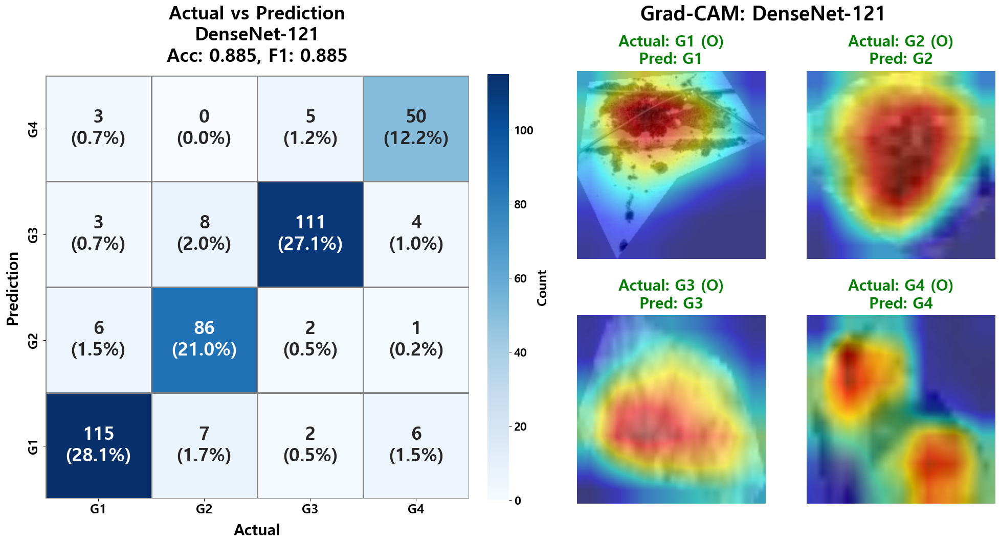

  >> Confusion Matrix & Grad-CAM 저장: DenseNet-121_cm_gradcam.png
>> 시각화 중: DenseNet-169...


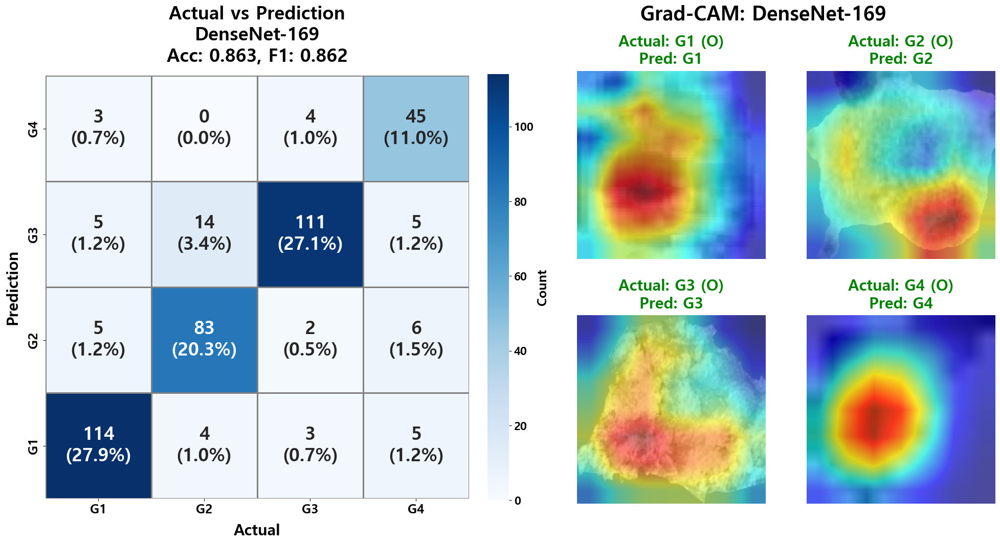

  >> Confusion Matrix & Grad-CAM 저장: DenseNet-169_cm_gradcam.png
>> 시각화 중: ResNet-18...


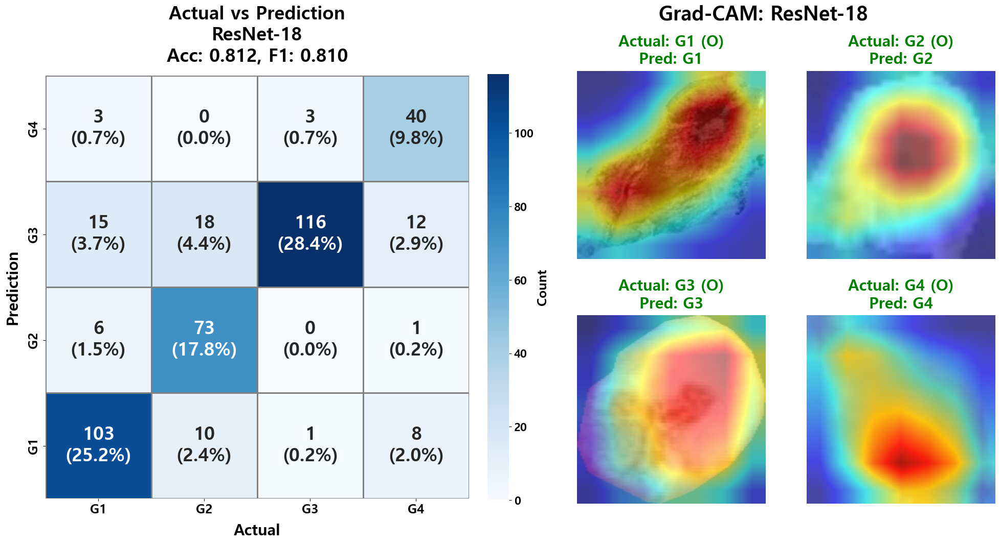

  >> Confusion Matrix & Grad-CAM 저장: ResNet-18_cm_gradcam.png
>> 시각화 중: ResNet-50...


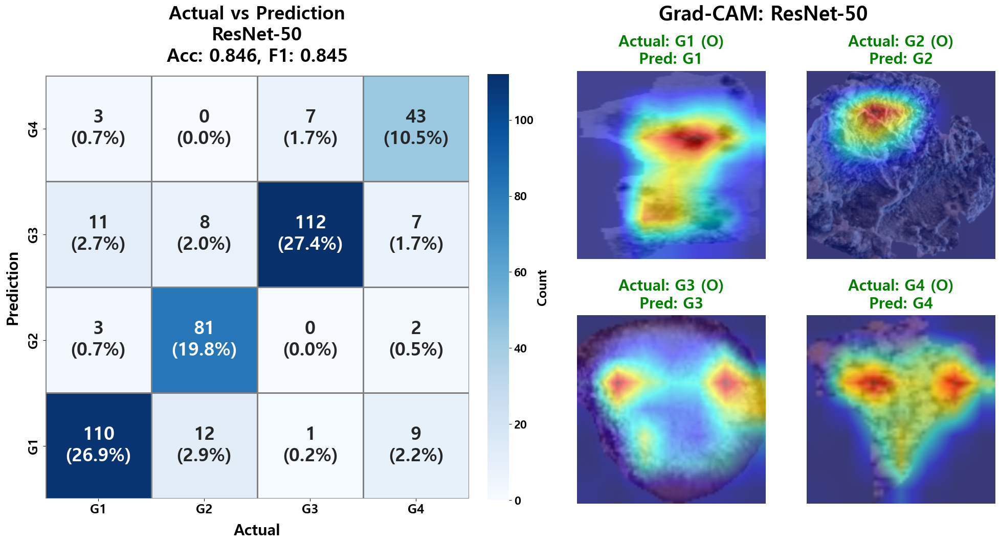

  >> Confusion Matrix & Grad-CAM 저장: ResNet-50_cm_gradcam.png
>> 시각화 중: MobileNetV3-Small...


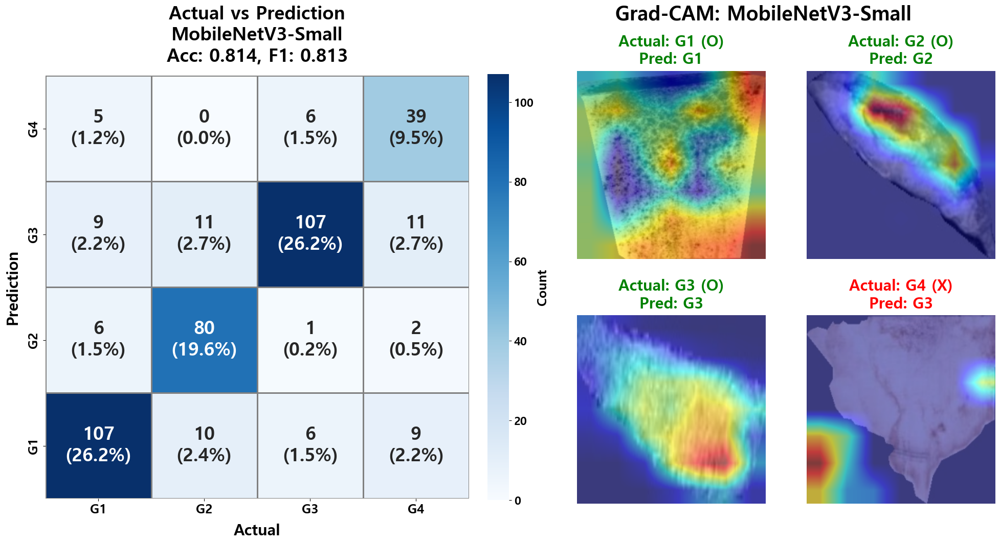

  >> Confusion Matrix & Grad-CAM 저장: MobileNetV3-Small_cm_gradcam.png
>> 시각화 중: MobileNetV2...


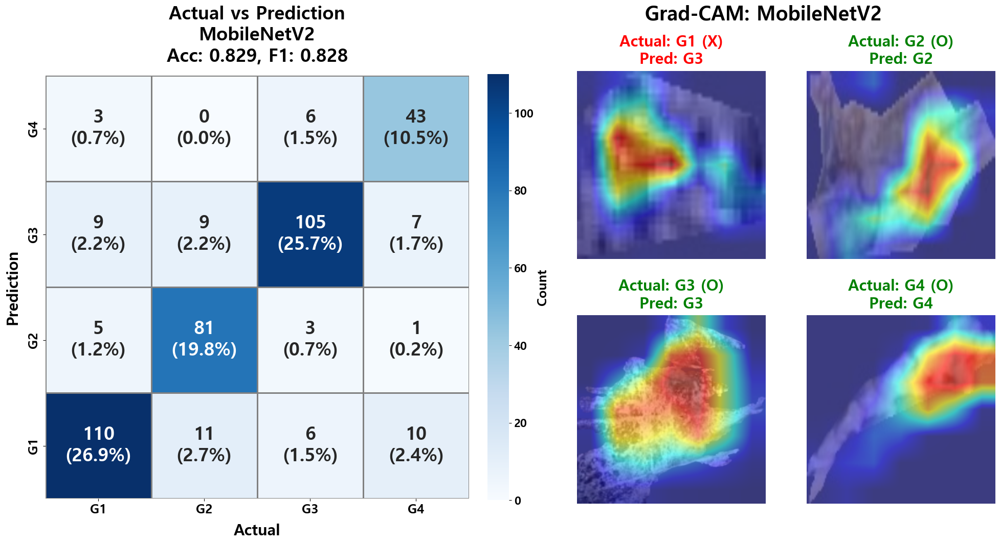

  >> Confusion Matrix & Grad-CAM 저장: MobileNetV2_cm_gradcam.png
>> 시각화 중: EfficientNet-B0...


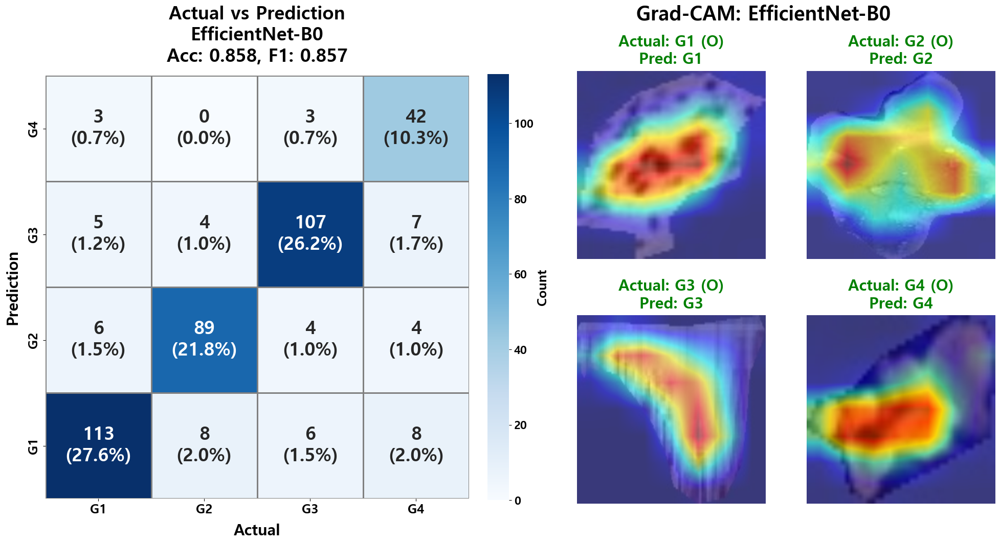

  >> Confusion Matrix & Grad-CAM 저장: EfficientNet-B0_cm_gradcam.png
>> 시각화 중: ConvNeXt-Tiny...


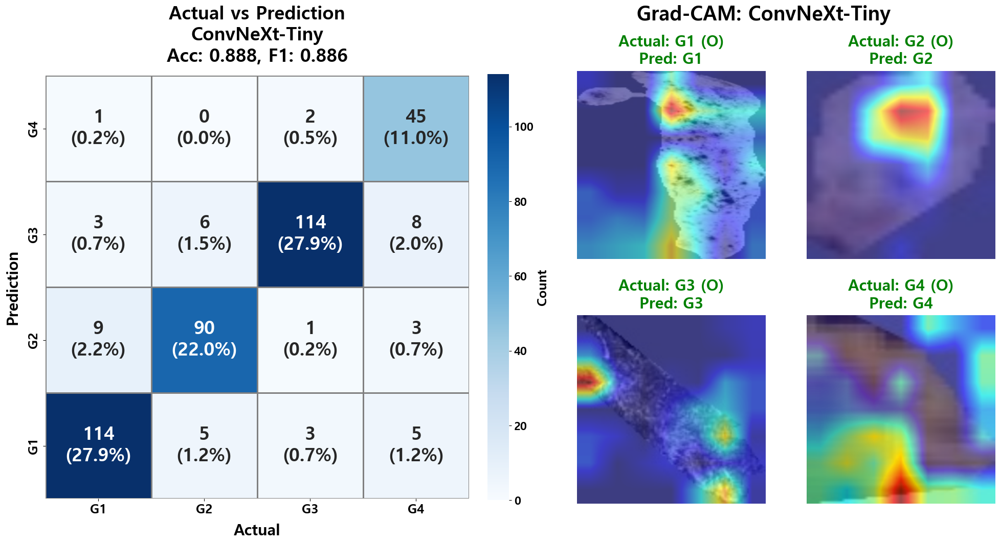

  >> Confusion Matrix & Grad-CAM 저장: ConvNeXt-Tiny_cm_gradcam.png

>> 모든 시각화 작업 완료


In [99]:
# [Cell 9] Confusion Matrix & Grad-CAM Visualization (8개 모델 출력)

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
import os
import sys
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score

MODEL_NAMES = [
     'DenseNet-121',
     'DenseNet-169',
     'ResNet-18',
     'ResNet-50',
     'MobileNetV3-Small',
     'MobileNetV2',
     'EfficientNet-B0',
     'ConvNeXt-Tiny'
]


def load_model_for_eval(model_name):
    if 'all_results' in locals() and model_name in all_results:
        model = all_results[model_name]['model']
        model.to(device)
        model.eval()
        return model
    weight_path = os.path.join(RESULT_W_DIR, f"{model_name}_best.pth")
    if not os.path.exists(weight_path):
        print(f"!! 가중치 없음: {model_name} ({weight_path})")
        return None
    model = get_model(model_name, num_classes=len(class_names))
    state = torch.load(weight_path, map_location=device)
    model.load_state_dict(state)
    model.to(device)
    model.eval()
    return model

# -----------------------------------------------------------------------------
# [중요] 한글 및 특수문자 깨짐 방지용 폰트 설정
# -----------------------------------------------------------------------------
def ensure_korean_font():
    if sys.platform == 'win32':
        plt.rcParams['font.family'] = 'Malgun Gothic'
    elif sys.platform == 'darwin':
        plt.rcParams['font.family'] = 'AppleGothic'
    else:
        plt.rcParams['font.family'] = 'NanumGothic' # 리눅스(코랩 등)
    plt.rcParams['axes.unicode_minus'] = False

# =============================================================================
# 수정된 시각화 함수
# =============================================================================
def plot_confusion_matrix_and_gradcam(model, loader, model_name):
    """
    1행 2열 레이아웃:
    - 1열: Confusion Matrix (정사각형, 크기 확대, 색상바 높이 맞춤, 회색 그리드)
    - 2열: Grad-CAM (한글/특수문자 깨짐 방지, 제목 중앙 정렬)
    """
    ensure_korean_font() # 폰트 설정 강제 적용
    model.eval()
    
    # ========== 1. Confusion Matrix 데이터 계산 ==========
    all_preds, all_targets = [], []
    all_images_list, all_labels_list = [], []
    
    with torch.no_grad():
        for imgs, lbls in loader:
            imgs_gpu = imgs.to(device)
            outputs = model(imgs_gpu)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(lbls.numpy())
            all_images_list.append(imgs)
            all_labels_list.append(lbls)
    
    cm = confusion_matrix(all_targets, all_preds)
    acc = accuracy_score(all_targets, all_preds)
    f1 = f1_score(all_targets, all_preds, average='weighted')
    
    # ========== 2. Figure 생성 ==========
    fig = plt.figure(figsize=(24, 11)) # 전체 사이즈를 조금 더 키움
    
    # [수정 1] 좌우 간격 축소 (wspace=0.1)
    gs = fig.add_gridspec(1, 2, width_ratios=[1.1, 1.0], hspace=0.3, wspace=0.15)
    
    # ========== 3. 왼쪽: Confusion Matrix ==========
    ax_cm = fig.add_subplot(gs[0, 0])
    
    cm_transposed = cm.T
    total_samples = cm.sum()
    annot_array = np.empty_like(cm_transposed, dtype=object)
    for i in range(cm_transposed.shape[0]):
        for j in range(cm_transposed.shape[1]):
            count = cm_transposed[i, j]
            percentage = 100.0 * count / total_samples if total_samples > 0 else 0
            annot_array[i, j] = f"{count}\n({percentage:.1f}%)"
    
    cm_flipped = np.flipud(cm_transposed)
    annot_flipped = np.flipud(annot_array)
    
    # [수정 2] cbar_kws로 색상바 높이 맞춤 (fraction: 0.046, pad: 0.04)
    # [설정 유지] square=True, linecolor='gray', linewidths=1.0
    sns.heatmap(cm_flipped, annot=annot_flipped, fmt='', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names[::-1],
                cbar_kws={'label': 'Count', "fraction": 0.046, "pad": 0.04}, # 높이 맞춤 핵심 코드
                linewidths=1.0, linecolor='gray',
                square=True,
                annot_kws={'fontsize': 26, 'fontweight': 'bold'},
                ax=ax_cm)
    
    # [수정 3] 제목 및 축 라벨 폰트 크기 확대
    ax_cm.set_title(f'Actual vs Prediction\n{model_name}\nAcc: {acc:.3f}, F1: {f1:.3f}', 
                    fontsize=26, fontweight='bold', pad=20, loc='center') # 제목 26pt
    ax_cm.set_xlabel('Actual', fontsize=22, fontweight='bold', labelpad=10) # 축 라벨 22pt
    ax_cm.set_ylabel('Prediction', fontsize=22, fontweight='bold', labelpad=10)
    ax_cm.tick_params(axis='both', which='major', labelsize=18) # 눈금 18pt
    
    # 컬러바 라벨 폰트 설정
    cbar = ax_cm.collections[0].colorbar
    cbar.ax.tick_params(labelsize=16)
    cbar.set_label('Count', fontsize=18, fontweight='bold')
    
    # ========== 4. 오른쪽: Grad-CAM ==========
    gs_right = gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.2)
    
    if any(x in model_name.lower() for x in ['densenet', 'efficientnet', 'convnext', 'mobilenet']):
        target_layers = [model.features[-1]]
    elif 'resnet' in model_name.lower():
        target_layers = [model.layer4[-1]]
    else:
        plt.savefig(os.path.join(RESULT_DIR, f"{model_name}_cm_gradcam.png"), dpi=200, bbox_inches='tight')
        plt.show()
        return
    
    cam = GradCAM(model=model, target_layers=target_layers)
    all_images = torch.cat(all_images_list, dim=0)
    all_labels = torch.cat(all_labels_list, dim=0)
    
    for class_idx, class_name in enumerate(class_names):
        class_indices = (all_labels == class_idx).nonzero(as_tuple=True)[0]
        if len(class_indices) == 0: continue
        selected_idx = class_indices[np.random.randint(len(class_indices))]
        
        img_tensor = all_images[selected_idx].unsqueeze(0).to(device)
        true_label = all_labels[selected_idx].item()
        
        with torch.no_grad():
            output = model(img_tensor)
            _, pred_idx = torch.max(output, 1)
            pred_label = pred_idx.item()
        
        grayscale_cam = cam(input_tensor=img_tensor, targets=[ClassifierOutputTarget(true_label)])
        grayscale_cam = grayscale_cam[0, :]
        
        img_np = all_images[selected_idx].cpu().numpy().transpose(1, 2, 0)
        img_np = (img_np * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406]
        img_np = np.clip(img_np, 0, 1)
        
        visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)
        
        row, col = divmod(class_idx, 2)
        ax = fig.add_subplot(gs_right[row, col])
        ax.imshow(visualization)
        
        # [수정 4] 특수문자 제거 및 텍스트 대체 ((O), (X))
        is_correct = (true_label == pred_label)
        text_color = 'green' if is_correct else 'red'
        match_text = '(O)' if is_correct else '(X)' # 깨짐 방지용 안전한 텍스트
        
        # [수정 5] 개별 이미지 제목 폰트 확대 (15 -> 18)
        ax.set_title(f"Actual: {class_names[true_label]} {match_text}\nPred: {class_names[pred_label]}", 
                     fontsize=22, fontweight='bold', color=text_color, pad=10, loc='center')
        ax.axis('off')
    
    # [수정 6] Grad-CAM 전체 제목 폰트 확대 (20 -> 28)
    fig.text(0.71, 0.97, f'Grad-CAM: {model_name}', ha='center', fontsize=28, fontweight='bold')
    
    plt.savefig(os.path.join(RESULT_DIR, f"{model_name}_cm_gradcam.png"), dpi=200, bbox_inches='tight')
    plt.show()
    print(f"  >> Confusion Matrix & Grad-CAM 저장: {model_name}_cm_gradcam.png")

# --- 실행부 ---
print("\n" + "="*80)
print(">> Confusion Matrix & Grad-CAM 시각화 시작 (8개 모델)")
print("="*80 + "\n")

for model_name in MODEL_NAMES:
    print(f">> 시각화 중: {model_name}...")
    model = load_model_for_eval(model_name)
    if model is None:
        continue
    try:
        plot_confusion_matrix_and_gradcam(model, test_loader, model_name)
    except Exception as e:
        print(f"!! 오류 발생 {model_name}: {e}")
        import traceback
        traceback.print_exc()

print("\n" + "="*80)
print(">> 모든 시각화 작업 완료")
print("="*80)

>> device = cuda
>> test_dir: c:\yssong\Mid_project\Mold-Pang_final\Data_split\test
>> classes(4): ['G1', 'G2', 'G3', 'G4']
>> total test images: 409

>> [RUN] Phase Diagram & Validity Threshold for 8 Models
   - weights: Result_w/<model>_best.pth
   - testset: Data_split/test (G1~G4)
   - save:    Result_toward/<model>/

--------------------------------------------------------------------------------
>> Processing: MobileNetV3-Small
--------------------------------------------------------------------------------
>> 로드 완료: MobileNetV3-Small <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\MobileNetV3-Small_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=54.54% (from Beta, Peak-3.0σ) | valid_rate=94.4% | target_cdf=0.056
   >> extract_features_for_phase: features=(409, 4), targets=(409,)
>> Phase Diagram + Valid Threshold 그래프 생성 중...


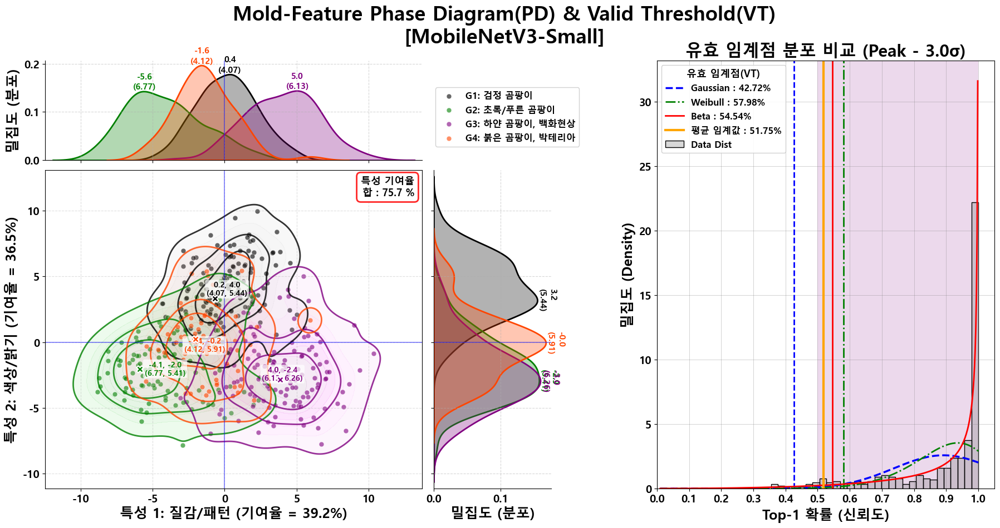

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV3-Small\MobileNetV3-Small_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV3-Small\MobileNetV3-Small_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.517507              NaN
1          VT_Selected   0.545431         0.056235
2  Gaussian(mode-3.0σ)   0.427241              NaN
3   Weibull(mode-3.0σ)   0.579848              NaN
4      Beta(mode-3.0σ)   0.545431              NaN
>> Mean(G/W/B) Threshold = 51.75%

--------------------------------------------------------------------------------
>> Processing: MobileNetV2
--------------------------------------------------------------------------------
>> 로드 완료: MobileNetV2 <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\MobileNetV2_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=50.25% (from Beta, Peak-3.0σ) | valid_rate=94.1% | target_cdf=0.059
   

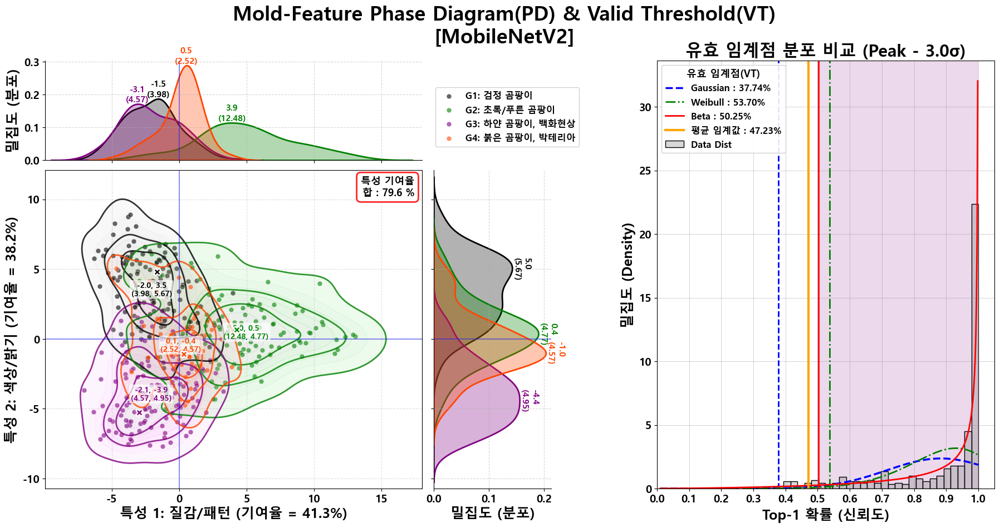

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV2\MobileNetV2_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV2\MobileNetV2_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.472291              NaN
1          VT_Selected   0.502453          0.05868
2  Gaussian(mode-3.0σ)   0.377433              NaN
3   Weibull(mode-3.0σ)   0.536986              NaN
4      Beta(mode-3.0σ)   0.502453              NaN
>> Mean(G/W/B) Threshold = 47.23%

--------------------------------------------------------------------------------
>> Processing: EfficientNet-B0
--------------------------------------------------------------------------------
>> 로드 완료: EfficientNet-B0 <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\EfficientNet-B0_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=54.85% (from Beta, Peak-3.0σ) | valid_rate=93.6% | target_cdf=0.064
   >> extract_f

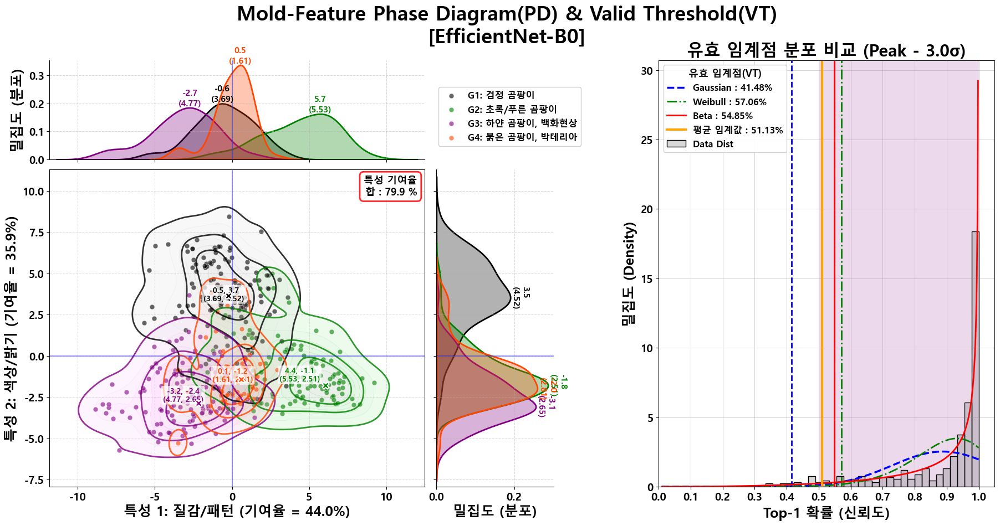

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\EfficientNet-B0\EfficientNet-B0_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\EfficientNet-B0\EfficientNet-B0_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.511288              NaN
1          VT_Selected   0.548505          0.06357
2  Gaussian(mode-3.0σ)   0.414799              NaN
3   Weibull(mode-3.0σ)   0.570559              NaN
4      Beta(mode-3.0σ)   0.548505              NaN
>> Mean(G/W/B) Threshold = 51.13%

--------------------------------------------------------------------------------
>> Processing: DenseNet-121
--------------------------------------------------------------------------------
>> 로드 완료: DenseNet-121 <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\DenseNet-121_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=64.56% (from Beta, Peak-3.0σ) | valid_rate=92.7% | target_cdf=0.073
   >> ex

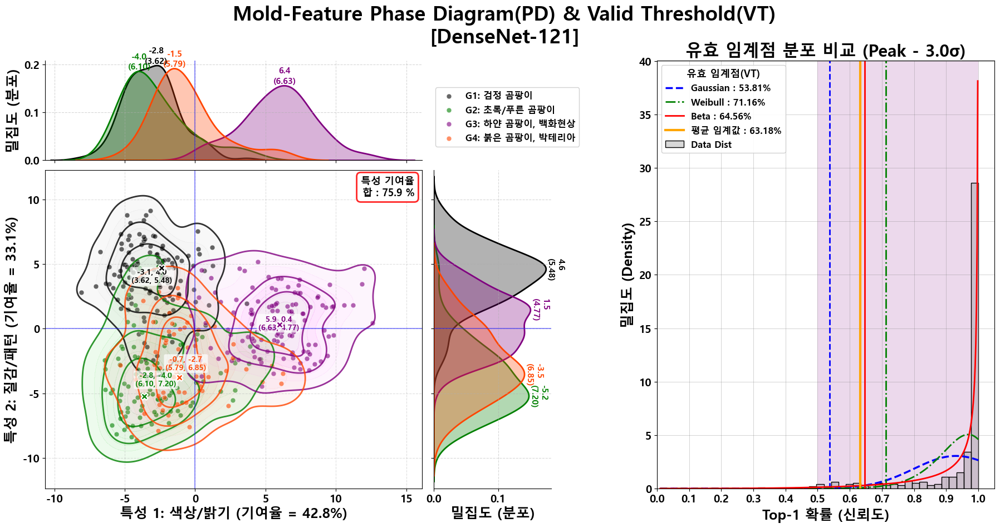

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-121\DenseNet-121_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-121\DenseNet-121_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.631771              NaN
1          VT_Selected   0.645610          0.07335
2  Gaussian(mode-3.0σ)   0.538088              NaN
3   Weibull(mode-3.0σ)   0.711616              NaN
4      Beta(mode-3.0σ)   0.645610              NaN
>> Mean(G/W/B) Threshold = 63.18%

--------------------------------------------------------------------------------
>> Processing: DenseNet-169
--------------------------------------------------------------------------------
>> 로드 완료: DenseNet-169 <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\DenseNet-169_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=70.93% (from Beta, Peak-3.0σ) | valid_rate=93.6% | target_cdf=0.064
   >> extract_featur

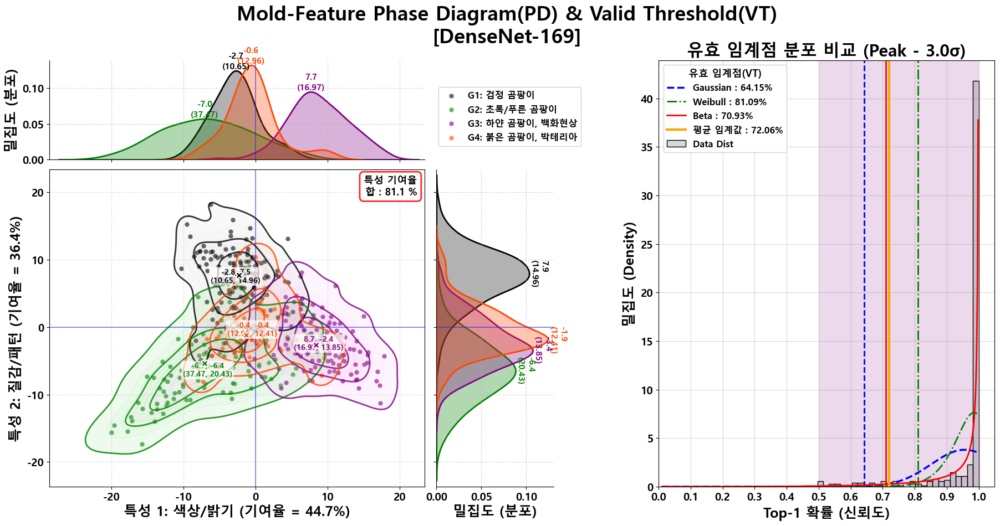

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-169\DenseNet-169_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-169\DenseNet-169_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.720576              NaN
1          VT_Selected   0.709333          0.06357
2  Gaussian(mode-3.0σ)   0.641508              NaN
3   Weibull(mode-3.0σ)   0.810887              NaN
4      Beta(mode-3.0σ)   0.709333              NaN
>> Mean(G/W/B) Threshold = 72.06%

--------------------------------------------------------------------------------
>> Processing: ResNet-18
--------------------------------------------------------------------------------
>> 로드 완료: ResNet-18 <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\ResNet-18_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=56.32% (from Beta, Peak-3.0σ) | valid_rate=94.1% | target_cdf=0.059
   >> extract_features_for_ph

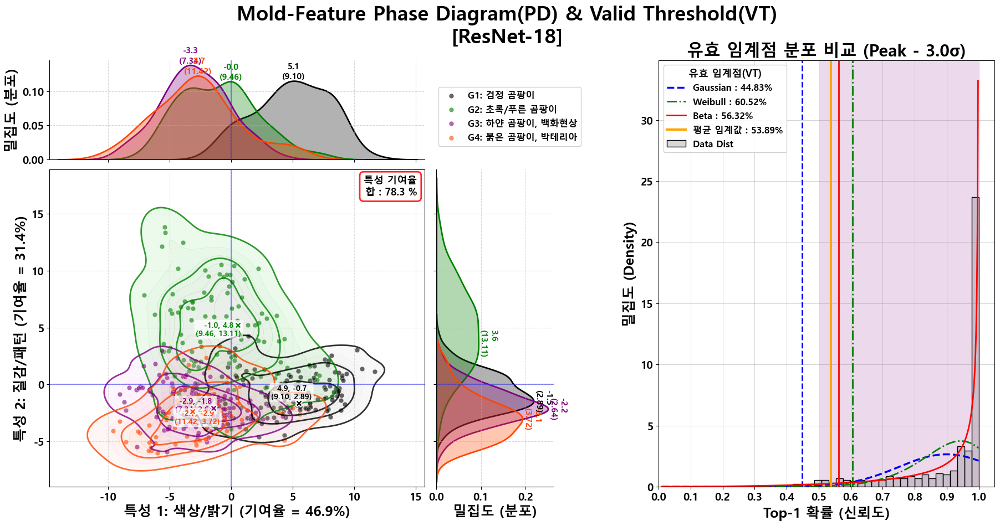

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-18\ResNet-18_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-18\ResNet-18_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.538907              NaN
1          VT_Selected   0.563190          0.05868
2  Gaussian(mode-3.0σ)   0.448329              NaN
3   Weibull(mode-3.0σ)   0.605201              NaN
4      Beta(mode-3.0σ)   0.563190              NaN
>> Mean(G/W/B) Threshold = 53.89%

--------------------------------------------------------------------------------
>> Processing: ResNet-50
--------------------------------------------------------------------------------
>> 로드 완료: ResNet-50 <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\ResNet-50_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=51.63% (from Beta, Peak-3.0σ) | valid_rate=94.1% | target_cdf=0.059
   >> extract_features_for_phase: feature

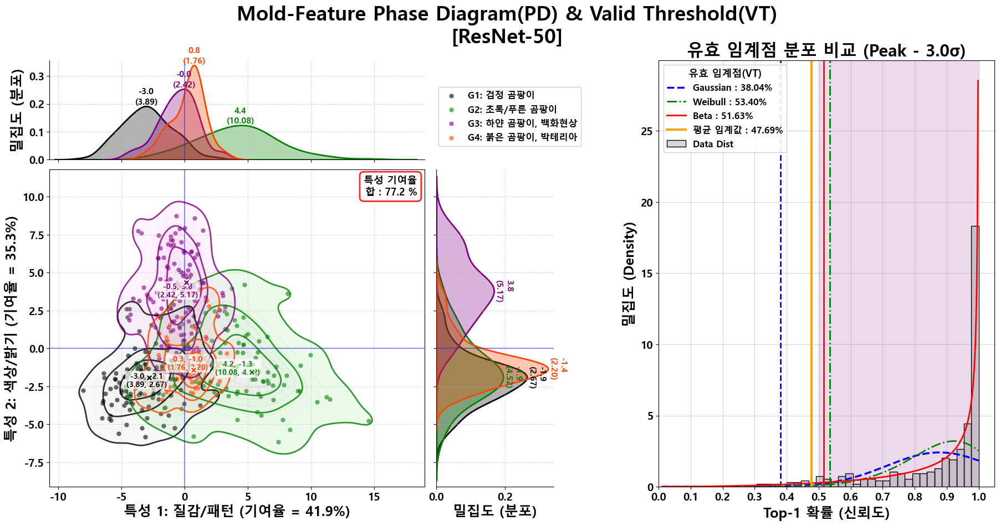

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-50\ResNet-50_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-50\ResNet-50_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.476899              NaN
1          VT_Selected   0.516250          0.05868
2  Gaussian(mode-3.0σ)   0.380406              NaN
3   Weibull(mode-3.0σ)   0.534041              NaN
4      Beta(mode-3.0σ)   0.516250              NaN
>> Mean(G/W/B) Threshold = 47.69%

--------------------------------------------------------------------------------
>> Processing: ConvNeXt-Tiny
--------------------------------------------------------------------------------
>> 로드 완료: ConvNeXt-Tiny <- c:\yssong\Mid_project\Mold-Pang_final\Result_w\ConvNeXt-Tiny_best.pth
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=65.67% (from Beta, Peak-3.0σ) | valid_rate=92.2% | target_cdf=0.078
   >> extract_features_for_ph

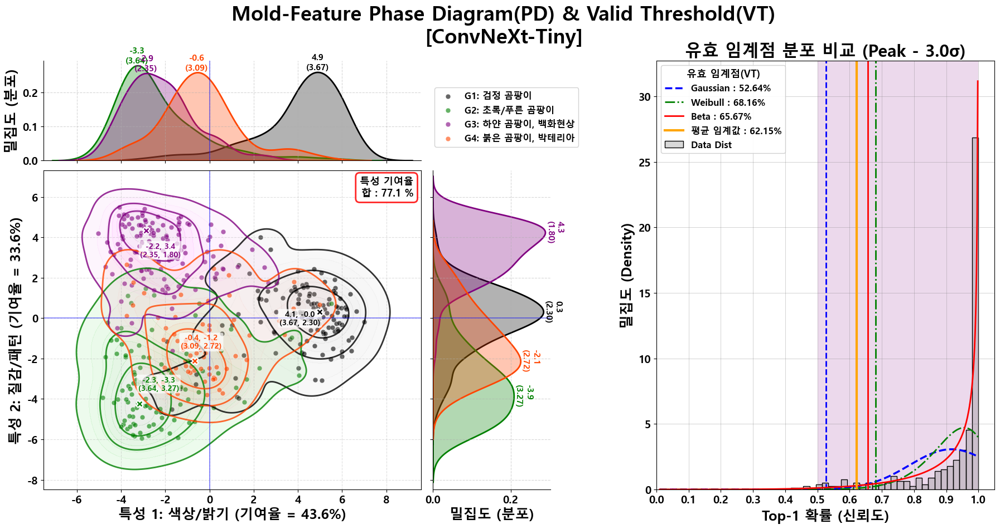

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ConvNeXt-Tiny\ConvNeXt-Tiny_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ConvNeXt-Tiny\ConvNeXt-Tiny_Validity_Thresholds.csv
          Distribution  Threshold  Percentile_Used
0          Mean(G/W/B)   0.621545              NaN
1          VT_Selected   0.656692          0.07824
2  Gaussian(mode-3.0σ)   0.526364              NaN
3   Weibull(mode-3.0σ)   0.681579              NaN
4      Beta(mode-3.0σ)   0.656692              NaN
>> Mean(G/W/B) Threshold = 62.15%

>> 전체 완료.


In [101]:
# =========================================================
# [FULL RUN] Peak - alpha_const*sigma 방식 VT + Plot + Run
#  - 8개 모델 자동 로드/평가/저장 버전
#  - ✅ 가중치: Result_w/<모델명>_best.pth
#  - ✅ 테스트셋: Data_split/test/G1,G2,G3,G4 (ImageFolder)
#  - ✅ 결과 저장: Result_toward/<모델명>/
#      - <모델명>_Phase_and_Threshold.png
#      - <모델명>_Validity_Thresholds.csv
#  - ✅ 아래 그래프 형식/설정(사용자 제공 코드)을 "그대로" 유지
# =========================================================

# -------------------------
# 0) Imports (누락 방지)
# -------------------------
import os
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
from matplotlib import gridspec

import seaborn as sns
from sklearn.decomposition import PCA
from scipy.stats import gaussian_kde
from scipy.stats import norm, beta as beta_dist, weibull_min

from torchvision import datasets, transforms, models


# -------------------------
# 1) Global Config (안전 기본값)
# -------------------------
# ✅ alpha_const 한 곳에서만 관리
ALPHA_CONST = 3.0   # peak - 3.0*sigma (원하시면 여기만 바꾸면 전체 적용)

# ✅ 프로젝트 루트
ROOT_DIR = os.getcwd()

# ✅ 가중치 폴더 / 결과 폴더 / 테스트셋 폴더 (요청사항 반영)
RESULT_W_DIR     = os.path.join(ROOT_DIR, "Result_w")
RESULT_TOWARD_DIR = os.path.join(ROOT_DIR, "Result_toward")
TEST_DIR         = os.path.join(ROOT_DIR, "Data_split", "test")

os.makedirs(RESULT_TOWARD_DIR, exist_ok=True)

# ✅ 색상/라벨 기본값 (이미 있으면 기존값 유지)
if "COLORS" not in globals():
    COLORS = [
        "tab:blue","tab:orange","tab:green","tab:red","tab:purple",
        "tab:brown","tab:pink","tab:gray","tab:olive","tab:cyan"
    ]
if "CUSTOM_LABELS" not in globals():
    CUSTOM_LABELS = {}  # 없으면 원래 class_names 사용

# ✅ 디바이스
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f">> device = {device}")

# ✅ 8개 모델 목록
MODEL_NAMES = [
    "MobileNetV3-Small",
    "MobileNetV2",
    "EfficientNet-B0",
    "DenseNet-121",
    "DenseNet-169",
    "ResNet-18",
    "ResNet-50",
    "ConvNeXt-Tiny",
]


# -------------------------
# 2) 테스트셋 로더 생성 (Data_split/test/G1~G4)
# -------------------------
def build_test_loader(test_dir: str, batch_size: int = 32, num_workers: int = 2):
    """
    Data_split/test 폴더를 ImageFolder로 로드:
      test_dir/
        G1/*.jpg
        G2/*.jpg
        G3/*.jpg
        G4/*.jpg
    """
    if not os.path.exists(test_dir):
        raise FileNotFoundError(f"테스트 폴더가 없습니다: {test_dir}")

    # 일반적인 ImageNet 계열 backbone 입력 크기 224
    tfm = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        # ImageNet mean/std (torchvision pretrained backbone 규격에 맞추기 위해 유지)
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])

    ds = datasets.ImageFolder(test_dir, transform=tfm)

    loader = DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=(device.type == "cuda"),
        drop_last=False,
    )

    return ds, loader


test_dataset, test_loader = build_test_loader(TEST_DIR, batch_size=32, num_workers=2)
class_names = list(test_dataset.classes)  # 예: ['G1','G2','G3','G4']
num_classes = len(class_names)

print(f">> test_dir: {TEST_DIR}")
print(f">> classes({num_classes}): {class_names}")
print(f">> total test images: {len(test_dataset)}")


# -------------------------
# 3) 모델 생성 + 가중치 로드
# -------------------------
def _replace_head_for_num_classes(model, model_name: str, num_classes: int):
    """
    torchvision backbone들의 classifier/head를 num_classes로 교체
    """
    if model_name == "MobileNetV3-Small":
        # classifier[-1] = Linear
        in_f = model.classifier[-1].in_features
        model.classifier[-1] = nn.Linear(in_f, num_classes)

    elif model_name == "MobileNetV2":
        in_f = model.classifier[-1].in_features
        model.classifier[-1] = nn.Linear(in_f, num_classes)

    elif model_name == "EfficientNet-B0":
        in_f = model.classifier[-1].in_features
        model.classifier[-1] = nn.Linear(in_f, num_classes)

    elif model_name == "DenseNet-121":
        in_f = model.classifier.in_features
        model.classifier = nn.Linear(in_f, num_classes)

    elif model_name == "DenseNet-169":
        in_f = model.classifier.in_features
        model.classifier = nn.Linear(in_f, num_classes)

    elif model_name == "ResNet-18":
        in_f = model.fc.in_features
        model.fc = nn.Linear(in_f, num_classes)

    elif model_name == "ResNet-50":
        in_f = model.fc.in_features
        model.fc = nn.Linear(in_f, num_classes)

    elif model_name == "ConvNeXt-Tiny":
        # classifier[-1] = Linear
        in_f = model.classifier[-1].in_features
        model.classifier[-1] = nn.Linear(in_f, num_classes)

    else:
        raise ValueError(f"지원하지 않는 모델명: {model_name}")

    return model


def build_model_by_name(model_name: str, num_classes: int):
    """
    torchvision.models에서 8개 모델 생성 (weights=None)
    """
    if model_name == "MobileNetV3-Small":
        model = models.mobilenet_v3_small(weights=None)
    elif model_name == "MobileNetV2":
        model = models.mobilenet_v2(weights=None)
    elif model_name == "EfficientNet-B0":
        model = models.efficientnet_b0(weights=None)
    elif model_name == "DenseNet-121":
        model = models.densenet121(weights=None)
    elif model_name == "DenseNet-169":
        model = models.densenet169(weights=None)
    elif model_name == "ResNet-18":
        model = models.resnet18(weights=None)
    elif model_name == "ResNet-50":
        model = models.resnet50(weights=None)
    elif model_name == "ConvNeXt-Tiny":
        model = models.convnext_tiny(weights=None)
    else:
        raise ValueError(f"지원하지 않는 모델명: {model_name}")

    model = _replace_head_for_num_classes(model, model_name, num_classes)
    return model


def load_model_for_eval(model_name: str, num_classes: int, device: torch.device):
    """
    Result_w/<모델명>_best.pth 로드해서 eval 모델 반환
    """
    w_path = os.path.join(RESULT_W_DIR, f"{model_name}_best.pth")
    if not os.path.exists(w_path):
        print(f"!! 가중치 없음: {model_name} ({w_path})")
        return None

    model = build_model_by_name(model_name, num_classes)
    ckpt = torch.load(w_path, map_location="cpu")

    # 다양한 저장 형태 대응
    if isinstance(ckpt, dict) and "state_dict" in ckpt:
        state_dict = ckpt["state_dict"]
    elif isinstance(ckpt, dict) and "model_state_dict" in ckpt:
        state_dict = ckpt["model_state_dict"]
    else:
        state_dict = ckpt

    # 혹시 DataParallel로 저장된 경우 키 정리
    new_sd = {}
    for k, v in state_dict.items():
        nk = k.replace("module.", "")
        new_sd[nk] = v

    missing, unexpected = model.load_state_dict(new_sd, strict=False)
    if missing:
        print(f"!! [{model_name}] missing keys (strict=False): {len(missing)}")
    if unexpected:
        print(f"!! [{model_name}] unexpected keys (strict=False): {len(unexpected)}")

    model.to(device)
    model.eval()
    print(f">> 로드 완료: {model_name} <- {w_path}")
    return model


# -------------------------
# 4) Feature/Target 추출 함수 (사용자 코드 그대로)
# -------------------------
def extract_features_for_phase(model, loader, device, feature_layer_name=None):
    """
    Phase Diagram용 feature + target 추출.

    반환:
      features_np: (N, D)  float32
      targets_np:  (N,)    int64

    기본: logits(출력)을 feature로 사용 (가장 안정적으로 동작)
    """
    model.eval()
    feats, targs = [], []

    hook_handle = None
    hooked = {"out": None}

    def _hook_fn(module, inp, out):
        if isinstance(out, (tuple, list)):
            out = out[0]
        hooked["out"] = out

    if feature_layer_name is not None:
        found = False
        for name, m in model.named_modules():
            if name == feature_layer_name:
                hook_handle = m.register_forward_hook(_hook_fn)
                found = True
                break
        if not found:
            print(f"!! feature_layer_name='{feature_layer_name}' 레이어를 못 찾음 -> logits로 대체")
            feature_layer_name = None

    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            out = model(imgs)  # logits 기대

            if feature_layer_name is None:
                f = out
            else:
                f = hooked["out"]
                if f is None:
                    f = out

            if f.dim() > 2:
                f = torch.flatten(f, start_dim=1)

            feats.append(f.detach().cpu())
            targs.append(labels.detach().cpu())

    if hook_handle is not None:
        hook_handle.remove()

    features_np = torch.cat(feats, dim=0).numpy().astype(np.float32)
    targets_np  = torch.cat(targs, dim=0).numpy().astype(np.int64)

    print(f"   >> extract_features_for_phase: features={features_np.shape}, targets={targets_np.shape}")
    return features_np, targets_np


# -------------------------
# 5) VT 계산 함수 (사용자 코드 그대로 / Beta 우선 선택 유지)
# -------------------------
def calculate_conservative_threshold_v2(model, loader, device, class_names, alpha_const=ALPHA_CONST):
    """
    VT = peak(mode) - alpha_const*sigma  (Peak - aσ)
    - 피팅 대상: all Top-1 probs
    - Gaussian/Weibull/Beta 각각 mode & sigma 계산 → threshold 산출
    - 최종 VT는 (가능하면) Beta, 그 다음 Weibull, 그 다음 Gaussian 순으로 선택

    반환:
      vt, all_probs, mu_all, sigma_all, target_cdf, extra(dict)
    """
    print(f"   >> VT 재산출 중... (Peak - {alpha_const}σ 방식)")
    model.eval()

    all_probs = []

    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            probs = torch.softmax(outputs, dim=1)
            max_vals, _ = torch.max(probs, dim=1)
            all_probs.extend(max_vals.detach().cpu().numpy().tolist())

    all_probs = np.array(all_probs, dtype=float)

    # 안전장치
    if len(all_probs) < 10:
        vt = 0.5
        mu_all = float(np.mean(all_probs)) if len(all_probs) else 0.5
        sigma_all = float(np.std(all_probs) + 1e-9) if len(all_probs) else 0.1
        target_cdf = float((all_probs <= vt).mean()) if len(all_probs) else 0.5
        extra = {"VT_Selected": {"vt": vt, "from": "Fallback", "target_cdf": target_cdf}}
        return vt, all_probs, mu_all, sigma_all, target_cdf, extra

    # 전체 분포(경험적) 평균/표준편차 (참고용)
    mu_all = float(np.mean(all_probs))
    sigma_all = float(np.std(all_probs) + 1e-9)

    # Beta 안정화
    x = np.clip(all_probs, 1e-6, 1 - 1e-6)

    extra = {}

    # 1) Gaussian: mode = mu
    g_mode = mu_all
    g_sigma = sigma_all
    g_th = float(np.clip(g_mode - alpha_const * g_sigma, 0.0, 1.0))
    extra["Gaussian"] = {"mode": g_mode, "sigma": g_sigma, "th": g_th}

    # 2) Weibull
    w_th = np.nan
    try:
        k, loc, scale = weibull_min.fit(all_probs, floc=0)
        w_mean, w_var = weibull_min.stats(k, loc=loc, scale=scale, moments='mv')
        w_sigma = float(np.sqrt(w_var))
        if k > 1:
            w_mode = float(loc + scale * ((k - 1.0) / k) ** (1.0 / k))
        else:
            w_mode = float(loc)
        w_th = float(np.clip(w_mode - alpha_const * w_sigma, 0.0, 1.0))
        extra["Weibull"] = {
            "k": float(k), "loc": float(loc), "scale": float(scale),
            "mode": w_mode, "sigma": w_sigma, "th": w_th
        }
    except Exception as e:
        extra["Weibull"] = {"error": str(e)}

    # 3) Beta
    b_th = np.nan
    try:
        a, b, loc_b, scale_b = beta_dist.fit(x, floc=0, fscale=1)
        b_mean, b_var = beta_dist.stats(a, b, loc=loc_b, scale=scale_b, moments='mv')
        b_sigma = float(np.sqrt(b_var))

        if a > 1 and b > 1:
            b_mode = float((a - 1.0) / (a + b - 2.0))
        elif a <= 1 and b > 1:
            b_mode = 0.0
        elif a > 1 and b <= 1:
            b_mode = 1.0
        else:
            b_mode = 0.0

        b_th = float(np.clip(b_mode - alpha_const * b_sigma, 0.0, 1.0))
        extra["Beta"] = {"a": float(a), "b": float(b), "mode": b_mode, "sigma": b_sigma, "th": b_th}
    except Exception as e:
        extra["Beta"] = {"error": str(e)}

    # ✅ 최종 VT 선택 (Beta 고정)
    if not np.isnan(b_th):
        vt = float(b_th)
        vt_from = "Beta"
    elif not np.isnan(w_th):
        vt = float(w_th)
        vt_from = "Weibull"
    else:
        vt = float(g_th)
        vt_from = "Gaussian"

    target_cdf = float((all_probs <= vt).mean())
    valid_rate = float((all_probs >= vt).mean())

    print(f"   >> VT={vt*100:.2f}% (from {vt_from}, Peak-{alpha_const}σ) | "
          f"valid_rate={valid_rate*100:.1f}% | target_cdf={target_cdf:.3f}")

    return vt, all_probs, mu_all, sigma_all, target_cdf, extra


# -------------------------
# 6) Plot 함수 (사용자 코드 그대로)
# -------------------------
def plot_phase_and_threshold(features, targets, top1_probs,
                             vt, mu, sigma, target_cdf, extra,
                             class_names, save_dir, model_name, alpha_const=ALPHA_CONST):
    print(">> Phase Diagram + Valid Threshold 그래프 생성 중...")

    fig = plt.figure(figsize=(22, 10))
    outer = gridspec.GridSpec(1, 2, width_ratios=[1.2, 0.8], wspace=0.25)

    # ===== Left: Phase Diagram =====
    left = outer[0].subgridspec(4, 4, wspace=0.1, hspace=0.1)
    ax_main = fig.add_subplot(left[1:4, 0:3])
    ax_top = fig.add_subplot(left[0, 0:3], sharex=ax_main)
    ax_right = fig.add_subplot(left[1:4, 3], sharey=ax_main)

    # PCA
    pca = PCA(n_components=2)
    projected = pca.fit_transform(features)
    var_ratio = pca.explained_variance_ratio_

    # 축 의미 자동 해석 (Cell10 방식)
    g1_idx = [i for i, x in enumerate(class_names) if 'G1' in x][0] if any('G1' in x for x in class_names) else 0
    g3_idx = [i for i, x in enumerate(class_names) if 'G3' in x][0] if any('G3' in x for x in class_names) else min(2, len(class_names)-1)

    g1_c = np.mean(projected[targets == g1_idx], axis=0) if np.any(targets == g1_idx) else np.array([0, 0])
    g3_c = np.mean(projected[targets == g3_idx], axis=0) if np.any(targets == g3_idx) else np.array([0, 0])

    var_txt_1 = f"{var_ratio[0]*100:.1f}%"
    var_txt_2 = f"{var_ratio[1]*100:.1f}%"

    # [NEW] 기여율 합 라벨 (우측상단)
    contrib_sum = (var_ratio[0] + var_ratio[1]) * 100.0
    sum_text = f"특성 기여율\n합 : {contrib_sum:.1f} %"

    ax_main.text(
        0.98, 0.98, sum_text,
        transform=ax_main.transAxes,
        ha="right", va="top",
        fontsize=13, fontweight="bold",
        bbox=dict(facecolor="white", alpha=0.85, edgecolor="red", linewidth=2,
                  boxstyle="round,pad=0.4")
    )

    if abs(g1_c[0] - g3_c[0]) > abs(g1_c[1] - g3_c[1]):
        xlabel = f"특성 1: 색상/밝기 (기여율 = {var_txt_1})"
        ylabel = f"특성 2: 질감/패턴 (기여율 = {var_txt_2})"
    else:
        xlabel = f"특성 1: 질감/패턴 (기여율 = {var_txt_1})"
        ylabel = f"특성 2: 색상/밝기 (기여율 = {var_txt_2})"

    CUSTOM_LABELS.update({
        "G1": "G1: 검정/진갈색 곰팡이",
        "G2": "G2: 녹색/청색 곰팡이",
        "G3": "G3: 하얀 곰팡이, 백화현상",
        "G4": "G4: 황색/분홍(박테리아 포함)",
    })

    # 클래스별 그리기
    for i, cls in enumerate(class_names):
        idx = (targets == i)
        subset = projected[idx]
        if len(subset) < 5:
            continue

        color = COLORS[i % len(COLORS)]
        label_txt = CUSTOM_LABELS.get(cls, cls)

        # ✅ 포함 매칭으로 라벨 강제(클래스명이 G1_XXX 형태여도 적용됨)
        if "G1" in cls:
            label_txt = "G1: 검정 곰팡이"
        elif "G2" in cls:
            label_txt = "G2: 초록/푸른 곰팡이"
        elif "G3" in cls:
            label_txt = "G3: 하얀 곰팡이, 백화현상"
        elif "G4" in cls:
            label_txt = "G4: 붉은 곰팡이, 박테리아"

        sns.kdeplot(x=subset[:, 0], y=subset[:, 1], ax=ax_main,
                    levels=8, thresh=0.05, color=color, fill=True, alpha=0.1)
        sns.kdeplot(x=subset[:, 0], y=subset[:, 1], ax=ax_main,
                    levels=4, thresh=0.05, color=color, linewidths=2.0, alpha=0.8)

        ax_main.scatter(subset[:, 0], subset[:, 1],
                        c=color, s=40, alpha=0.6,
                        label=label_txt,
                        edgecolors='white', linewidth=0.5)

        mean_x = np.mean(subset[:, 0]); mean_y = np.mean(subset[:, 1])
        var_x = np.var(subset[:, 0]); var_y = np.var(subset[:, 1])
        anno_text_main = f"{mean_x:.1f}, {mean_y:.1f}\n({var_x:.2f}, {var_y:.2f})"
        ax_main.text(mean_x, mean_y, anno_text_main,
                     fontsize=10, color=color, fontweight='bold',
                     ha='center', va='center',
                     bbox=dict(facecolor='white', alpha=0.7, edgecolor='none',
                               boxstyle='round,pad=0.2'))

        # 2D KDE Peak 위치 X 표시
        try:
            kde2 = gaussian_kde(subset.T)
            x_min, x_max = subset[:, 0].min(), subset[:, 0].max()
            y_min, y_max = subset[:, 1].min(), subset[:, 1].max()
            xg, yg = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
            zg = kde2(np.vstack([xg.flatten(), yg.flatten()]))
            pidx = np.argmax(zg)
            peak_x = xg.flatten()[pidx]
            peak_y = yg.flatten()[pidx]
            ax_main.scatter(peak_x, peak_y, c=color, s=80, marker='X',
                            edgecolors='white', linewidth=1.5, zorder=6)
        except:
            pass

        # Top KDE + peak 텍스트
        sns.kdeplot(x=subset[:, 0], ax=ax_top, color=color, fill=True, alpha=0.3, linewidth=2)
        kde_x = gaussian_kde(subset[:, 0])
        x_grid = np.linspace(subset[:, 0].min(), subset[:, 0].max(), 100)
        y_vals = kde_x(x_grid)
        peak_idx = np.argmax(y_vals)
        ax_top.text(x_grid[peak_idx], y_vals[peak_idx],
                    f"{x_grid[peak_idx]:.1f}\n({var_x:.2f})",
                    color=color, fontsize=11, fontweight='bold',
                    ha='center', va='bottom')

        # Right KDE + peak 텍스트
        sns.kdeplot(y=subset[:, 1], ax=ax_right, color=color, fill=True, alpha=0.3, linewidth=2)
        kde_y = gaussian_kde(subset[:, 1])
        y_grid = np.linspace(subset[:, 1].min(), subset[:, 1].max(), 100)
        x_vals = kde_y(y_grid)
        peak_idx_y = np.argmax(x_vals)
        ax_right.text(x_vals[peak_idx_y], y_grid[peak_idx_y],
                      f"{y_grid[peak_idx_y]:.1f}\n({var_y:.2f})",
                      color=color, fontsize=11, fontweight='bold',
                      ha='left', va='center', rotation=270)

    # 기준선(0)
    for ax in [ax_main, ax_top, ax_right]:
        line_kwargs = {'color': 'blue', 'alpha': 0.5, 'linestyle': '-', 'linewidth': 1.2}
        if ax == ax_right:
            ax.axhline(0, **line_kwargs)
        elif ax == ax_top:
            ax.axvline(0, **line_kwargs)
        else:
            ax.axhline(0, **line_kwargs)
            ax.axvline(0, **line_kwargs)

    ax_top.set_ylim(bottom=0)
    ax_top.set_ylabel("밀집도 (분포)", fontweight='bold')
    ax_top.grid(True, linestyle='--', alpha=0.5)
    plt.setp(ax_top.get_xticklabels(), visible=False)
    ax_top.spines['top'].set_visible(False)
    ax_top.spines['right'].set_visible(False)

    ax_right.set_xlim(left=0)
    ax_right.set_xlabel("밀집도 (분포)", fontweight='bold')
    ax_right.grid(True, linestyle='--', alpha=0.5)
    plt.setp(ax_right.get_yticklabels(), visible=False)
    ax_right.spines['top'].set_visible(False)
    ax_right.spines['right'].set_visible(False)

    ax_main.set_xlabel(xlabel, fontweight='bold')
    ax_main.set_ylabel(ylabel, fontweight='bold')
    ax_main.grid(True, linestyle='--', alpha=0.4)

    # Figure legend
    handles, labels = ax_main.get_legend_handles_labels()
    if ax_main.get_legend() is not None:
        ax_main.get_legend().remove()

    fig.legend(
        handles, labels,
        loc='upper left',
        bbox_to_anchor=(0.44, 0.84),
        frameon=True, fancybox=True, framealpha=0.9,
        prop={'weight': 'bold', 'size': 12}
    )

    # ===== Right: Valid Threshold =====
    ax_dist = fig.add_subplot(outer[1])

    # [NEW] 배경 강조 + 그리드(0.1 간격)
    ax_dist.axvspan(0.5, 1.0, facecolor='purple', alpha=0.15, zorder=0)
    ax_dist.set_xticks(np.arange(0.0, 1.01, 0.1))
    ax_dist.grid(True, which='major', axis='both',
                 linestyle='-', linewidth=0.7, alpha=0.35, color='gray')

    sns.histplot(top1_probs, bins=30, kde=False, stat="density",
                 color="gray", alpha=0.3, ax=ax_dist, label="Data Dist")

    x_range = np.linspace(0.01, 1.0, 500)

    # Gaussian
    g = extra.get("Gaussian", {})
    g_th = g.get("th", np.nan)
    pdf_norm = norm.pdf(x_range, mu, sigma)
    ax_dist.plot(x_range, pdf_norm, color='blue', linestyle='--', linewidth=2.5,
                 label=f"Gaussian : {g_th*100:.2f}%")
    if not np.isnan(g_th):
        ax_dist.axvline(g_th, color='blue', linestyle='--', linewidth=2)

    # Weibull
    w = extra.get("Weibull", {})
    w_th = w.get("th", np.nan)
    if not np.isnan(w_th) and all(k in w for k in ["k", "loc", "scale"]):
        pdf_weibull = weibull_min.pdf(x_range, w["k"], w["loc"], w["scale"])
        ax_dist.plot(x_range, pdf_weibull, color='green', linestyle='-.', linewidth=2,
                     label=f"Weibull : {w_th*100:.2f}%")
        ax_dist.axvline(w_th, color='green', linestyle='-.', linewidth=2)

    # Beta
    b = extra.get("Beta", {})
    b_th = b.get("th", np.nan)
    if not np.isnan(b_th) and all(k in b for k in ["a", "b"]):
        pdf_beta = beta_dist.pdf(x_range, b["a"], b["b"], loc=0, scale=1)
        ax_dist.plot(x_range, pdf_beta, color='red', linestyle='-', linewidth=2,
                     label=f"Beta : {b_th*100:.2f}%")
        ax_dist.axvline(b_th, color='red', linestyle='-', linewidth=2)

    # [NEW] 3분포 VT 평균(주황색 세로선) + legend 항목
    th_list = []
    if not np.isnan(g_th): th_list.append(float(g_th))
    if not np.isnan(w_th): th_list.append(float(w_th))
    if not np.isnan(b_th): th_list.append(float(b_th))

    if len(th_list) > 0:
        vt_mean = float(np.mean(th_list))
        ax_dist.axvline(vt_mean, color='orange', linestyle='-', linewidth=3,
                        label=f"평균 임계값 : {vt_mean*100:.2f}%")

    ax_dist.legend(loc='upper left', fontsize=12, framealpha=0.9,
                   prop={'weight': 'bold'},
                   title="유효 임계점(VT)", title_fontsize=13)

    ax_dist.set_title(f"유효 임계점 분포 비교 (Peak - {alpha_const}σ)", fontweight='bold')
    ax_dist.set_xlabel("Top-1 확률 (신뢰도)", fontweight='bold')
    ax_dist.set_ylabel("밀집도 (Density)", fontweight='bold')
    ax_dist.set_ylim(bottom=0)
    ax_dist.set_xlim(0.0, 1.05)

    plt.suptitle(f"Mold-Feature Phase Diagram(PD) & Valid Threshold(VT)\n[{model_name}]",
                 fontweight='bold', y=0.98)

    # Save figure
    os.makedirs(save_dir, exist_ok=True)
    save_path = os.path.join(save_dir, f"{model_name}_Phase_and_Threshold.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f">> 저장 완료: {save_path}")

    # Save CSV
    csv_path = os.path.join(save_dir, f"{model_name}_Validity_Thresholds.csv")

    # 3분포(Gaussian/Weibull/Beta) 임계값 평균 계산 (NaN 제외)
    g_th = extra.get("Gaussian", {}).get("th", np.nan)
    w_th = extra.get("Weibull", {}).get("th", np.nan)
    b_th = extra.get("Beta", {}).get("th", np.nan)

    mean_th = float(np.nanmean([g_th, w_th, b_th]))

    # CSV 테이블 생성
    df_thresh = pd.DataFrame([
        {"Distribution": "Mean(G/W/B)", "Threshold": mean_th, "Percentile_Used": np.nan},
        {"Distribution": "VT_Selected",                     "Threshold": vt,     "Percentile_Used": target_cdf},
        {"Distribution": f"Gaussian(mode-{alpha_const}σ)",  "Threshold": g_th,   "Percentile_Used": np.nan},
        {"Distribution": f"Weibull(mode-{alpha_const}σ)",   "Threshold": w_th,   "Percentile_Used": np.nan},
        {"Distribution": f"Beta(mode-{alpha_const}σ)",      "Threshold": b_th,   "Percentile_Used": np.nan},
    ])

    df_thresh.to_csv(csv_path, index=False)
    print(f">> [CSV] Threshold 값 저장 완료: {csv_path}")
    print(df_thresh)
    print(f">> Mean(G/W/B) Threshold = {mean_th*100:.2f}%")


# -------------------------
# 7) 실행부: 8개 모델 반복 실행 + Result_toward/<모델명>/에 저장
# -------------------------
print("\n" + "=" * 80)
print(">> [RUN] Phase Diagram & Validity Threshold for 8 Models")
print("   - weights: Result_w/<model>_best.pth")
print("   - testset: Data_split/test (G1~G4)")
print("   - save:    Result_toward/<model>/")
print("=" * 80)

for m_name in MODEL_NAMES:
    print("\n" + "-" * 80)
    print(f">> Processing: {m_name}")
    print("-" * 80)

    mod = load_model_for_eval(m_name, num_classes=num_classes, device=device)
    if mod is None:
        continue

    # ✅ 저장 폴더: Result_toward/<모델명>/
    save_dir = os.path.join(RESULT_TOWARD_DIR, m_name.replace(" ", "_"))
    os.makedirs(save_dir, exist_ok=True)

    try:
        # 1) VT 산출 (Top-1 probs 포함)
        vt, probs, mu, sigma, t_cdf, extra = calculate_conservative_threshold_v2(
            mod, test_loader, device, class_names, alpha_const=ALPHA_CONST
        )

        # 2) feature/target 추출 (기본: logits)
        feats, targs = extract_features_for_phase(mod, test_loader, device)

        # 3) plot + csv 저장
        plot_phase_and_threshold(
            feats, targs, probs,
            vt, mu, sigma, t_cdf, extra,
            class_names, save_dir, m_name,
            alpha_const=ALPHA_CONST
        )

    except Exception as e:
        print(f"!! Error ({m_name}): {e}")
        import traceback
        traceback.print_exc()

print("\n>> 전체 완료.")


[PATH CHECK]
ROOT_DIR       : c:\yssong\Mid_project\Mold-Pang_final
RESULT_W_DIR   : c:\yssong\Mid_project\Mold-Pang_final\Result_w
TEST_DIR       : c:\yssong\Mid_project\Mold-Pang_final\Data_split\test
BASE_RESULT_DIR: c:\yssong\Mid_project\Mold-Pang_final\Result_toward
>> TEST_DIR 그룹 폴더(G1~G4) 확인 완료.
>> class_names(from folder): ['G1', 'G2', 'G3', 'G4']
>> device: cuda:0

>> [Cell10] Phase Diagram & Validity Threshold (8 Models) - RUN

--------------------------------------------------------------------------------
>> Processing: DenseNet-121
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\DenseNet-121_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-121
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=64.56% (from Beta, Peak-3.0σ) | valid_rate=92.7% | target_cdf=0.073
   >> extract_features_for_phase: features=(409, 4), targets=(409,)
>> Phase Diagram + Valid Thresho

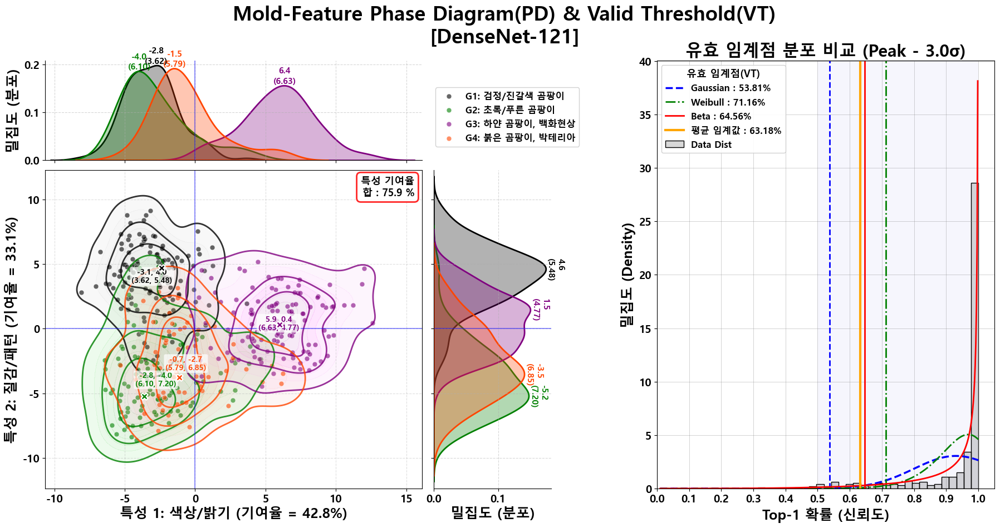

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-121\DenseNet-121_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-121\DenseNet-121_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.631771              NaN
1  VT_Selected(BetaPriority)   0.645610          0.07335
2        Gaussian(mode-3.0σ)   0.538088              NaN
3         Weibull(mode-3.0σ)   0.711616              NaN
4            Beta(mode-3.0σ)   0.645610              NaN
>> Mean(G/W/B) Threshold = 63.18%

--------------------------------------------------------------------------------
>> Processing: DenseNet-169
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\DenseNet-169_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-169
   >> VT 재산출 중... (Peak - 3.0σ 방식)


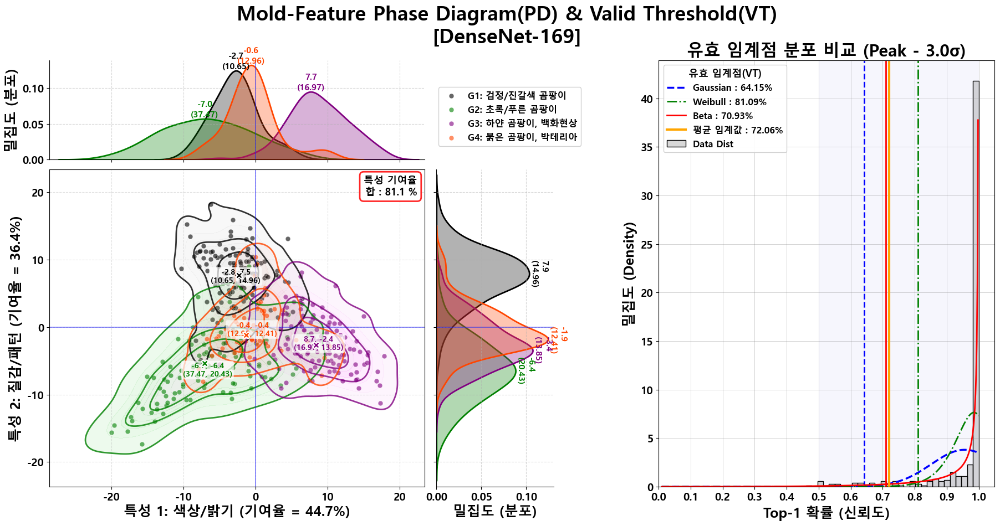

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-169\DenseNet-169_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\DenseNet-169\DenseNet-169_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.720576              NaN
1  VT_Selected(BetaPriority)   0.709333          0.06357
2        Gaussian(mode-3.0σ)   0.641508              NaN
3         Weibull(mode-3.0σ)   0.810887              NaN
4            Beta(mode-3.0σ)   0.709333              NaN
>> Mean(G/W/B) Threshold = 72.06%

--------------------------------------------------------------------------------
>> Processing: ResNet-18
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\ResNet-18_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-18
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=

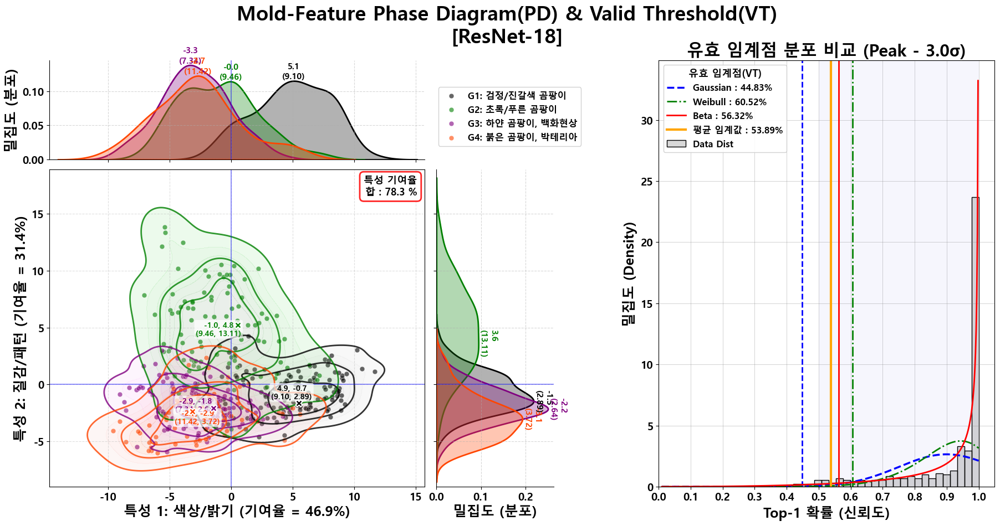

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-18\ResNet-18_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-18\ResNet-18_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.538907              NaN
1  VT_Selected(BetaPriority)   0.563190          0.05868
2        Gaussian(mode-3.0σ)   0.448329              NaN
3         Weibull(mode-3.0σ)   0.605201              NaN
4            Beta(mode-3.0σ)   0.563190              NaN
>> Mean(G/W/B) Threshold = 53.89%

--------------------------------------------------------------------------------
>> Processing: ResNet-50
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\ResNet-50_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-50
   >> VT 재산출 중... (Peak - 3.0σ 방식)
   >> VT=51.63% (from

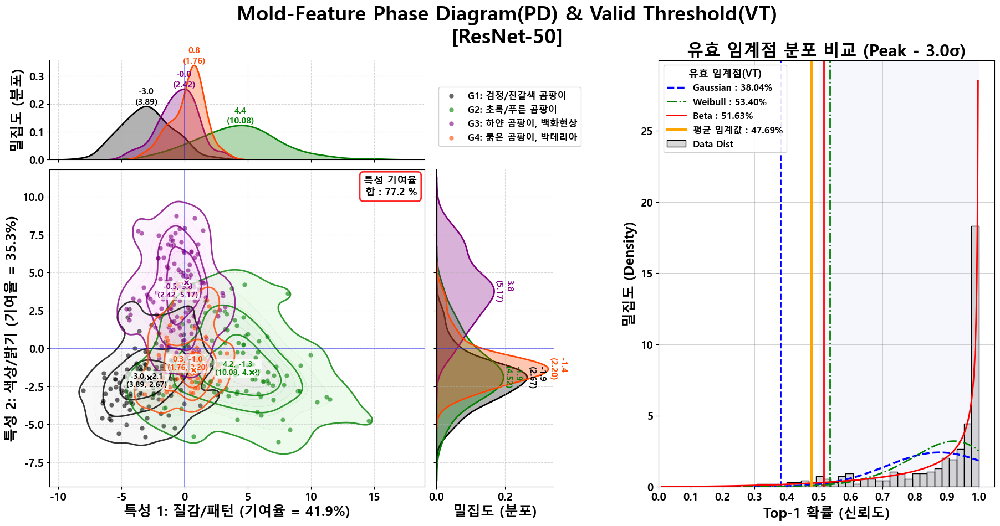

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-50\ResNet-50_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ResNet-50\ResNet-50_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.476899              NaN
1  VT_Selected(BetaPriority)   0.516250          0.05868
2        Gaussian(mode-3.0σ)   0.380406              NaN
3         Weibull(mode-3.0σ)   0.534041              NaN
4            Beta(mode-3.0σ)   0.516250              NaN
>> Mean(G/W/B) Threshold = 47.69%

--------------------------------------------------------------------------------
>> Processing: MobileNetV3-Small
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\MobileNetV3-Small_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV3-Small
   >> VT 재산출 중... (Peak - 3.0σ 방

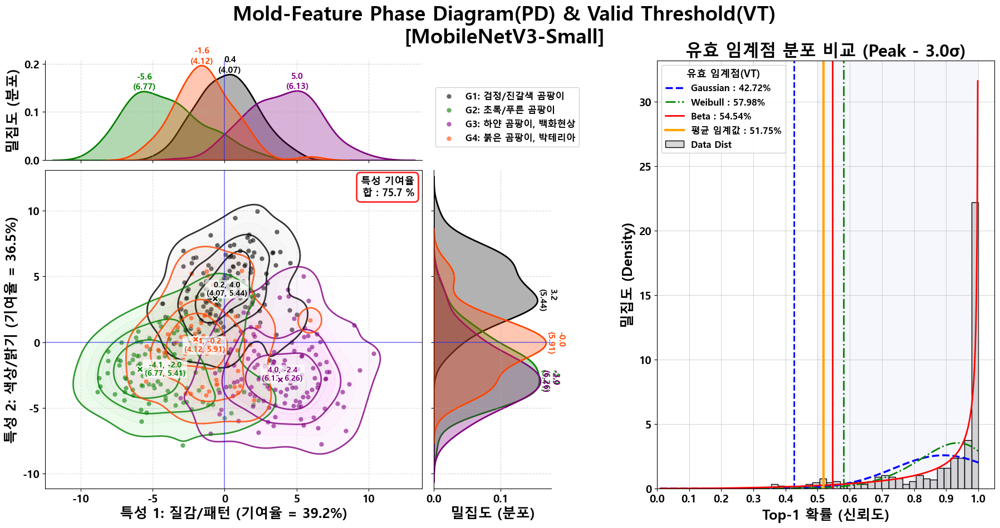

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV3-Small\MobileNetV3-Small_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV3-Small\MobileNetV3-Small_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.517507              NaN
1  VT_Selected(BetaPriority)   0.545431         0.056235
2        Gaussian(mode-3.0σ)   0.427241              NaN
3         Weibull(mode-3.0σ)   0.579848              NaN
4            Beta(mode-3.0σ)   0.545431              NaN
>> Mean(G/W/B) Threshold = 51.75%

--------------------------------------------------------------------------------
>> Processing: MobileNetV2
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\MobileNetV2_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV2
   >> VT 재산출 중... 

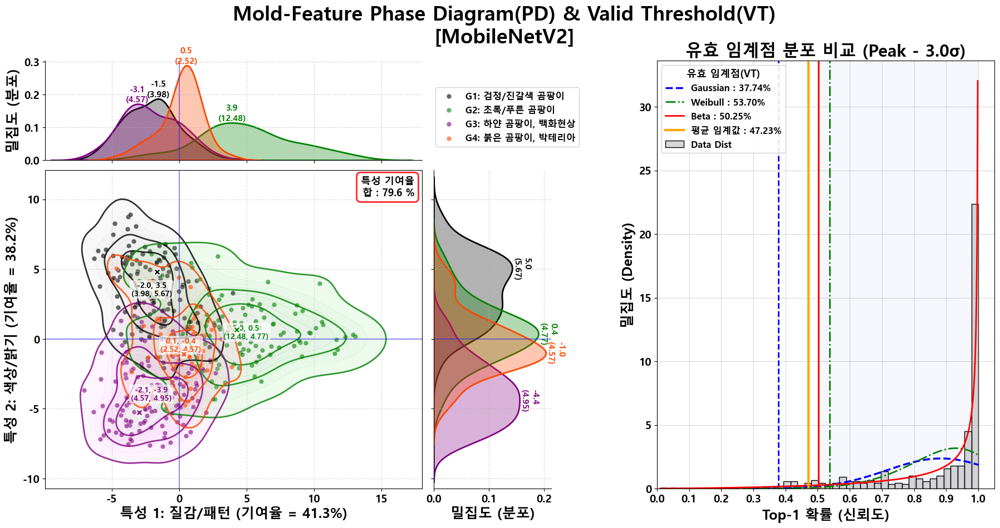

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV2\MobileNetV2_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\MobileNetV2\MobileNetV2_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.472291              NaN
1  VT_Selected(BetaPriority)   0.502453          0.05868
2        Gaussian(mode-3.0σ)   0.377433              NaN
3         Weibull(mode-3.0σ)   0.536986              NaN
4            Beta(mode-3.0σ)   0.502453              NaN
>> Mean(G/W/B) Threshold = 47.23%

--------------------------------------------------------------------------------
>> Processing: EfficientNet-B0
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\EfficientNet-B0_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\EfficientNet-B0
   >> VT 재산출 중... (Peak - 3.0σ

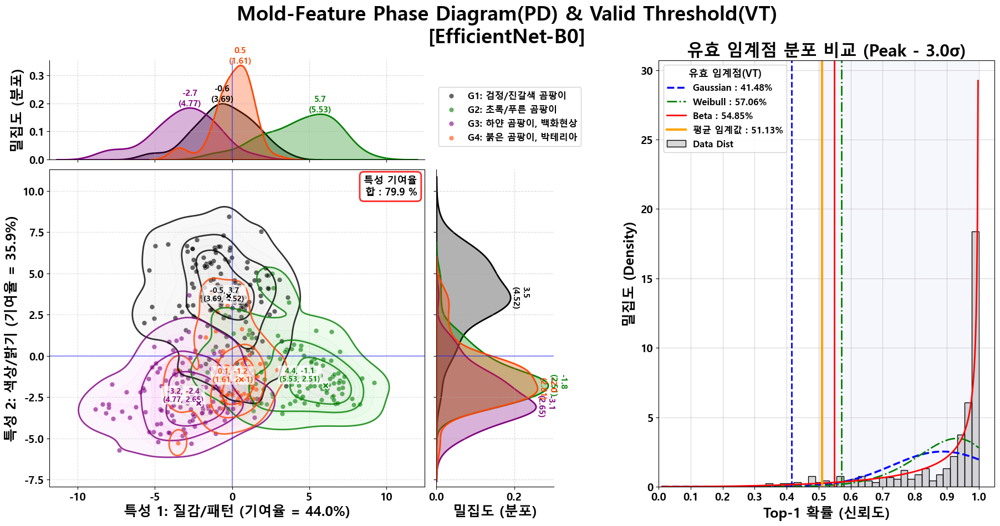

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\EfficientNet-B0\EfficientNet-B0_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\EfficientNet-B0\EfficientNet-B0_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.511288              NaN
1  VT_Selected(BetaPriority)   0.548505          0.06357
2        Gaussian(mode-3.0σ)   0.414799              NaN
3         Weibull(mode-3.0σ)   0.570559              NaN
4            Beta(mode-3.0σ)   0.548505              NaN
>> Mean(G/W/B) Threshold = 51.13%

--------------------------------------------------------------------------------
>> Processing: ConvNeXt-Tiny
--------------------------------------------------------------------------------
>> 로드 중: c:\yssong\Mid_project\Mold-Pang_final\Result_w\ConvNeXt-Tiny_best.pth
>> Save Dir: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ConvNeXt-Tiny
   >> VT 재산출 중... (P

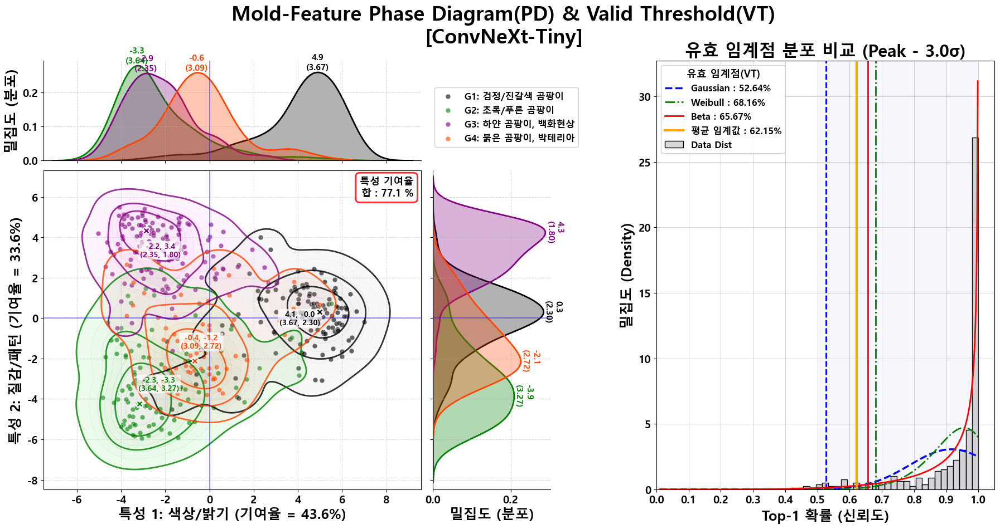

>> 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ConvNeXt-Tiny\ConvNeXt-Tiny_Phase_and_Threshold.png
>> [CSV] Threshold 값 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result_toward\ConvNeXt-Tiny\ConvNeXt-Tiny_Validity_Thresholds.csv
                Distribution  Threshold  Percentile_Used
0                Mean(G/W/B)   0.621545              NaN
1  VT_Selected(BetaPriority)   0.656692          0.07824
2        Gaussian(mode-3.0σ)   0.526364              NaN
3         Weibull(mode-3.0σ)   0.681579              NaN
4            Beta(mode-3.0σ)   0.656692              NaN
>> Mean(G/W/B) Threshold = 62.15%

>> DONE: All models completed.


In [96]:
# ==========================================
# [Cell 10 - FULL] 8가지 모델별 Phase Diagram + Valid Threshold (좌/우)
# - Weights:        ROOT/Result_w/<MODEL>_best.pth
# - Test images:    ROOT/Data_split/test/G1~G4/*
# - Save outputs:   ROOT/Result_toward/<MODEL>/  (png + csv)
# ==========================================

import os
import sys
import warnings
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from sklearn.decomposition import PCA
from scipy.stats import gaussian_kde
from scipy.stats import norm, beta as beta_dist, weibull_min

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

warnings.filterwarnings("ignore")

# -------------------------
# 0) Global Config
# -------------------------
ALPHA_CONST = 3.0  # Peak - a*sigma

MODEL_NAMES = [
    "DenseNet-121",
    "DenseNet-169",
    "ResNet-18",
    "ResNet-50",
    "MobileNetV3-Small",
    "MobileNetV2",
    "EfficientNet-B0",
    "ConvNeXt-Tiny",
]

# (원하시면 여기 색상 변경 가능)
COLORS = ['#000000', '#008000', '#800080', '#FF4500']  # G1~G4용 4색
CUSTOM_LABELS = {
    "G1": "G1: 검정/진갈색 곰팡이",
    "G2": "G2: 초록/푸른 곰팡이",
    "G3": "G3: 하얀 곰팡이, 백화현상",
    "G4": "G4: 붉은 곰팡이, 박테리아",
}

# -------------------------
# 1) Path Check (요구사항 반영)
# -------------------------
ROOT_DIR = os.getcwd()

# ✅ Weights from Result_w
RESULT_W_DIR = os.path.join(ROOT_DIR, "Result_w")

# ✅ Test images from Data_split/test
TEST_DIR = os.path.join(ROOT_DIR, "Data_split", "test")

# ✅ Outputs to Result_toward/<model>/
BASE_RESULT_DIR = os.path.join(ROOT_DIR, "Result_toward")
os.makedirs(BASE_RESULT_DIR, exist_ok=True)

print("=" * 80)
print("[PATH CHECK]")
print("ROOT_DIR       :", ROOT_DIR)
print("RESULT_W_DIR   :", RESULT_W_DIR)
print("TEST_DIR       :", TEST_DIR)
print("BASE_RESULT_DIR:", BASE_RESULT_DIR)
print("=" * 80)

# 폴더 존재 점검
if not os.path.isdir(RESULT_W_DIR):
    print(f"!! RESULT_W_DIR 폴더가 없습니다: {RESULT_W_DIR}")
if not os.path.isdir(TEST_DIR):
    print(f"!! TEST_DIR 폴더가 없습니다: {TEST_DIR}")

# TEST_DIR 하위 폴더(G1~G4) 점검
expected_groups = ["G1", "G2", "G3", "G4"]
missing_groups = [g for g in expected_groups if not os.path.isdir(os.path.join(TEST_DIR, g))]
if missing_groups:
    print(f"!! TEST_DIR 안에 누락된 그룹 폴더: {missing_groups}")
else:
    print(">> TEST_DIR 그룹 폴더(G1~G4) 확인 완료.")

# -------------------------
# 2) Style
# -------------------------
def set_style():
    if sys.platform == 'win32':
        plt.rcParams['font.family'] = 'Malgun Gothic'
    elif sys.platform == 'darwin':
        plt.rcParams['font.family'] = 'AppleGothic'
    else:
        plt.rcParams['font.family'] = 'NanumGothic'

    plt.rcParams['axes.unicode_minus'] = False
    plt.rcParams['font.weight'] = 'bold'
    plt.rcParams['axes.labelweight'] = 'bold'
    plt.rcParams['axes.titleweight'] = 'bold'

    plt.rcParams['font.size'] = 14
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.labelsize'] = 18
    plt.rcParams['xtick.labelsize'] = 14
    plt.rcParams['ytick.labelsize'] = 14
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['figure.titlesize'] = 26

set_style()

# -------------------------
# 3) Test Loader from Data_split/test/G1~G4
# -------------------------
# 모델 입력 크기(통일): 224 (대부분 ImageNet backbone 기본)
test_tf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

test_dataset = datasets.ImageFolder(TEST_DIR, transform=test_tf)
test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

# ImageFolder의 class index는 폴더명 정렬 기준
class_names = test_dataset.classes
print(">> class_names(from folder):", class_names)

# 색상/라벨 길이 보호(반드시 4개일 때 COLORS가 맞도록)
if len(class_names) != 4:
    print(f"!! 현재 class_names가 4개가 아닙니다: {class_names}")
    print("   -> Data_split/test 하위 폴더가 G1,G2,G3,G4인지 확인하세요.")

# -------------------------
# 4) (필수) 모델 생성 함수 (프로젝트에 이미 존재한다고 가정)
#    - get_model(model_name, num_classes=4)
#    - device 정의
# -------------------------
# ⚠️ 아래 두 변수/함수는 프로젝트에 기존 정의가 있어야 합니다.
#   device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#   get_model(model_name, num_classes)
#
# 만약 device가 없다면 아래 주석 해제:
if "device" not in globals():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(">> device:", device)

if "get_model" not in globals():
    raise RuntimeError("!! get_model(model_name, num_classes) 함수가 현재 노트북/프로젝트에 정의되어 있어야 합니다.")

# -------------------------
# 5) Load Model from Result_w/<MODEL>_best.pth
# -------------------------
def load_model_for_analysis(model_name, num_classes):
    weight_path = os.path.join(RESULT_W_DIR, f"{model_name}_best.pth")

    if not os.path.exists(weight_path):
        print(f"!! 가중치 없음: {model_name} ({weight_path})")
        return None

    print(f">> 로드 중: {weight_path}")
    model = get_model(model_name, num_classes=num_classes)
    state = torch.load(weight_path, map_location=device)
    model.load_state_dict(state)
    model.to(device)
    model.eval()
    return model

# -------------------------
# 6) Feature Extraction (Phase Diagram point marker용)
# -------------------------
def extract_features_for_phase(model, loader, device, feature_layer_name=None):
    """
    Phase Diagram용 feature + target 추출.
    기본: logits(출력)을 feature로 사용 (가장 안정적으로 동작)
    """
    model.eval()
    feats, targs = [], []

    hook_handle = None
    hooked = {"out": None}

    def _hook_fn(module, inp, out):
        if isinstance(out, (tuple, list)):
            out = out[0]
        hooked["out"] = out

    if feature_layer_name is not None:
        found = False
        for name, m in model.named_modules():
            if name == feature_layer_name:
                hook_handle = m.register_forward_hook(_hook_fn)
                found = True
                break
        if not found:
            print(f"!! feature_layer_name='{feature_layer_name}' 레이어를 못 찾음 -> logits로 대체")
            feature_layer_name = None

    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            out = model(imgs)  # logits

            if feature_layer_name is None:
                f = out
            else:
                f = hooked["out"]
                if f is None:
                    f = out

            if f.dim() > 2:
                f = torch.flatten(f, start_dim=1)

            feats.append(f.detach().cpu())
            targs.append(labels.detach().cpu())

    if hook_handle is not None:
        hook_handle.remove()

    features_np = torch.cat(feats, dim=0).numpy().astype(np.float32)
    targets_np  = torch.cat(targs, dim=0).numpy().astype(np.int64)

    print(f"   >> extract_features_for_phase: features={features_np.shape}, targets={targets_np.shape}")
    return features_np, targets_np

# -------------------------
# 7) VT 계산 (Peak - alpha_const*sigma)  + Beta 우선 선택(고정)
# -------------------------
def calculate_conservative_threshold_v2(model, loader, device, class_names, alpha_const=ALPHA_CONST):
    print(f"   >> VT 재산출 중... (Peak - {alpha_const}σ 방식)")
    model.eval()

    all_probs = []

    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            probs = torch.softmax(outputs, dim=1)
            max_vals, _ = torch.max(probs, dim=1)
            all_probs.extend(max_vals.detach().cpu().numpy().tolist())

    all_probs = np.array(all_probs, dtype=float)

    # fallback
    if len(all_probs) < 10:
        vt = 0.5
        mu_all = float(np.mean(all_probs)) if len(all_probs) else 0.5
        sigma_all = float(np.std(all_probs) + 1e-9) if len(all_probs) else 0.1
        target_cdf = float((all_probs <= vt).mean()) if len(all_probs) else 0.5
        extra = {"VT_Selected": {"vt": vt, "from": "Fallback", "target_cdf": target_cdf}}
        return vt, all_probs, mu_all, sigma_all, target_cdf, extra

    mu_all = float(np.mean(all_probs))
    sigma_all = float(np.std(all_probs) + 1e-9)

    # Beta 안정화
    x = np.clip(all_probs, 1e-6, 1 - 1e-6)

    extra = {}

    # 1) Gaussian
    g_mode = mu_all
    g_sigma = sigma_all
    g_th = float(np.clip(g_mode - alpha_const * g_sigma, 0.0, 1.0))
    extra["Gaussian"] = {"mode": g_mode, "sigma": g_sigma, "th": g_th}

    # 2) Weibull
    w_th = np.nan
    try:
        k, loc, scale = weibull_min.fit(all_probs, floc=0)
        w_mean, w_var = weibull_min.stats(k, loc=loc, scale=scale, moments='mv')
        w_sigma = float(np.sqrt(w_var))
        if k > 1:
            w_mode = float(loc + scale * ((k - 1.0) / k) ** (1.0 / k))
        else:
            w_mode = float(loc)
        w_th = float(np.clip(w_mode - alpha_const * w_sigma, 0.0, 1.0))
        extra["Weibull"] = {
            "k": float(k), "loc": float(loc), "scale": float(scale),
            "mode": w_mode, "sigma": w_sigma, "th": w_th
        }
    except Exception as e:
        extra["Weibull"] = {"error": str(e)}

    # 3) Beta
    b_th = np.nan
    try:
        a, b, loc_b, scale_b = beta_dist.fit(x, floc=0, fscale=1)
        b_mean, b_var = beta_dist.stats(a, b, loc=loc_b, scale=scale_b, moments='mv')
        b_sigma = float(np.sqrt(b_var))

        if a > 1 and b > 1:
            b_mode = float((a - 1.0) / (a + b - 2.0))
        elif a <= 1 and b > 1:
            b_mode = 0.0
        elif a > 1 and b <= 1:
            b_mode = 1.0
        else:
            b_mode = 0.0

        b_th = float(np.clip(b_mode - alpha_const * b_sigma, 0.0, 1.0))
        extra["Beta"] = {"a": float(a), "b": float(b), "mode": b_mode, "sigma": b_sigma, "th": b_th}
    except Exception as e:
        extra["Beta"] = {"error": str(e)}

    # ✅ 최종 VT 선택: Beta 우선(고정)
    if not np.isnan(b_th):
        vt = float(b_th); vt_from = "Beta"
    elif not np.isnan(w_th):
        vt = float(w_th); vt_from = "Weibull"
    else:
        vt = float(g_th); vt_from = "Gaussian"

    target_cdf = float((all_probs <= vt).mean())
    valid_rate = float((all_probs >= vt).mean())

    print(f"   >> VT={vt*100:.2f}% (from {vt_from}, Peak-{alpha_const}σ) | "
          f"valid_rate={valid_rate*100:.1f}% | target_cdf={target_cdf:.3f}")

    return vt, all_probs, mu_all, sigma_all, target_cdf, extra

# -------------------------
# 8) Plot + CSV save (Result_toward/<model>/...)
# -------------------------
def plot_phase_and_threshold(features, targets, top1_probs,
                             vt, mu, sigma, target_cdf, extra,
                             class_names, save_dir, model_name, alpha_const=ALPHA_CONST):
    print(">> Phase Diagram + Valid Threshold 그래프 생성 중...")

    fig = plt.figure(figsize=(22, 10))
    outer = gridspec.GridSpec(1, 2, width_ratios=[1.2, 0.8], wspace=0.25)

    # ===== Left: Phase Diagram =====
    left = outer[0].subgridspec(4, 4, wspace=0.1, hspace=0.1)
    ax_main  = fig.add_subplot(left[1:4, 0:3])
    ax_top   = fig.add_subplot(left[0, 0:3], sharex=ax_main)
    ax_right = fig.add_subplot(left[1:4, 3], sharey=ax_main)

    # PCA
    pca = PCA(n_components=2)
    projected = pca.fit_transform(features)
    var_ratio = pca.explained_variance_ratio_

    # 축 텍스트
    var_txt_1 = f"{var_ratio[0]*100:.1f}%"
    var_txt_2 = f"{var_ratio[1]*100:.1f}%"

    # [NEW] 기여율 합 라벨(우측상단)
    contrib_sum = (var_ratio[0] + var_ratio[1]) * 100.0
    sum_text = f"특성 기여율\n합 : {contrib_sum:.1f} %"
    ax_main.text(
        0.98, 0.98, sum_text,
        transform=ax_main.transAxes,
        ha="right", va="top",
        fontsize=13, fontweight="bold",
        bbox=dict(facecolor="white", alpha=0.85, edgecolor="red", linewidth=2,
                  boxstyle="round,pad=0.4")
    )

    # 축 의미 자동 해석(간단 버전: G1 vs G3 중심)
    g1_idx = class_names.index("G1") if "G1" in class_names else 0
    g3_idx = class_names.index("G3") if "G3" in class_names else min(2, len(class_names)-1)
    g1_c = np.mean(projected[targets == g1_idx], axis=0) if np.any(targets == g1_idx) else np.array([0, 0])
    g3_c = np.mean(projected[targets == g3_idx], axis=0) if np.any(targets == g3_idx) else np.array([0, 0])

    if abs(g1_c[0] - g3_c[0]) > abs(g1_c[1] - g3_c[1]):
        xlabel = f"특성 1: 색상/밝기 (기여율 = {var_txt_1})"
        ylabel = f"특성 2: 질감/패턴 (기여율 = {var_txt_2})"
    else:
        xlabel = f"특성 1: 질감/패턴 (기여율 = {var_txt_1})"
        ylabel = f"특성 2: 색상/밝기 (기여율 = {var_txt_2})"

    # 클래스별 포인트(=test 이미지) + KDE
    for i, cls in enumerate(class_names):
        idx = (targets == i)
        subset = projected[idx]
        if len(subset) < 5:
            continue

        color = COLORS[i % len(COLORS)]
        label_txt = CUSTOM_LABELS.get(cls, cls)

        # 등고선(밀집도)
        sns.kdeplot(x=subset[:, 0], y=subset[:, 1], ax=ax_main,
                    levels=8, thresh=0.05, color=color, fill=True, alpha=0.1)
        sns.kdeplot(x=subset[:, 0], y=subset[:, 1], ax=ax_main,
                    levels=4, thresh=0.05, color=color, linewidths=2.0, alpha=0.8)

        # ✅ "테스트 이미지 포인트 위치를 마커" = scatter로 이미 반영됨
        ax_main.scatter(subset[:, 0], subset[:, 1],
                        c=color, s=40, alpha=0.6,
                        label=label_txt,
                        edgecolors='white', linewidth=0.5)

        # 평균/분산 라벨(중앙)
        mean_x = np.mean(subset[:, 0]); mean_y = np.mean(subset[:, 1])
        var_x = np.var(subset[:, 0]);  var_y = np.var(subset[:, 1])
        anno_text_main = f"{mean_x:.1f}, {mean_y:.1f}\n({var_x:.2f}, {var_y:.2f})"
        ax_main.text(mean_x, mean_y, anno_text_main,
                     fontsize=10, color=color, fontweight='bold',
                     ha='center', va='center',
                     bbox=dict(facecolor='white', alpha=0.7, edgecolor='none',
                               boxstyle='round,pad=0.2'))

        # 2D KDE Peak 위치 X
        try:
            kde2 = gaussian_kde(subset.T)
            x_min, x_max = subset[:, 0].min(), subset[:, 0].max()
            y_min, y_max = subset[:, 1].min(), subset[:, 1].max()
            xg, yg = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
            zg = kde2(np.vstack([xg.flatten(), yg.flatten()]))
            pidx = np.argmax(zg)
            peak_x = xg.flatten()[pidx]
            peak_y = yg.flatten()[pidx]
            ax_main.scatter(peak_x, peak_y, c=color, s=80, marker='X',
                            edgecolors='white', linewidth=1.5, zorder=6)
        except:
            pass

        # Top KDE
        sns.kdeplot(x=subset[:, 0], ax=ax_top, color=color, fill=True, alpha=0.3, linewidth=2)
        kde_x = gaussian_kde(subset[:, 0])
        x_grid = np.linspace(subset[:, 0].min(), subset[:, 0].max(), 100)
        y_vals = kde_x(x_grid)
        peak_idx = np.argmax(y_vals)
        ax_top.text(x_grid[peak_idx], y_vals[peak_idx],
                    f"{x_grid[peak_idx]:.1f}\n({var_x:.2f})",
                    color=color, fontsize=11, fontweight='bold',
                    ha='center', va='bottom')

        # Right KDE
        sns.kdeplot(y=subset[:, 1], ax=ax_right, color=color, fill=True, alpha=0.3, linewidth=2)
        kde_y = gaussian_kde(subset[:, 1])
        y_grid = np.linspace(subset[:, 1].min(), subset[:, 1].max(), 100)
        x_vals = kde_y(y_grid)
        peak_idx_y = np.argmax(x_vals)
        ax_right.text(x_vals[peak_idx_y], y_grid[peak_idx_y],
                      f"{y_grid[peak_idx_y]:.1f}\n({var_y:.2f})",
                      color=color, fontsize=11, fontweight='bold',
                      ha='left', va='center', rotation=270)

    # 기준선(0)
    for ax in [ax_main, ax_top, ax_right]:
        line_kwargs = {'color': 'blue', 'alpha': 0.5, 'linestyle': '-', 'linewidth': 1.2}
        if ax == ax_right:
            ax.axhline(0, **line_kwargs)
        elif ax == ax_top:
            ax.axvline(0, **line_kwargs)
        else:
            ax.axhline(0, **line_kwargs)
            ax.axvline(0, **line_kwargs)

    ax_top.set_ylim(bottom=0)
    ax_top.set_ylabel("밀집도 (분포)", fontweight='bold')
    ax_top.grid(True, linestyle='--', alpha=0.5)
    plt.setp(ax_top.get_xticklabels(), visible=False)
    ax_top.spines['top'].set_visible(False)
    ax_top.spines['right'].set_visible(False)

    ax_right.set_xlim(left=0)
    ax_right.set_xlabel("밀집도 (분포)", fontweight='bold')
    ax_right.grid(True, linestyle='--', alpha=0.5)
    plt.setp(ax_right.get_yticklabels(), visible=False)
    ax_right.spines['top'].set_visible(False)
    ax_right.spines['right'].set_visible(False)

    ax_main.set_xlabel(xlabel, fontweight='bold')
    ax_main.set_ylabel(ylabel, fontweight='bold')
    ax_main.grid(True, linestyle='--', alpha=0.4)

    # Legend(왼쪽)
    handles, labels = ax_main.get_legend_handles_labels()
    if ax_main.get_legend() is not None:
        ax_main.get_legend().remove()
    fig.legend(
        handles, labels,
        loc='upper left',
        bbox_to_anchor=(0.44, 0.84),
        frameon=True, fancybox=True, framealpha=0.9,
        prop={'weight': 'bold', 'size': 12}
    )

    # ===== Right: Valid Threshold =====
    ax_dist = fig.add_subplot(outer[1])

    # 0.5~1.0 영역 연보라(원하시면 다른 색으로 변경)
    ax_dist.axvspan(0.5, 1.0, facecolor='lavender', alpha=0.35, zorder=0)

    # x축 0.1 간격 그리드
    ax_dist.set_xticks(np.arange(0.0, 1.01, 0.1))
    ax_dist.grid(True, which='major', axis='both',
                 linestyle='-', linewidth=0.7, alpha=0.35, color='gray')

    sns.histplot(top1_probs, bins=30, kde=False, stat="density",
                 color="gray", alpha=0.3, ax=ax_dist, label="Data Dist")

    x_range = np.linspace(0.01, 1.0, 500)

    # Gaussian
    g = extra.get("Gaussian", {})
    g_th = g.get("th", np.nan)
    pdf_norm = norm.pdf(x_range, mu, sigma)
    ax_dist.plot(x_range, pdf_norm, color='blue', linestyle='--', linewidth=2.5,
                 label=f"Gaussian : {g_th*100:.2f}%")
    if not np.isnan(g_th):
        ax_dist.axvline(g_th, color='blue', linestyle='--', linewidth=2)

    # Weibull
    w = extra.get("Weibull", {})
    w_th = w.get("th", np.nan)
    if not np.isnan(w_th) and all(k in w for k in ["k", "loc", "scale"]):
        pdf_weibull = weibull_min.pdf(x_range, w["k"], w["loc"], w["scale"])
        ax_dist.plot(x_range, pdf_weibull, color='green', linestyle='-.', linewidth=2,
                     label=f"Weibull : {w_th*100:.2f}%")
        ax_dist.axvline(w_th, color='green', linestyle='-.', linewidth=2)

    # Beta
    b = extra.get("Beta", {})
    b_th = b.get("th", np.nan)
    if not np.isnan(b_th) and all(k in b for k in ["a", "b"]):
        pdf_beta = beta_dist.pdf(x_range, b["a"], b["b"], loc=0, scale=1)
        ax_dist.plot(x_range, pdf_beta, color='red', linestyle='-', linewidth=2,
                     label=f"Beta : {b_th*100:.2f}%")
        ax_dist.axvline(b_th, color='red', linestyle='-', linewidth=2)

    # 3분포 VT 평균(주황 세로선)
    th_list = []
    if not np.isnan(g_th): th_list.append(float(g_th))
    if not np.isnan(w_th): th_list.append(float(w_th))
    if not np.isnan(b_th): th_list.append(float(b_th))

    vt_mean = np.nan
    if len(th_list) > 0:
        vt_mean = float(np.mean(th_list))
        ax_dist.axvline(vt_mean, color='orange', linestyle='-', linewidth=3,
                        label=f"평균 임계값 : {vt_mean*100:.2f}%")

    ax_dist.legend(loc='upper left', fontsize=12, framealpha=0.9,
                   prop={'weight': 'bold'},
                   title="유효 임계점(VT)", title_fontsize=13)

    ax_dist.set_title(f"유효 임계점 분포 비교 (Peak - {alpha_const}σ)", fontweight='bold')
    ax_dist.set_xlabel("Top-1 확률 (신뢰도)", fontweight='bold')
    ax_dist.set_ylabel("밀집도 (Density)", fontweight='bold')
    ax_dist.set_ylim(bottom=0)
    ax_dist.set_xlim(0.0, 1.05)

    plt.suptitle(f"Mold-Feature Phase Diagram(PD) & Valid Threshold(VT)\n[{model_name}]",
                 fontweight='bold', y=0.98)

    # ----- Save figure -----
    os.makedirs(save_dir, exist_ok=True)
    save_path = os.path.join(save_dir, f"{model_name}_Phase_and_Threshold.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f">> 저장 완료: {save_path}")

    # ----- Save CSV -----
    csv_path = os.path.join(save_dir, f"{model_name}_Validity_Thresholds.csv")

    # NaN 제외 평균(안전)
    mean_th = float(np.nanmean([g_th, w_th, b_th])) if (not (np.isnan(g_th) and np.isnan(w_th) and np.isnan(b_th))) else np.nan

    df_thresh = pd.DataFrame([
        {"Distribution": "Mean(G/W/B)",                    "Threshold": mean_th, "Percentile_Used": np.nan},
        {"Distribution": "VT_Selected(BetaPriority)",      "Threshold": vt,      "Percentile_Used": target_cdf},
        {"Distribution": f"Gaussian(mode-{alpha_const}σ)", "Threshold": g_th,    "Percentile_Used": np.nan},
        {"Distribution": f"Weibull(mode-{alpha_const}σ)",  "Threshold": w_th,    "Percentile_Used": np.nan},
        {"Distribution": f"Beta(mode-{alpha_const}σ)",     "Threshold": b_th,    "Percentile_Used": np.nan},
    ])
    df_thresh.to_csv(csv_path, index=False)
    print(f">> [CSV] Threshold 값 저장 완료: {csv_path}")
    print(df_thresh)
    if not np.isnan(mean_th):
        print(f">> Mean(G/W/B) Threshold = {mean_th*100:.2f}%")

# -------------------------
# 9) Main Run (8 models)
# -------------------------
print("\n" + "=" * 80)
print(">> [Cell10] Phase Diagram & Validity Threshold (8 Models) - RUN")
print("=" * 80)

num_classes = len(class_names)

for model_name in MODEL_NAMES:
    print("\n" + "-" * 80)
    print(f">> Processing: {model_name}")
    print("-" * 80)

    # 1) load weights from Result_w
    model = load_model_for_analysis(model_name, num_classes=num_classes)
    if model is None:
        continue

    # 2) save folder in Result_toward/<model>/
    save_dir = os.path.join(BASE_RESULT_DIR, model_name.replace(" ", "_"))
    os.makedirs(save_dir, exist_ok=True)
    print(">> Save Dir:", save_dir)

    try:
        # 3) VT
        vt, probs, mu, sigma, target_cdf, extra = calculate_conservative_threshold_v2(
            model, test_loader, device, class_names, alpha_const=ALPHA_CONST
        )

        # 4) features/targets (test 이미지들 포인트 위치 마킹용)
        feats, targs = extract_features_for_phase(model, test_loader, device)

        # 5) plot + csv
        plot_phase_and_threshold(
            feats, targs, probs,
            vt, mu, sigma, target_cdf, extra,
            class_names, save_dir, model_name,
            alpha_const=ALPHA_CONST
        )

    except Exception as e:
        print(f"!! Error ({model_name}): {e}")
        import traceback
        traceback.print_exc()

print("\n" + "=" * 80)
print(">> DONE: All models completed.")
print("=" * 80)


In [ ]:
#!pip install adjustText


>> 학습 로그 분석 및 데이터 추출 중...
>> 그래프 저장 완료: c:\yssong\Mid_project\Mold-Pang_final\Result\Model_Selection_Diagram_initial_Manual.png


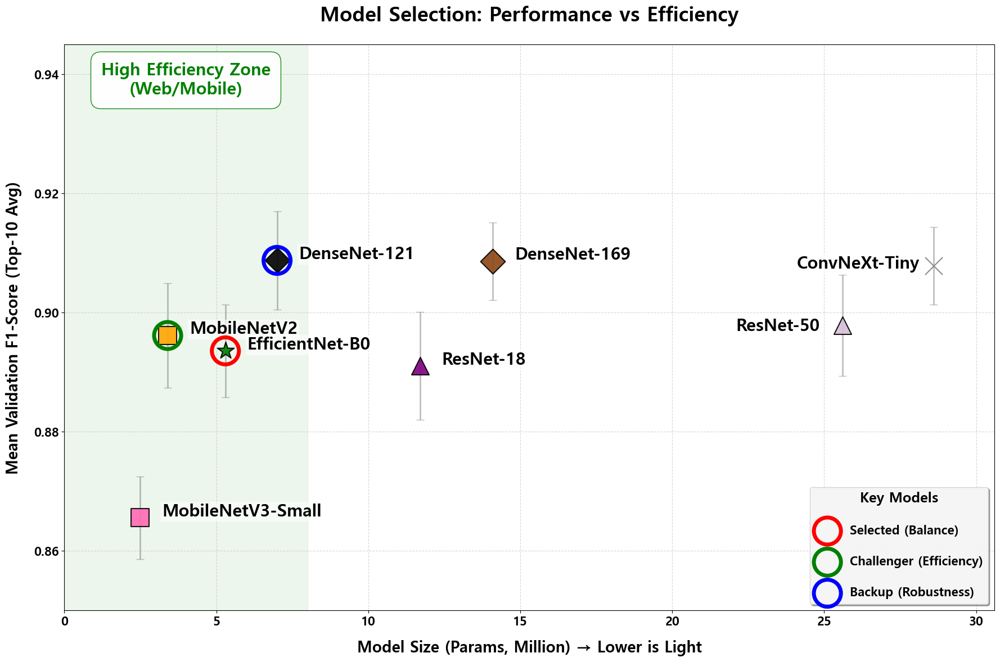

In [97]:
# [Cell Final] 모델 성능 vs 효율성 다이어그램 (수동 정렬 & 레이아웃 최적화) - (모델별 심벌/색상 고정 버전)

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import os
import sys

# -----------------------------------------------------------------------------
# 0. 환경 설정
# -----------------------------------------------------------------------------
# 한글 폰트 설정
if sys.platform == 'win32':
    plt.rcParams['font.family'] = 'Malgun Gothic'
elif sys.platform == 'darwin':
    plt.rcParams['font.family'] = 'AppleGothic'
else:
    plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False

ROOT_DIR = os.getcwd()
RESULT_DIR = os.path.join(ROOT_DIR, 'Result')

# -----------------------------------------------------------------------------
# 1. 모델 스펙 정의
# -----------------------------------------------------------------------------
MODEL_SPECS = {
    'MobileNetV3-Small': 2.5, 'MobileNetV2': 3.4, 'EfficientNet-B0': 5.3,
    'DenseNet-121': 7.0, 'ResNet-18': 11.7, 'DenseNet-169': 14.1,
    'ResNet-50': 25.6, 'ConvNeXt-Tiny': 28.6
}

# -----------------------------------------------------------------------------
# 1-1. ✅ 모델별 심벌/색상 고정
# -----------------------------------------------------------------------------
MODEL_MARKERS = {
    'MobileNetV3-Small': 's',  # 사각형
    'MobileNetV2':       's',  # 사각형
    'DenseNet-121':      'D',  # 
    'DenseNet-169':      'D',  # 
    'ResNet-18':         '^',  # 
    'ResNet-50':         '^',  # 
    'EfficientNet-B0':   '*',  # 별표
    'ConvNeXt-Tiny':     'x',  # 
}

MODEL_COLORS_FIXED = {
    'MobileNetV3-Small': 'hotpink',     # 분홍색
    'MobileNetV2':       'orange',      # 주황색
    'DenseNet-121':      'black',       # 흑색
    'DenseNet-169':      'saddlebrown', # 갈색
    'ResNet-18':         'purple',      # 보라색
    'ResNet-50':         'thistle',     # 연보라색 (lavender/plum도 가능)
    'EfficientNet-B0':   'green',       # 녹색
    'ConvNeXt-Tiny':     'gray',        # 회색
}

# -----------------------------------------------------------------------------
# 2. 데이터 추출
# -----------------------------------------------------------------------------
TOP_K = 10
model_data = []

print(f"\n>> 학습 로그 분석 및 데이터 추출 중...")
for model_name, params in MODEL_SPECS.items():
    csv_path = os.path.join(RESULT_DIR, f"{model_name}_log.csv")
    if not os.path.exists(csv_path):
        alt_path = os.path.join(ROOT_DIR, 'Result_toward', f"{model_name}_log.csv")
        csv_path = alt_path if os.path.exists(alt_path) else None

    if csv_path:
        try:
            df = pd.read_csv(csv_path)
            target_col = next(
                (c for c in df.columns if c.lower().replace(' ', '').replace('_', '') in
                 ['validf1', 'valf1', 'f1score', 'f1']),
                None
            )

            if target_col:
                top_f1 = df[target_col].nlargest(TOP_K)
                std_val = top_f1.std() if len(top_f1) > 1 else 0.0

                model_data.append({
                    'Model': model_name,
                    'Params (M)': params,
                    'F1_Mean': top_f1.mean(),
                    'F1_Std': std_val
                })
        except:
            pass

# -----------------------------------------------------------------------------
# 3. 다이어그램 그리기
# -----------------------------------------------------------------------------
if model_data:
    df_results = pd.DataFrame(model_data)

    def plot_efficiency_scatter_manual(df):
        plt.figure(figsize=(18, 12))  # 세로 길이도 넉넉하게

        # 3.1. 에러바
        plt.errorbar(
            df['Params (M)'], df['F1_Mean'], yerr=df['F1_Std'],
            fmt='none', ecolor='gray', elinewidth=2, capsize=5,
            alpha=0.5, zorder=1
        )

        # ✅ 3.1. 산점도 (모델별 마커/색 수동 지정)
        for _, row in df.iterrows():
            m = row['Model']
            x = row['Params (M)']
            y = row['F1_Mean']

            marker = MODEL_MARKERS.get(m, 'o')
            color = MODEL_COLORS_FIXED.get(m, 'black')

            plt.scatter(
                x, y,
                s=500,
                marker=marker,
                c=color,
                alpha=0.9,
                edgecolors='black',
                linewidth=1.5,
                zorder=5
            )

        # 3.2. 핵심 모델 강조 (Ring)
        RING_SIZE = 1200   # ✅ 여기 숫자를 키우면 링이 커짐 (예: 800 -> 1300 -> 1800)
        RING_LW   = 5      # ✅ 링 두께(선 굵기)

        highlights = [
            ('EfficientNet-B0', 'red', 'Selected (Balance)'),
            ('MobileNetV2', 'green', 'Challenger (Efficiency)'),
            ('DenseNet-121', 'blue', 'Backup (Robustness)')
        ]

        for model, ring_color, label_txt in highlights:
            if model in df['Model'].values:
                row = df[df['Model'] == model].iloc[0]
                plt.scatter(
                    row['Params (M)'], row['F1_Mean'],
                    s=RING_SIZE, facecolors='none',
                    edgecolors=ring_color, linewidth=RING_LW,
                    zorder=10, label=label_txt
                )

        # 3.3. 텍스트 라벨링 (수동 우측 배치)

        LABEL_FS = 22          # ✅ 모델명 글자 크기
        X_OFFSET = 0.72         # ✅ 기본 x 이동(오른쪽으로)
        Y_OFFSET = 0.001         # ✅ 기본 y 이동(위/아래)
        BBOX_ALPHA = 0.6       # ✅ 라벨 박스 투명도

        for i in range(df.shape[0]):
            x_pos = df['Params (M)'][i]
            y_pos = df['F1_Mean'][i]
            model_name = df['Model'][i]

            # (선택) 특정 모델만 따로 위치 조정하고 싶으면:
            x_off, y_off = X_OFFSET, Y_OFFSET
            if model_name == 'ResNet-50':
                x_off = -3.5
                y_off = -0.0002
            if model_name == 'ConvNeXt-Tiny':
                x_off = -4.5
                y_off = 0.0003

            plt.text(
                x_pos + x_off, y_pos + y_off, model_name,
                fontsize=LABEL_FS, fontweight='bold',
                ha='left', va='center',  # ✅ 정렬(좌/우/중앙, 위/중앙/아래)
                bbox=dict(facecolor='white', alpha=BBOX_ALPHA, edgecolor='none', pad=2)
            )

        # 3.4. 영역 표시 (High Efficiency Zone) - 상단 배치
        y_min = (df['F1_Mean'] - df['F1_Std']).min()
        y_max = (df['F1_Mean'] + df['F1_Std']).max()

        y_bottom = y_min - 0.01
        y_top = y_max + 0.01

        # 초록색 영역 (0~8M)
        plt.axvspan(-2, 8, color='green', alpha=0.07)

        plt.text(
            4, y_top + 0.015,
            "High Efficiency Zone\n(Web/Mobile)",
            color='green', fontsize=22, fontweight='bold',
            va='top', ha='center',
            bbox=dict(facecolor='white', alpha=0.9, edgecolor='green',
                      boxstyle='round,pad=0.6')
        )

        # 3.5. 타이틀 및 축
        plt.title("Model Selection: Performance vs Efficiency", fontsize=26, fontweight='bold', pad=30)
        plt.xlabel("Model Size (Params, Million) → Lower is Light", fontsize=20, fontweight='bold', labelpad=15)
        plt.ylabel("Mean Validation F1-Score (Top-10 Avg)", fontsize=20, fontweight='bold', labelpad=15)

        max_params = df['Params (M)'].max()
        plt.xlim(0, max_params + 2)
        Y_MIN, Y_MAX = 0.85, 0.945
        plt.ylim(Y_MIN, Y_MAX)

        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tick_params(axis='both', which='major', labelsize=16)

        # 범례 (우측 하단) - 링(핵심 모델) 범례만 표시
        plt.legend(
            loc='lower right', fontsize=16, labelspacing=1.5,
            framealpha=0.9, shadow=True,
            title="Key Models", title_fontsize=18
        )

        plt.tight_layout()
        save_path = os.path.join(RESULT_DIR, "Model_Selection_Diagram_initial_Manual.png")
        plt.savefig(save_path, dpi=300)
        print(f">> 그래프 저장 완료: {save_path}")
        plt.show()

    plot_efficiency_scatter_manual(df_results)
else:
    print("!! 데이터가 없습니다.")
